# Data Prediction Using LSTM, GRU, and RNN

## Data Preparation

### Import all library used 

In [80]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from keras.optimizers import SGD
import math
from sklearn.metrics import mean_squared_error
sc = MinMaxScaler(feature_range=(0,1)) #normalisasi dari 0 - 1

### Path for Data

In [8]:
data_path = "../data_after_prep"

### Get Data from path

In [9]:
list_data = os.listdir(data_path)
list_data

['ADRO2001-2407.csv',
 'AMMN2001-2407.csv',
 'AMRT2001-2407.csv',
 'ASII2001-2407.csv',
 'BBCA2001-2407.csv',
 'GOTO2001-2407.csv',
 'KLBF2001-2407.csv',
 'MAPI2001-2407.csv',
 'TLKM2001-2407.csv']

### Dataset for each stock code

In [10]:
ADRO = pd.read_csv(data_path + "/" + list_data[0], index_col='date', parse_dates=['date'])
AMMN = pd.read_csv(data_path + "/" + list_data[1], index_col='date', parse_dates=['date'])
AMRT = pd.read_csv(data_path + "/" + list_data[2], index_col='date', parse_dates=['date'])
ASII = pd.read_csv(data_path + "/" + list_data[3], index_col='date', parse_dates=['date'])
BBCA = pd.read_csv(data_path + "/" + list_data[4], index_col='date', parse_dates=['date'])
GOTO = pd.read_csv(data_path + "/" + list_data[5], index_col='date', parse_dates=['date'])
KLBF = pd.read_csv(data_path + "/" + list_data[6], index_col='date', parse_dates=['date'])
MAPI = pd.read_csv(data_path + "/" + list_data[7], index_col='date', parse_dates=['date'])
TLKM = pd.read_csv(data_path + "/" + list_data[8], index_col='date', parse_dates=['date'])



### Method for see data and see RMSE

In [93]:
# Some functions to help out with
def plot_predictions(stock_title,test,predicted, title):
    plt.plot(test, color='red',label='Real '+ stock_title+' Stock Price')
    plt.plot(predicted, color='blue',label='Predicted '+ stock_title+' Stock Price')
    plt.title(stock_title + ' Stock Price Prediction '+title)
    plt.xlabel('Time')
    plt.ylabel(stock_title +' Stock Price')
    plt.legend()
    plt.show()

def return_rmse(test,predicted):
    rmse = math.sqrt(mean_squared_error(test, predicted))
    print("The root mean squared error is {}.".format(rmse))
    return rmse

def return_rmse_norm(test, pred):
    len_pred = len(pred)
    #pred = pred.reshape(len_pred)
    total = np.concatenate((pred, test))
    #total = total.reshape(-1,1)
    total = sc.fit_transform(total)
    arr_pred = total[len_pred:]
    arr_test = total[:len_pred]
    rmse = math.sqrt(mean_squared_error(arr_test, arr_pred))
    print("The root mean squared error after normalization is {}.".format(rmse))
    return rmse

### Result DataFrame

In [200]:
dic_res = {'stock' : [], 'term' : [], 'algorithm': [], 'rmse' : [], 'rmse_norm' : []}

## Short Term Predictions
Short term prediction using in this program is prediction in the week in a month.
Data use for this predictions is data in July 2024.
Data train and test is:
1. Data Train
    * Week 1: 1 - 5 July 2024
    * Week 2: 8 - 12 July 2024
    * Week 3: 15 - 19 July 2024
2. Data Test
    * Week 4: 22 - 26 July 2024 
    * Week 5: 29 - 31 July 2024

### ADRO

In [693]:
ADRO.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,ADRO,1555,1555,1490,1495,76612000
2020-01-03,ADRO,1495,1470,1425,1465,117795600
2020-01-06,ADRO,1465,1515,1450,1465,61423200
2020-01-07,ADRO,1465,1540,1460,1540,74336500
2020-01-08,ADRO,1540,1535,1505,1505,55121100


#### Data Split

In [694]:
ADRO_short_train = ADRO["2024-07-01":"2024-07-19"].iloc[:,3:4].values
ADRO_short_test = ADRO["2024-07-19":"2024-07-31"].iloc[:,3:4].values

##### Plot Train Test Data for ADRO

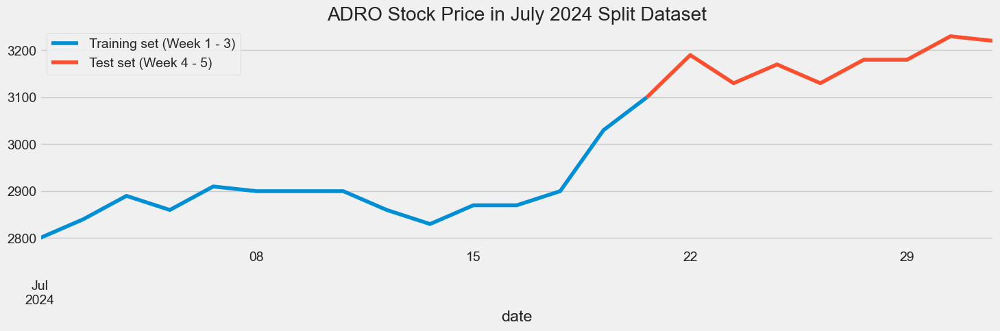

In [695]:
ADRO["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
ADRO["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('ADRO Stock Price in July 2024 Split Dataset')
plt.show()

##### Normalize Train Dataset

In [696]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ADRO_short_train)

##### Dataset Length

In [697]:
len_train = len(ADRO_short_train)
len_test = len(ADRO_short_test)
print(len_train, len_test)

15 9


#### LSTM Predictions

##### 5 Timestep Dataset Preparation

In [698]:
# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

##### Reshaping


In [699]:
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

##### LSTM Architecture

In [700]:
# The LSTM architecture
regressorLSTM = Sequential()
# First LSTM layer with Dropout regularisation
regressorLSTM.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressorLSTM.add(Dropout(0.2))
# Second LSTM layer
regressorLSTM.add(LSTM(units=50, return_sequences=True))
regressorLSTM.add(Dropout(0.2))
# Third LSTM layer
regressorLSTM.add(LSTM(units=50, return_sequences=True))
regressorLSTM.add(Dropout(0.2))
# Fourth LSTM layer
regressorLSTM.add(LSTM(units=50))
regressorLSTM.add(Dropout(0.2))
# The output layer
regressorLSTM.add(Dense(units=1))

# Compiling the RNN
regressorLSTM.compile(optimizer='rmsprop',loss='mean_squared_error')
# Fitting to the training set
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 9s 9s/step - loss: 0.2184
Epoch 2/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1892
Epoch 3/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1672
Epoch 4/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1465
Epoch 5/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1285
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1073
Epoch 7/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0879
Epoch 8/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0796
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0668
Epoch 10/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0522
Epoch 11/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0523
Epoch 12/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0489
Epoch 13/50
1/1 [==============================] - 0s 20ms/step

In [701]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 5 entires of test set have 5 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

"""
ADRO_short_train = ADRO["2024-07-01":"2024-07-19"].iloc[:,3:4].values
ADRO_short_test = ADRO["2024-07-22":"2024-07-31"].iloc[:,3:4].values
"""
dataset_total = pd.concat((ADRO["close"]["2024-07-01":"2024-07-19"],ADRO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

In [702]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

1/1 [==============================] - 3s 3s/step


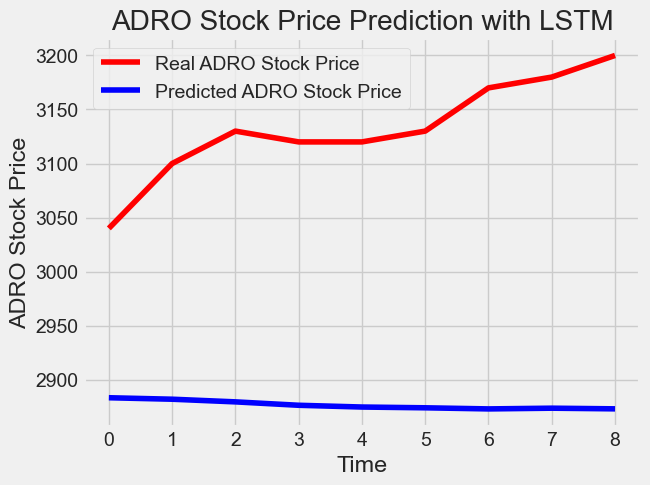

In [703]:
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ADRO', ADRO_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2161622775.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


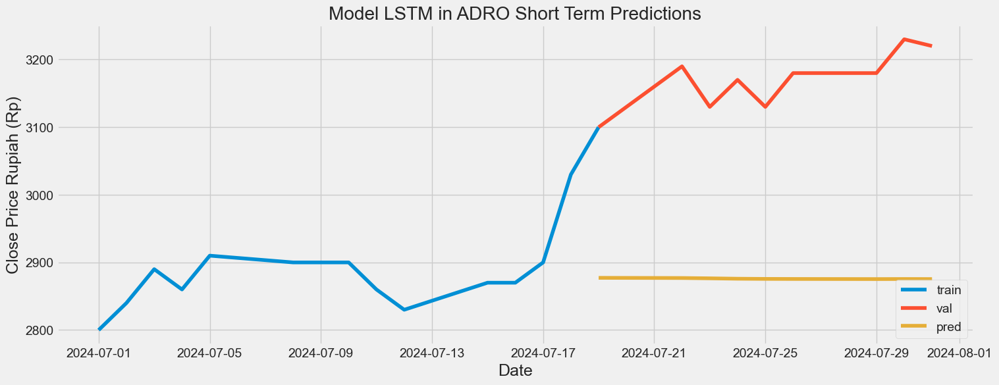

In [212]:
# Visualize the data
# Plot the data
train = ADRO["2024-07-01":"2024-07-19"]
valid = ADRO["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ADRO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [213]:
# Evaluating the sequence
rmse = return_rmse(ADRO_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 260.23580553636384.
The root mean squared error after normalization is 0.8016396848847667.


#### GRU Predictions

In [704]:
# The GRU architecture
regressorGRU = Sequential()
# First GRU layer with Dropout regularisation
regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))
# Second GRU layer
regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))
# Third GRU layer
regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))
# Fourth GRU layer
regressorGRU.add(GRU(units=50, activation='tanh'))
regressorGRU.add(Dropout(0.2))
# The output layer
regressorGRU.add(Dense(units=1))
# Compiling the RNN
regressorGRU.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=False),loss='mean_squared_error')
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 10s 10s/step - loss: 0.2176
Epoch 2/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1899
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1380
Epoch 4/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0874
Epoch 5/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0554
Epoch 6/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0474
Epoch 7/50
1/1 [==============================] - 0s 8ms/step - loss: 0.0611
Epoch 8/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0579
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0891
Epoch 10/50
1/1 [==============================] - 0s 29ms/step - loss: 0.1053
Epoch 11/50
1/1 [==============================] - 0s 37ms/step - loss: 0.1044
Epoch 12/50
1/1 [==============================] - 0s 26ms/step - loss: 0.0895
Epoch 13/50
1/1 [==============================] - 0s 24ms/ste

In [706]:
dataset_total = pd.concat((ADRO["close"]["2024-07-01":"2024-07-19"],ADRO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)


# Preparing X_test and predicting the prices
X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
                       
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

1/1 [==============================] - 0s 46ms/step


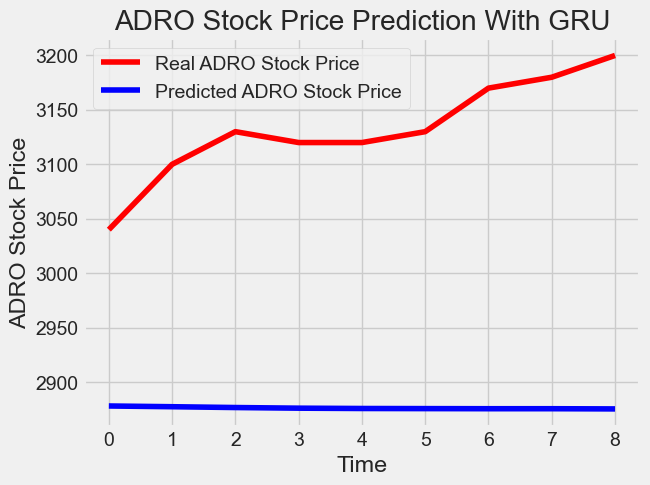

In [707]:
# Visualizing the results for GRU
gru_title = "With GRU"
plot_predictions("ADRO", ADRO_short_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\421449403.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


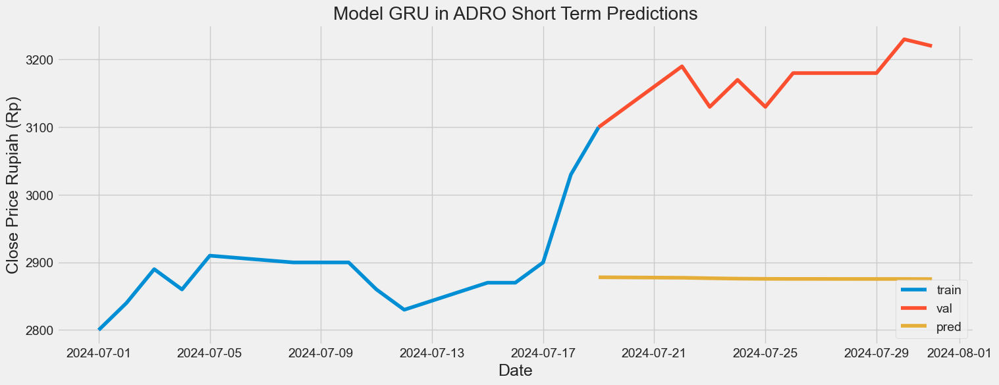

In [708]:
# Visualize the data
# Plot the data
train = ADRO["2024-07-01":"2024-07-19"]
valid = ADRO["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ADRO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [710]:
# Evaluating the sequence

rmse = return_rmse(ADRO_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 260.0790202346336.
The root mean squared error after normalization is 0.8010759886187708.


#### RNN Predictions

In [711]:
# importing libraries
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import Dropout

# initializing the RNN
regressorRNN = Sequential()

# adding first RNN layer and dropout regulatization
regressorRNN.add(
    SimpleRNN(units = 50, 
              activation = "tanh", 
              return_sequences = True, 
              input_shape = (X_train.shape[1],1))
             )

regressorRNN.add(
    Dropout(0.2)
             )


# adding second RNN layer and dropout regulatization

regressorRNN.add(
    SimpleRNN(units = 50, 
              activation = "tanh", 
              return_sequences = True)
             )

regressorRNN.add(
    Dropout(0.2)
             )

# adding third RNN layer and dropout regulatization

regressorRNN.add(
    SimpleRNN(units = 50, 
              activation = "tanh", 
              return_sequences = True)
             )

regressorRNN.add(
    Dropout(0.2)
             )

# adding fourth RNN layer and dropout regulatization

regressorRNN.add(
    SimpleRNN(units = 50)
             )

regressorRNN.add(
    Dropout(0.2)
             )

# adding the output layer
regressorRNN.add(Dense(units = 1))

# compiling RNN
regressorRNN.compile(
    optimizer = "adam", 
    loss = "mean_squared_error",
    metrics = ["accuracy"])

# fitting the RNN
history = regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)


Epoch 1/50
1/1 [==============================] - 5s 5s/step - loss: 0.7604 - accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - 0s 11ms/step - loss: 0.3218 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 14ms/step - loss: 0.6648 - accuracy: 0.1000
Epoch 4/50
1/1 [==============================] - 0s 15ms/step - loss: 0.5674 - accuracy: 0.1000
Epoch 5/50
1/1 [==============================] - 0s 17ms/step - loss: 0.4131 - accuracy: 0.0000e+00
Epoch 6/50
1/1 [==============================] - 0s 24ms/step - loss: 0.1631 - accuracy: 0.0000e+00
Epoch 7/50
1/1 [==============================] - 0s 17ms/step - loss: 0.4570 - accuracy: 0.0000e+00
Epoch 8/50
1/1 [==============================] - 0s 15ms/step - loss: 0.4624 - accuracy: 0.0000e+00
Epoch 9/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1881 - accuracy: 0.0000e+00
Epoch 10/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1783 - accuracy: 0.0000e+00

In [712]:

dataset_total = pd.concat((ADRO["close"]["2024-07-01":"2024-07-19"],ADRO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)


# Preparing X_test and predicting the prices
X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

1/1 [==============================] - 1s 1s/step


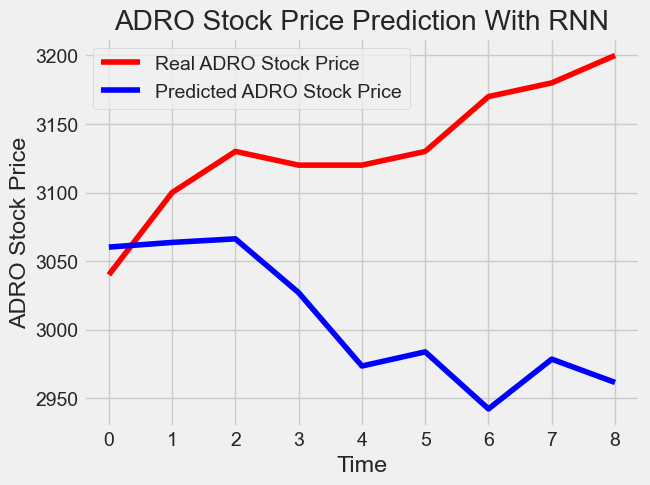

In [713]:

# Visualizing the results for GRU
rnn_title = "With RNN"
plot_predictions("ADRO", ADRO_short_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1127151966.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


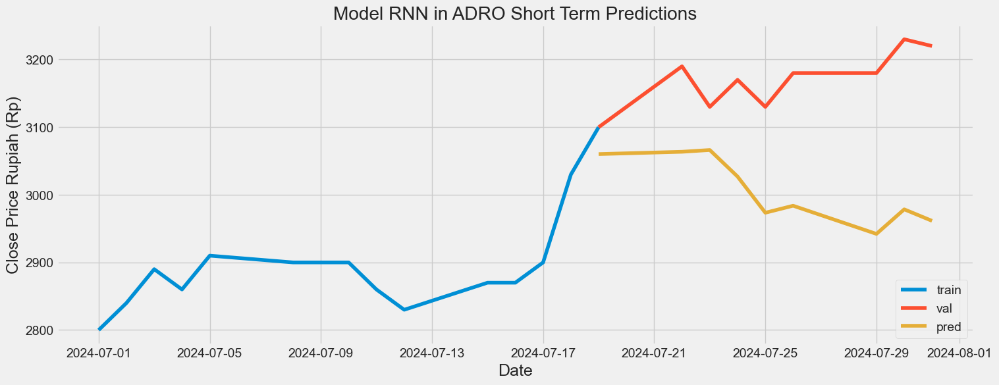

In [714]:
# Visualize the data
# Plot the data
train = ADRO["2024-07-01":"2024-07-19"]
valid = ADRO["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ADRO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [715]:
# Evaluating the sequence
rmse = return_rmse(ADRO_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 151.53064945581656.
The root mean squared error after normalization is 0.5877914267175768.


### AMMN

#### Data Split

In [745]:
AMMN.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2023-07-07,AMMN,1695,1820,1700,1755,411565100
2023-07-10,AMMN,1755,1765,1745,1750,59010700
2023-07-11,AMMN,1750,1760,1750,1750,34028600
2023-07-12,AMMN,1750,1765,1750,1765,27860100
2023-07-13,AMMN,1765,1765,1750,1760,41745700


In [746]:
AMMN_short_train = AMMN["2024-07-01":"2024-07-19"].iloc[:,3:4].values
AMMN_short_test = AMMN["2024-07-19":"2024-07-31"].iloc[:,3:4].values

##### Plot Train Test Data for AMMN

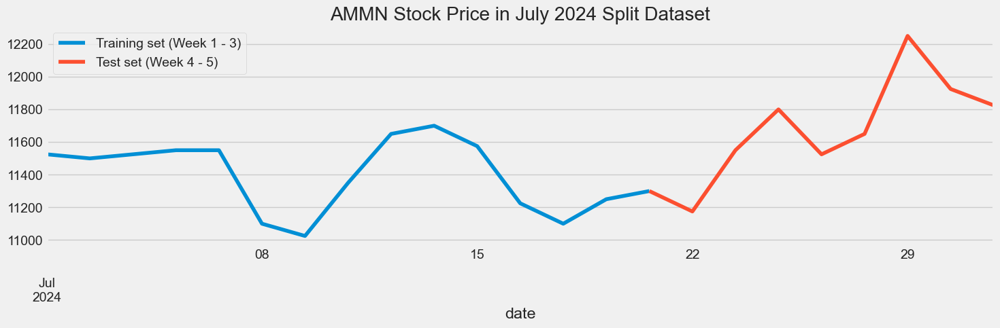

In [747]:
AMMN["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
AMMN["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('AMMN Stock Price in July 2024 Split Dataset')
plt.show()

In [748]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMMN_short_train)
len_train = len(AMMN_short_train)
len_test = len(AMMN_short_test)
print(len_train, len_test)

15 9


In [749]:
# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

#### LSTM Predictions

In [750]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 25ms/step - loss: 0.1057
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0776
Epoch 3/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0791
Epoch 4/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0677
Epoch 5/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0856
Epoch 6/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0760
Epoch 7/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0746
Epoch 8/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0797
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0746
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0773
Epoch 11/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0894
Epoch 12/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0763
Epoch 13/50
1/1 [==============================] - 0s 18ms/st

1/1 [==============================] - 0s 41ms/step


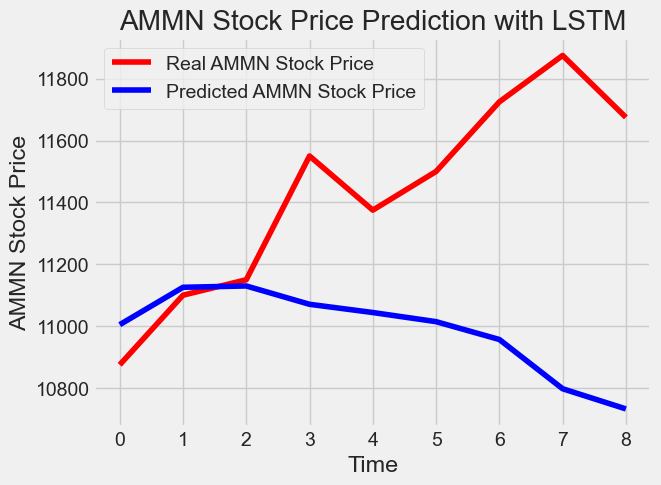

In [751]:
dataset_total = pd.concat((AMMN["close"]["2024-07-01":"2024-07-19"],AMMN["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('AMMN', AMMN_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3088982548.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


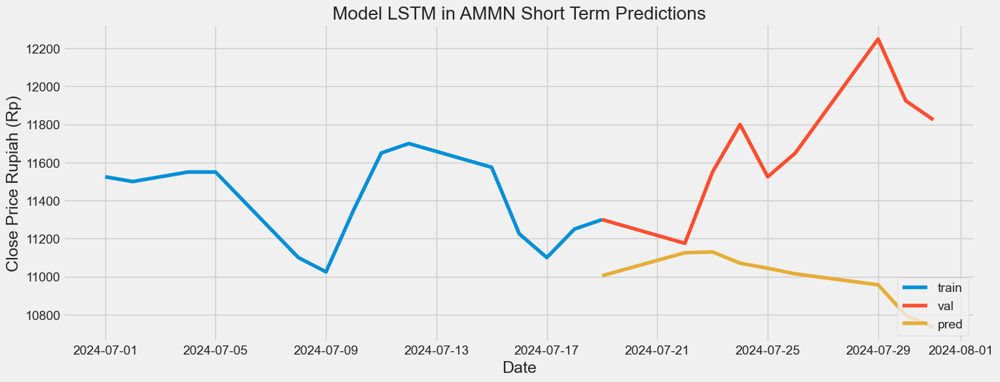

In [752]:
# Visualize the data
# Plot the data
train = AMMN["2024-07-01":"2024-07-19"]
valid = AMMN["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMMN Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [753]:
# Evaluating the sequence
rmse = return_rmse(AMMN_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 599.3138876123485.
The root mean squared error after normalization is 0.5245147093918571.


#### GRU Predictions

In [754]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0802
Epoch 2/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0841
Epoch 3/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0896
Epoch 4/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0828
Epoch 5/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0891
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0728
Epoch 7/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1012
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0918
Epoch 9/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0769
Epoch 10/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1027
Epoch 11/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0856
Epoch 12/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0850
Epoch 13/50
1/1 [==============================] - 0s 14ms/st

1/1 [==============================] - 0s 67ms/step


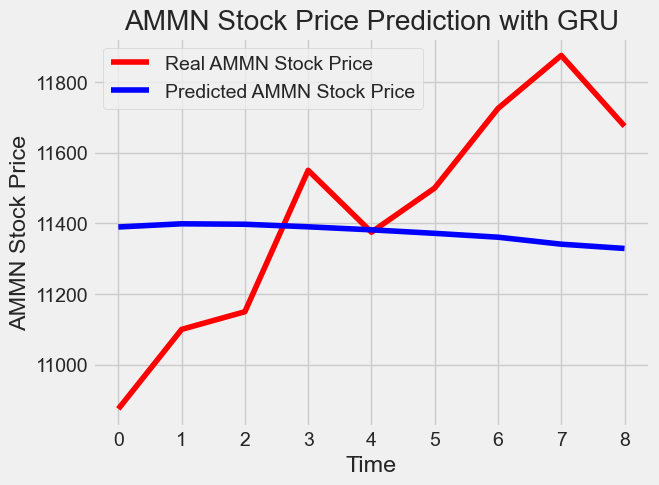

In [755]:
dataset_total = pd.concat((AMMN["close"]["2024-07-01":"2024-07-19"],AMMN["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('AMMN', AMMN_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\197209116.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


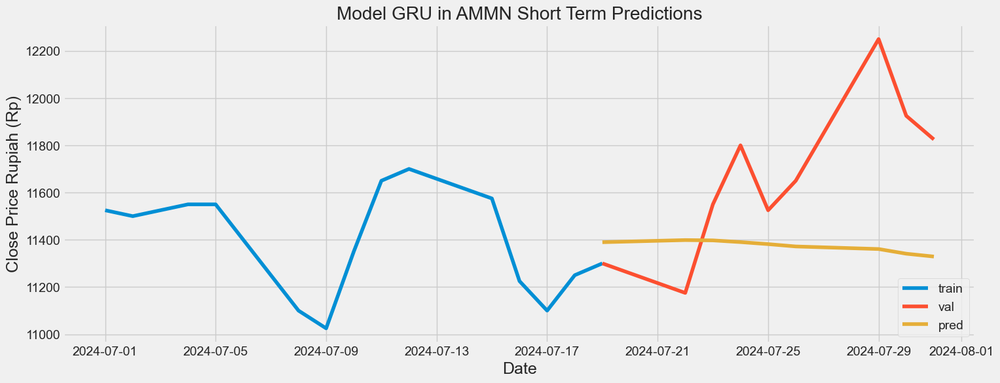

In [756]:
# Visualize the data
# Plot the data
train = AMMN["2024-07-01":"2024-07-19"]
valid = AMMN["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMMN Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [757]:
# Evaluating the sequence

rmse = return_rmse(AMMN_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 332.4844730569729.
The root mean squared error after normalization is 0.33248447305697304.


#### RNN Predictions

In [758]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 19ms/step - loss: 0.2425 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1469 - accuracy: 0.2000
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.3487 - accuracy: 0.0000e+00
Epoch 4/50
1/1 [==============================] - 0s 10ms/step - loss: 0.2026 - accuracy: 0.1000
Epoch 5/50
1/1 [==============================] - 0s 12ms/step - loss: 0.2181 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1105 - accuracy: 0.2000
Epoch 7/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1347 - accuracy: 0.2000
Epoch 8/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1276 - accuracy: 0.2000
Epoch 9/50
1/1 [==============================] - 0s 12ms/step - loss: 0.6713 - accuracy: 0.0000e+00
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.1205 - accuracy: 0.2000
Epoch 11/50
1/1 [====

1/1 [==============================] - 0s 72ms/step


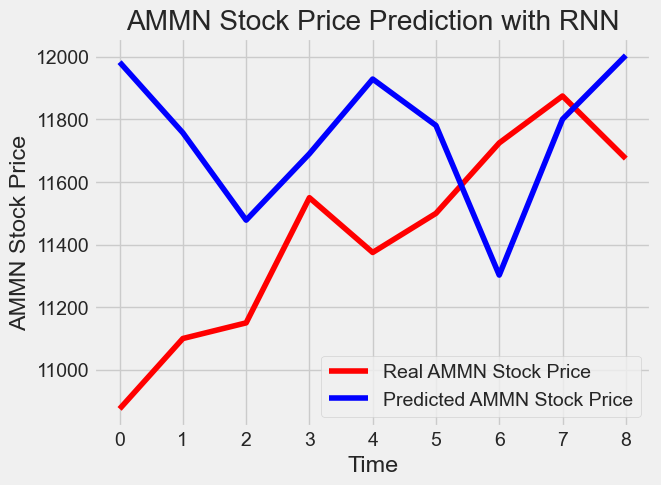

In [759]:
dataset_total = pd.concat((AMMN["close"]["2024-07-01":"2024-07-19"],AMMN["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('AMMN', AMMN_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3390390207.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


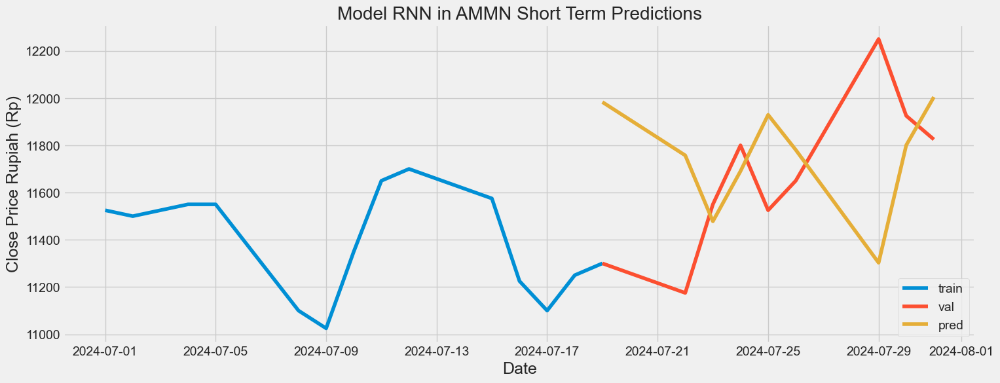

In [760]:
# Visualize the data
# Plot the data
train = AMMN["2024-07-01":"2024-07-19"]
valid = AMMN["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMMN Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [761]:
# Evaluating the sequence
rmse = return_rmse(AMMN_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 523.4785235386051.
The root mean squared error after normalization is 0.46342233754345896.


### AMRT

In [762]:
AMRT.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,AMRT,880,880,855,875,9600
2020-01-03,AMRT,875,880,855,865,51800
2020-01-06,AMRT,865,865,845,845,42000
2020-01-07,AMRT,845,850,840,840,20500
2020-01-08,AMRT,840,855,840,855,568500


#### Data Split

In [763]:
AMRT_short_train = AMRT["2024-07-01":"2024-07-19"].iloc[:,3:4].values
AMRT_short_test = AMRT["2024-07-19":"2024-07-31"].iloc[:,3:4].values

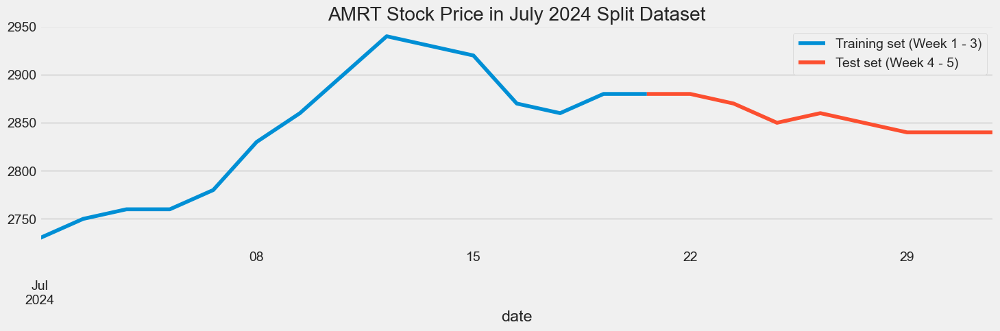

In [764]:
AMRT["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
AMRT["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('AMRT Stock Price in July 2024 Split Dataset')
plt.show()

In [765]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMRT_short_train)
len_train = len(AMRT_short_train)
len_test = len(AMRT_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [766]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1388
Epoch 2/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0649
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0591
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0876
Epoch 5/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0637
Epoch 6/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0601
Epoch 7/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0534
Epoch 8/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0534
Epoch 9/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0523
Epoch 10/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0543
Epoch 11/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0517
Epoch 12/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0596
Epoch 13/50
1/1 [==============================] - 0s 18ms/st

1/1 [==============================] - 0s 58ms/step


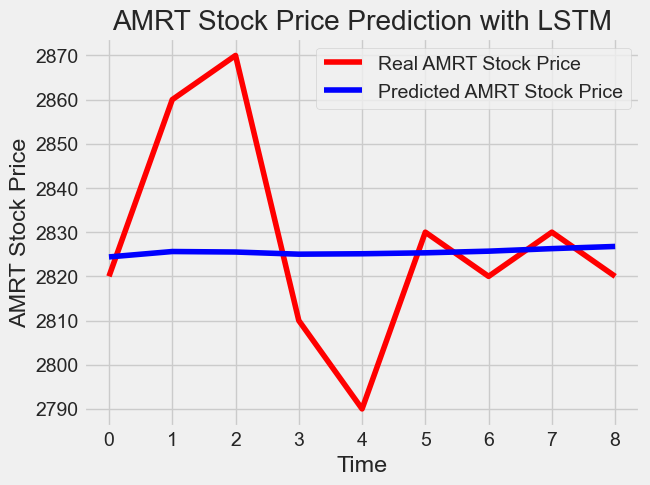

In [768]:
dataset_total = pd.concat((AMRT["close"]["2024-07-01":"2024-07-19"],AMRT["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('AMRT', AMRT_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\566703989.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


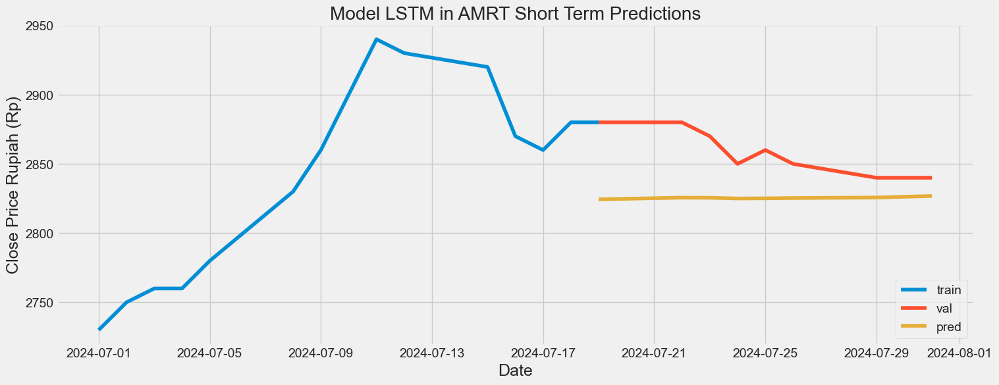

In [770]:
# Visualize the data
# Plot the data
train = AMRT["2024-07-01":"2024-07-19"]
valid = AMRT["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMRT Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [771]:
# Evaluating the sequence
rmse = return_rmse(AMRT_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 22.981477016195356.
The root mean squared error after normalization is 0.28726846270244144.


#### GRU Predictions

In [772]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0637
Epoch 2/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0499
Epoch 3/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0530
Epoch 4/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0514
Epoch 5/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0539
Epoch 6/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0579
Epoch 7/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0485
Epoch 8/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0643
Epoch 9/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0490
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0555
Epoch 11/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0635
Epoch 12/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0574
Epoch 13/50
1/1 [==============================] - 0s 16ms/st

1/1 [==============================] - 0s 50ms/step


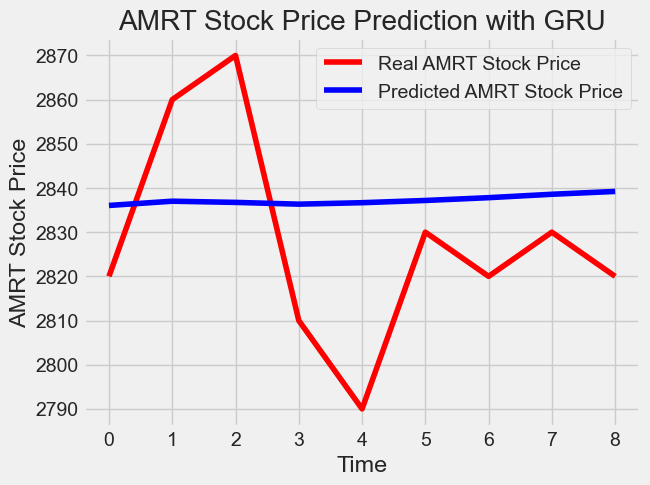

In [773]:
dataset_total = pd.concat((AMRT["close"]["2024-07-01":"2024-07-19"],AMRT["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('AMRT', AMRT_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\73124917.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


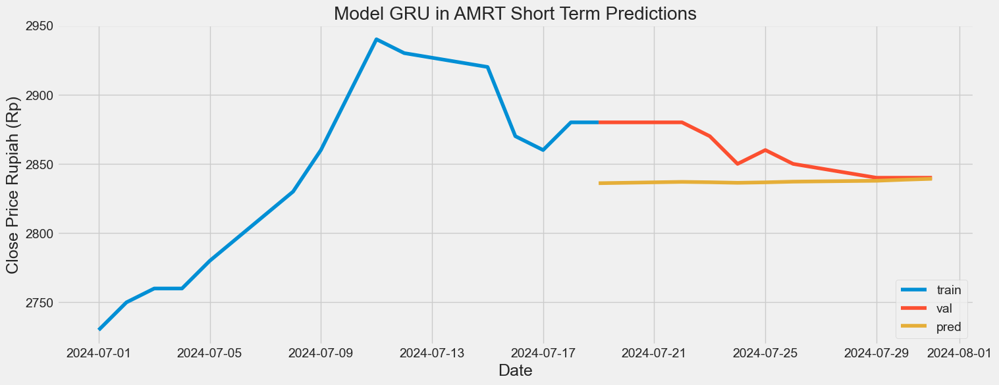

In [774]:
# Visualize the data
# Plot the data
train = AMRT["2024-07-01":"2024-07-19"]
valid = AMRT["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMRT Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [775]:
# Evaluating the sequence

rmse = return_rmse(AMRT_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 24.892022621591494.
The root mean squared error after normalization is 0.3111502827698948.


#### RNN Predictions

In [776]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0894 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1749 - accuracy: 0.1000
Epoch 3/50
1/1 [==============================] - 0s 13ms/step - loss: 0.2897 - accuracy: 0.0000e+00
Epoch 4/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0588 - accuracy: 0.1000
Epoch 5/50
1/1 [==============================] - 0s 10ms/step - loss: 0.1785 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0822 - accuracy: 0.1000
Epoch 7/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1535 - accuracy: 0.1000
Epoch 8/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1303 - accuracy: 0.0000e+00
Epoch 9/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1376 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1974 - accuracy: 0.0000e+00
Epoch 11/50
1/1 [

1/1 [==============================] - 0s 66ms/step


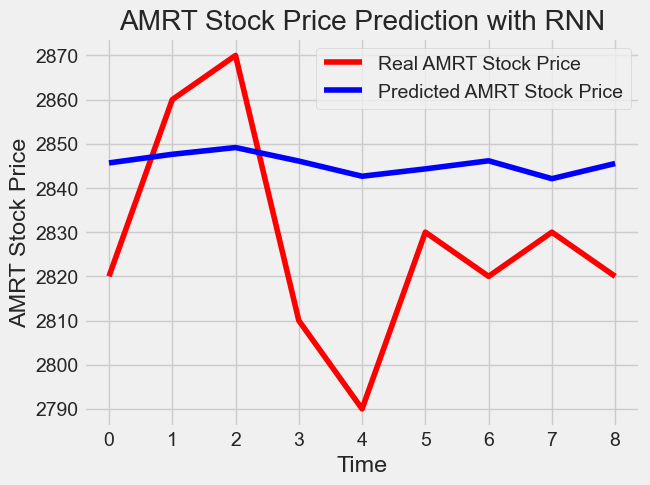

In [777]:
dataset_total = pd.concat((AMRT["close"]["2024-07-01":"2024-07-19"],AMRT["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('AMRT', AMRT_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\486554037.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


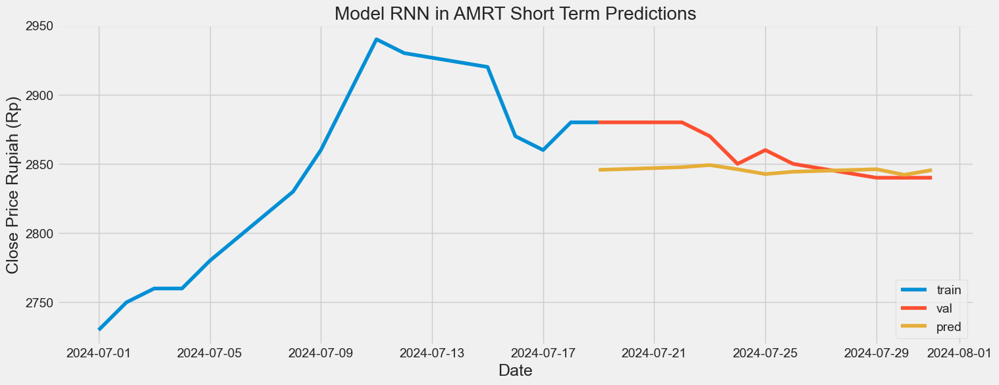

In [778]:
# Visualize the data
# Plot the data
train = AMRT["2024-07-01":"2024-07-19"]
valid = AMRT["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMRT Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [779]:
# Evaluating the sequence
rmse = return_rmse(AMRT_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 27.91220100884933.
The root mean squared error after normalization is 0.348902512610619.


### ASII

In [780]:
ASII.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,ASII,6925,6925,6775,6875,15008600
2020-01-03,ASII,6875,6950,6825,6950,19068800
2020-01-06,ASII,6950,6900,6750,6750,22261900
2020-01-07,ASII,6750,6825,6675,6775,27963000
2020-01-08,ASII,6775,6825,6700,6775,15150400


#### Data Split

In [781]:
ASII_short_train = ASII["2024-07-01":"2024-07-19"].iloc[:,3:4].values
ASII_short_test = ASII["2024-07-19":"2024-07-31"].iloc[:,3:4].values

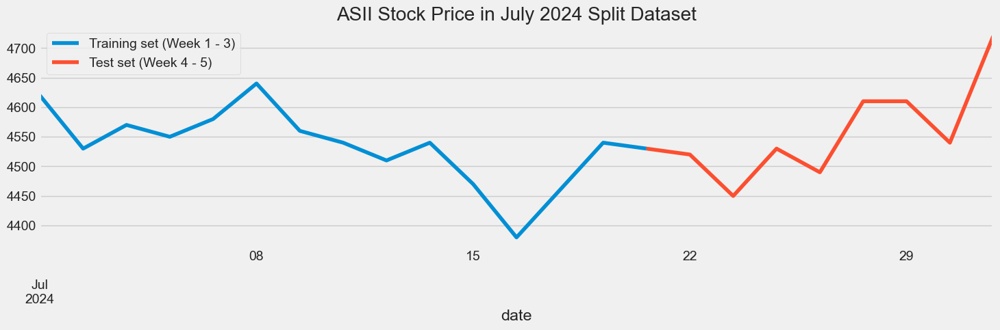

In [782]:
ASII["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
ASII["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('ASII Stock Price in July 2024 Split Dataset')
plt.show()

In [783]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ASII_short_train)
len_train = len(ASII_short_train)
len_test = len(ASII_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [784]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1086
Epoch 2/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0845
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1028
Epoch 4/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1071
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0954
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0884
Epoch 7/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0959
Epoch 8/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1029
Epoch 9/50
1/1 [==============================] - 0s 23ms/step - loss: 0.1081
Epoch 10/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1078
Epoch 11/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0901
Epoch 12/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0850
Epoch 13/50
1/1 [==============================] - 0s 15ms/st

1/1 [==============================] - 0s 33ms/step


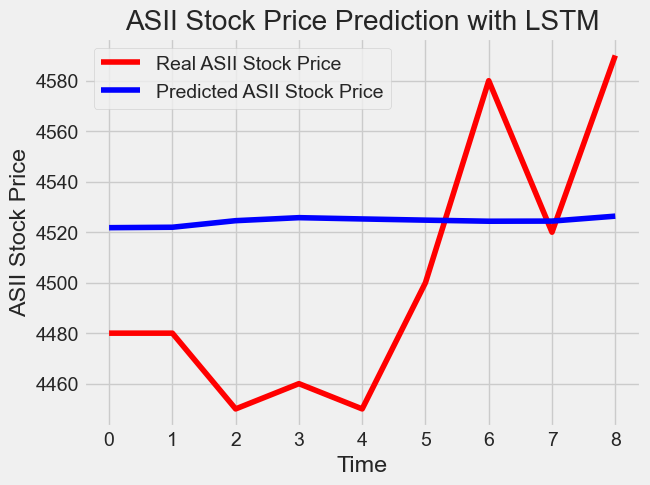

In [788]:
dataset_total = pd.concat((ASII["close"]["2024-07-01":"2024-07-19"],ASII["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ASII', ASII_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2824440461.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


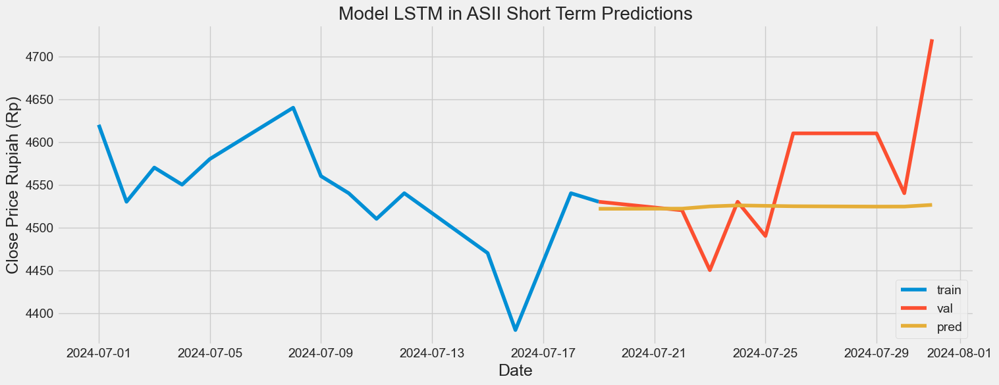

In [789]:
# Visualize the data
# Plot the data
train = ASII["2024-07-01":"2024-07-19"]
valid = ASII["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ASII Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [790]:
# Evaluating the sequence
rmse = return_rmse(ASII_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 54.600988225694046.
The root mean squared error after normalization is 0.3900070587549577.


#### GRU Predictions

In [794]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 49ms/step - loss: 0.0966
Epoch 2/50
1/1 [==============================] - 0s 24ms/step - loss: 0.1124
Epoch 3/50
1/1 [==============================] - 0s 43ms/step - loss: 0.1068
Epoch 4/50
1/1 [==============================] - 0s 34ms/step - loss: 0.0941
Epoch 5/50
1/1 [==============================] - 0s 31ms/step - loss: 0.0890
Epoch 6/50
1/1 [==============================] - 0s 33ms/step - loss: 0.0913
Epoch 7/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0888
Epoch 8/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1036
Epoch 9/50
1/1 [==============================] - 0s 40ms/step - loss: 0.0930
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1039
Epoch 11/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0893
Epoch 12/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1007
Epoch 13/50
1/1 [==============================] - 0s 20ms/st

1/1 [==============================] - 0s 44ms/step


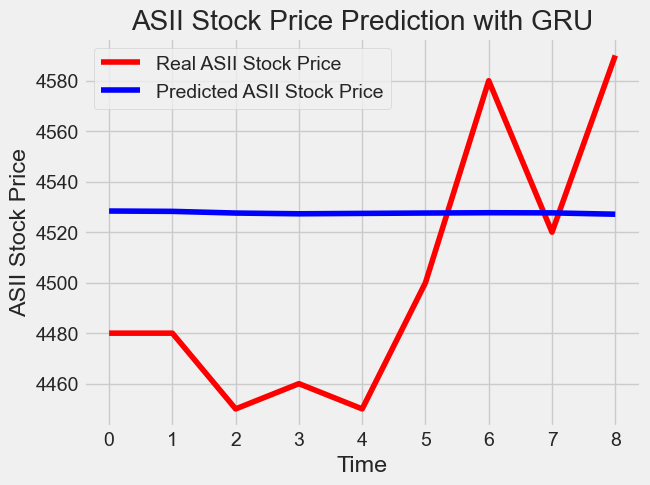

In [795]:
dataset_total = pd.concat((ASII["close"]["2024-07-01":"2024-07-19"],ASII["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('ASII', ASII_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\864325195.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


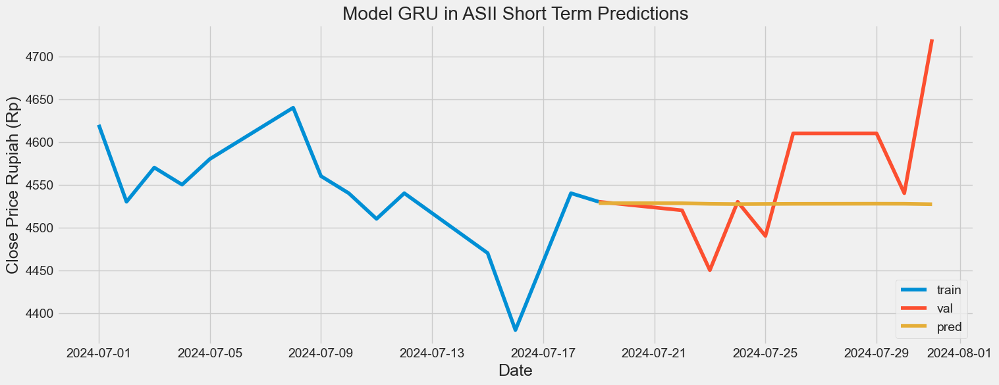

In [796]:
# Visualize the data
# Plot the data
train = ASII["2024-07-01":"2024-07-19"]
valid = ASII["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ASII Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [797]:
# Evaluating the sequence

rmse = return_rmse(ASII_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 56.489509508376734.
The root mean squared error after normalization is 0.40349649648840497.


#### RNN Predictions

In [798]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1221 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1576 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1951 - accuracy: 0.1000
Epoch 4/50
1/1 [==============================] - 0s 11ms/step - loss: 0.1053 - accuracy: 0.2000
Epoch 5/50
1/1 [==============================] - 0s 12ms/step - loss: 0.2199 - accuracy: 0.2000
Epoch 6/50
1/1 [==============================] - 0s 11ms/step - loss: 0.1146 - accuracy: 0.2000
Epoch 7/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1663 - accuracy: 0.1000
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1259 - accuracy: 0.1000
Epoch 9/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1085 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.1662 - accuracy: 0.1000
Epoch 11/50
1/1 [========

1/1 [==============================] - 0s 64ms/step


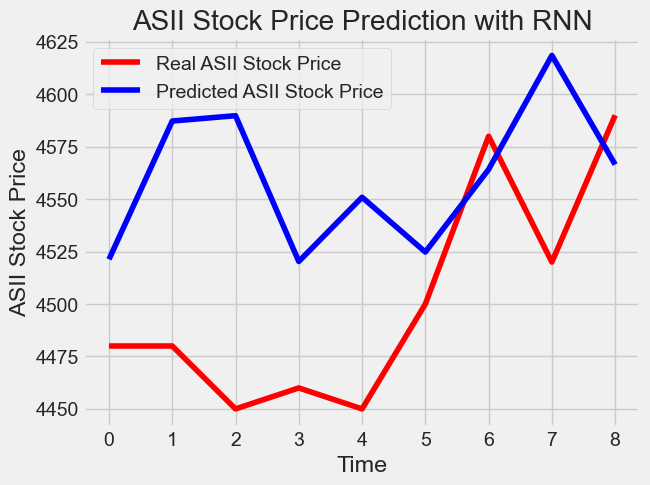

In [799]:
dataset_total = pd.concat((ASII["close"]["2024-07-01":"2024-07-19"],ASII["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('ASII', ASII_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\203231731.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


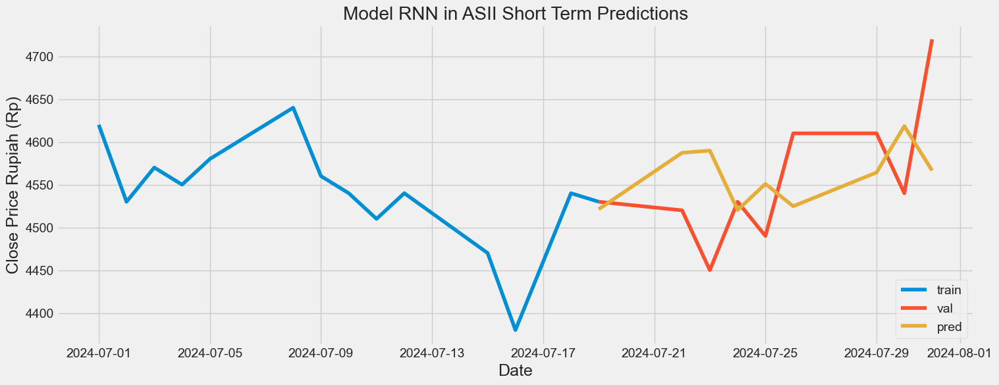

In [800]:
# Visualize the data
# Plot the data
train = ASII["2024-07-01":"2024-07-19"]
valid = ASII["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ASII Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [801]:
# Evaluating the sequence
rmse = return_rmse(ASII_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 80.0720258686129.
The root mean squared error after normalization is 0.4751305520015502.


### GOTO

In [802]:
GOTO.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2022-04-11,GOTO,338,416,372,382,9410897000
2022-04-12,GOTO,382,442,360,370,3887331000
2022-04-13,GOTO,370,380,360,374,3262811400
2022-04-14,GOTO,374,382,374,376,3675981900
2022-04-18,GOTO,376,380,370,378,2660312700


#### Data Split

In [803]:
GOTO_short_train = GOTO["2024-07-01":"2024-07-19"].iloc[:,3:4].values
GOTO_short_test = GOTO["2024-07-19":"2024-07-31"].iloc[:,3:4].values

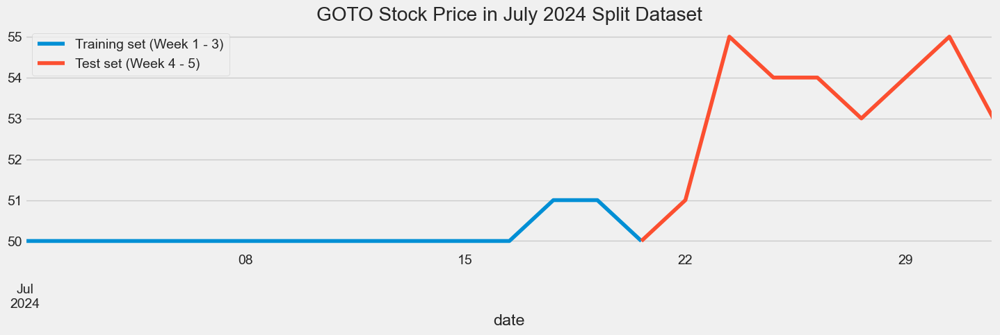

In [804]:
GOTO["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
GOTO["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('GOTO Stock Price in July 2024 Split Dataset')
plt.show()

In [805]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(GOTO_short_train)
len_train = len(GOTO_short_train)
len_test = len(GOTO_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predicitions

In [806]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 23ms/step - loss: 0.2682
Epoch 2/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1435
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1012
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0732
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0618
Epoch 6/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0451
Epoch 7/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0307
Epoch 8/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0239
Epoch 9/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0193
Epoch 10/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0141
Epoch 11/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0084
Epoch 12/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0074
Epoch 13/50
1/1 [==============================] - 0s 15ms/st

1/1 [==============================] - 0s 38ms/step


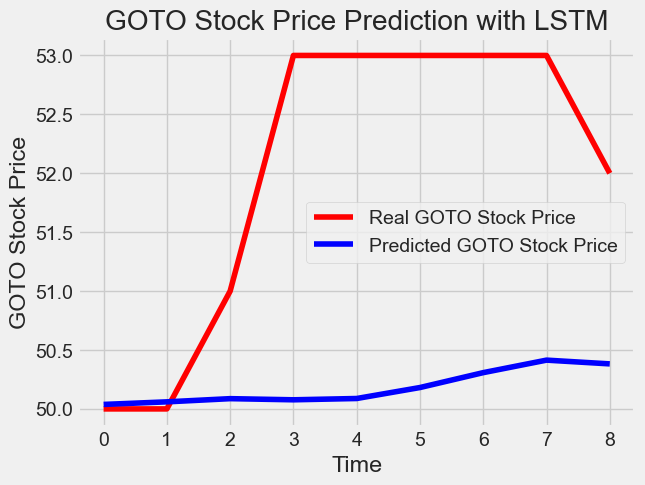

In [807]:
dataset_total = pd.concat((GOTO["close"]["2024-07-01":"2024-07-19"],GOTO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('GOTO', GOTO_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3123027224.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


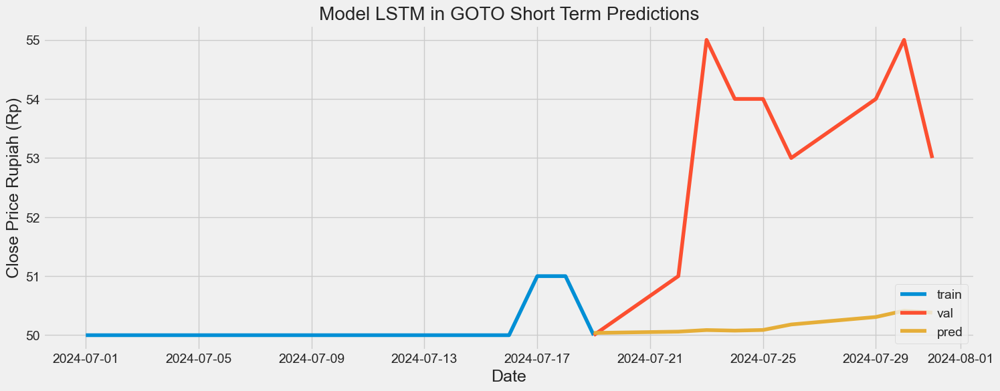

In [808]:
# Visualize the data
# Plot the data
train = GOTO["2024-07-01":"2024-07-19"]
valid = GOTO["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in GOTO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [809]:
# Evaluating the sequence
rmse = return_rmse(GOTO_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 2.1693548956808257.
The root mean squared error after normalization is 0.7231182985602747.


#### GRU Predictions

In [810]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.2829
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.2584
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1890
Epoch 4/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1233
Epoch 5/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0591
Epoch 6/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0139
Epoch 7/50
1/1 [==============================] - 0s 16ms/step - loss: 9.7413e-04
Epoch 8/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0140
Epoch 9/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0392
Epoch 10/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0414
Epoch 11/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0663
Epoch 12/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0944
Epoch 13/50
1/1 [==============================] - 0s 15m

1/1 [==============================] - 0s 44ms/step


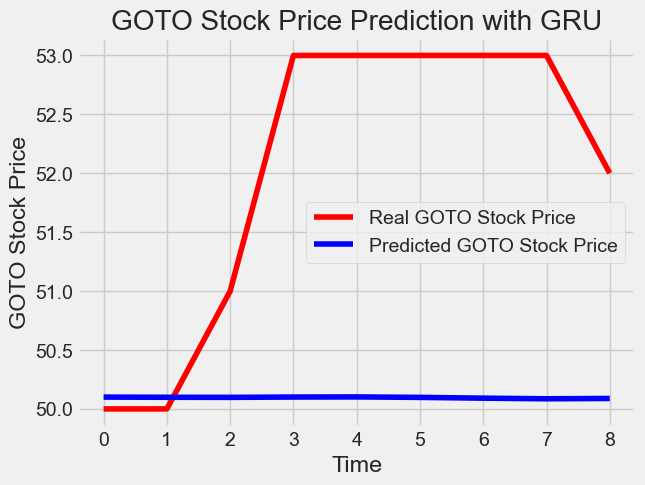

In [811]:
dataset_total = pd.concat((GOTO["close"]["2024-07-01":"2024-07-19"],GOTO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('GOTO', GOTO_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1326391635.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


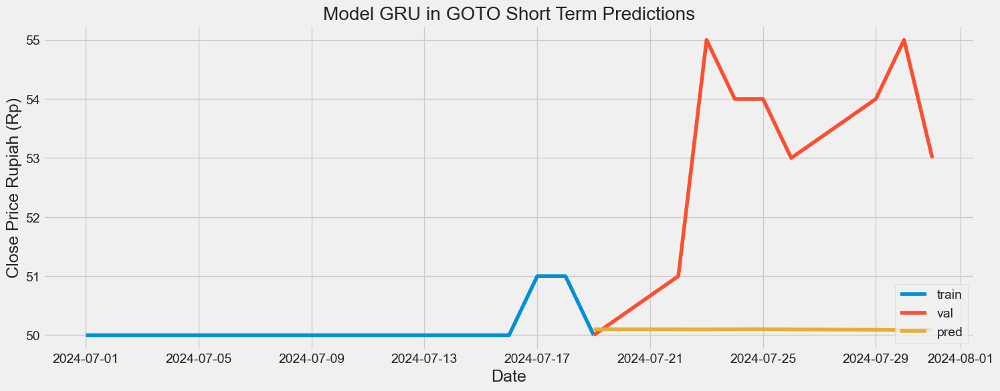

In [812]:
# Visualize the data
# Plot the data
train = GOTO["2024-07-01":"2024-07-19"]
valid = GOTO["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in GOTO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [813]:
# Evaluating the sequence

rmse = return_rmse(GOTO_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 2.27710118309741.
The root mean squared error after normalization is 0.7590337276991354.


#### RNN Predictions

In [817]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 2/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 3/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 4/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0048 - accuracy: 1.0000
Epoch 5/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 6/50
1/1 [==============================] - 0s 17ms/step - loss: 9.3084e-04 - accuracy: 1.0000
Epoch 7/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 8/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 9/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 10/50
1/1 [==============================] - 0s 10ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 11/50
1/1 [========

1/1 [==============================] - 0s 35ms/step


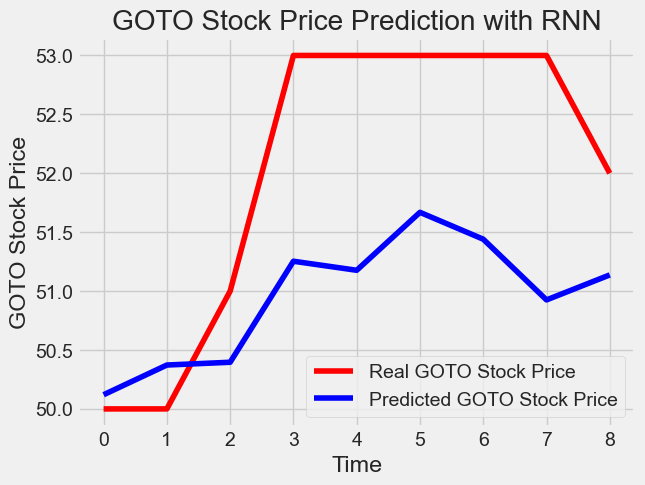

In [818]:
dataset_total = pd.concat((GOTO["close"]["2024-07-01":"2024-07-19"],GOTO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('GOTO', GOTO_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\97400756.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


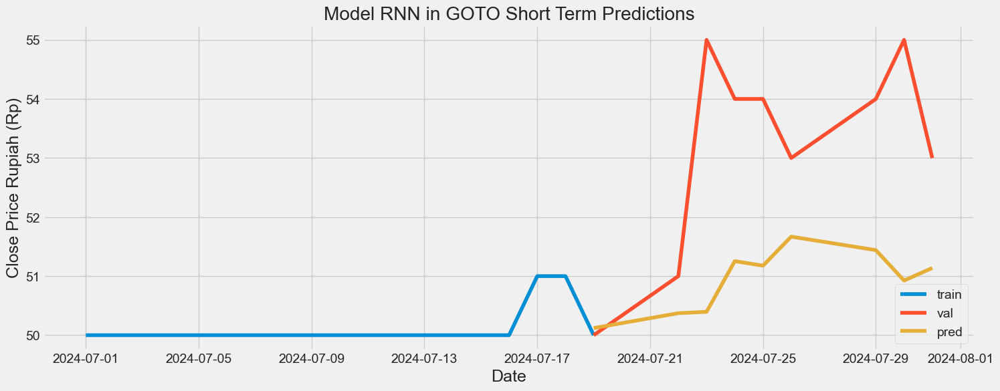

In [819]:
# Visualize the data
# Plot the data
train = GOTO["2024-07-01":"2024-07-19"]
valid = GOTO["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in GOTO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [820]:
# Evaluating the sequence
rmse = return_rmse(GOTO_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 1.3394542392770434.
The root mean squared error after normalization is 0.44648474642568026.


### KLBF

In [821]:
KLBF.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,KLBF,1620,1635,1600,1615,14075700
2020-01-03,KLBF,1615,1635,1610,1635,20606000
2020-01-06,KLBF,1635,1640,1615,1640,10231400
2020-01-07,KLBF,1640,1635,1600,1635,17153100
2020-01-08,KLBF,1635,1615,1585,1585,11666700


#### Data Split

In [822]:
KLBF_short_train = KLBF["2024-07-01":"2024-07-19"].iloc[:,3:4].values
KLBF_short_test = KLBF["2024-07-19":"2024-07-31"].iloc[:,3:4].values

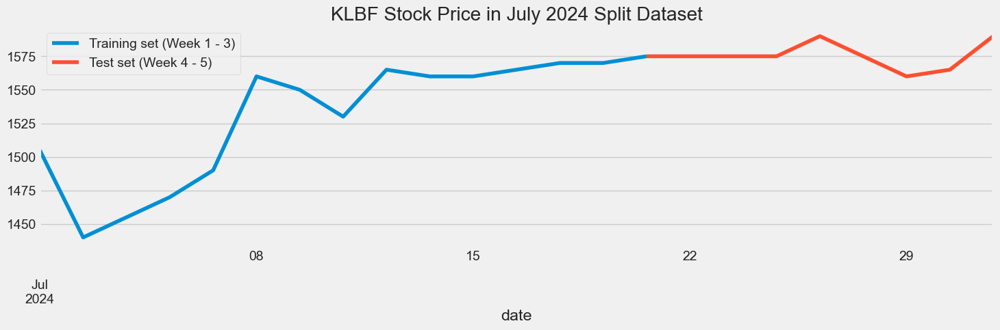

In [823]:
KLBF["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
KLBF["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('KLBF Stock Price in July 2024 Split Dataset')
plt.show()

In [824]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(KLBF_short_train)
len_train = len(KLBF_short_train)
len_test = len(KLBF_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [825]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 21ms/step - loss: 0.6501
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.4776
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.3673
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.2788
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1950
Epoch 6/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1269
Epoch 7/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0618
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0412
Epoch 9/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0210
Epoch 10/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0218
Epoch 11/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0182
Epoch 12/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0213
Epoch 13/50
1/1 [==============================] - 0s 14ms/st

1/1 [==============================] - 0s 66ms/step


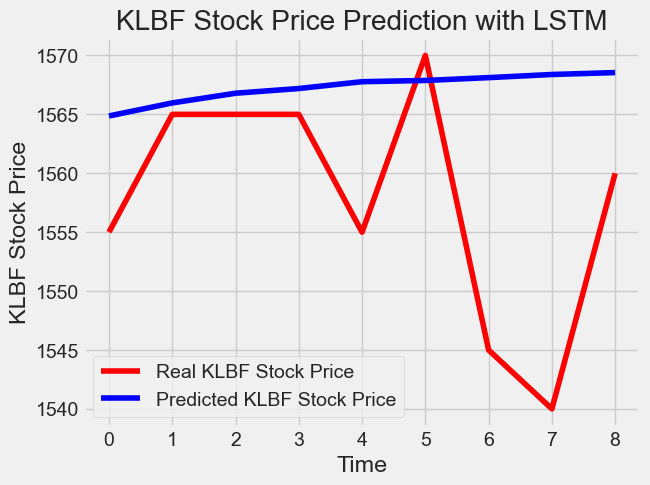

In [826]:
dataset_total = pd.concat((KLBF["close"]["2024-07-01":"2024-07-19"],KLBF["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('KLBF', KLBF_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\340080784.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


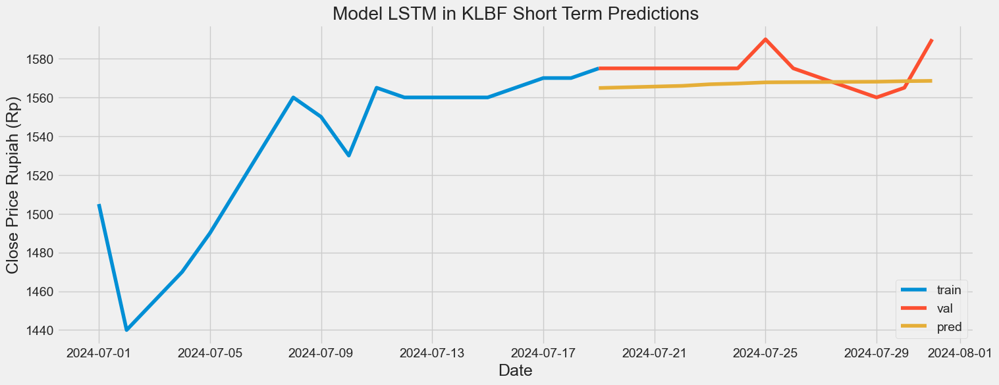

In [827]:
# Visualize the data
# Plot the data
train = KLBF["2024-07-01":"2024-07-19"]
valid = KLBF["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in KLBF Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [828]:
# Evaluating the sequence
rmse = return_rmse(KLBF_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 13.691524411748354.
The root mean squared error after normalization is 0.45638414705827746.


#### GRU Predictions

In [829]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.7262
Epoch 2/50
1/1 [==============================] - 0s 17ms/step - loss: 0.6636
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.5279
Epoch 4/50
1/1 [==============================] - 0s 18ms/step - loss: 0.3728
Epoch 5/50
1/1 [==============================] - 0s 15ms/step - loss: 0.2448
Epoch 6/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1259
Epoch 7/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0599
Epoch 8/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0209
Epoch 9/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0291
Epoch 10/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0628
Epoch 11/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0764
Epoch 12/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1314
Epoch 13/50
1/1 [==============================] - 0s 18ms/st

1/1 [==============================] - 0s 55ms/step


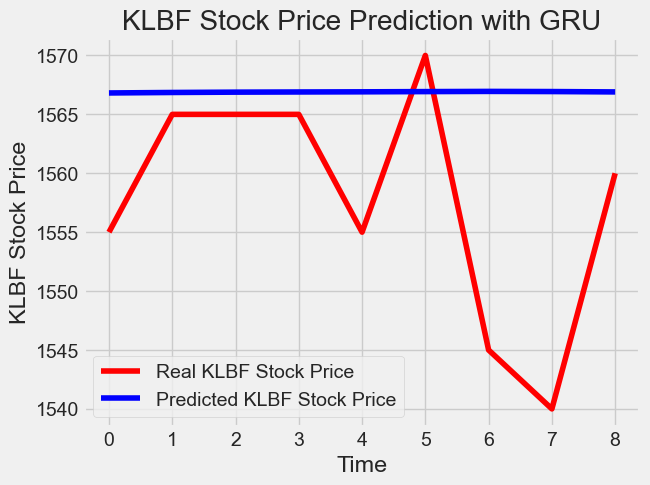

In [830]:
dataset_total = pd.concat((KLBF["close"]["2024-07-01":"2024-07-19"],KLBF["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('KLBF', KLBF_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2049848409.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


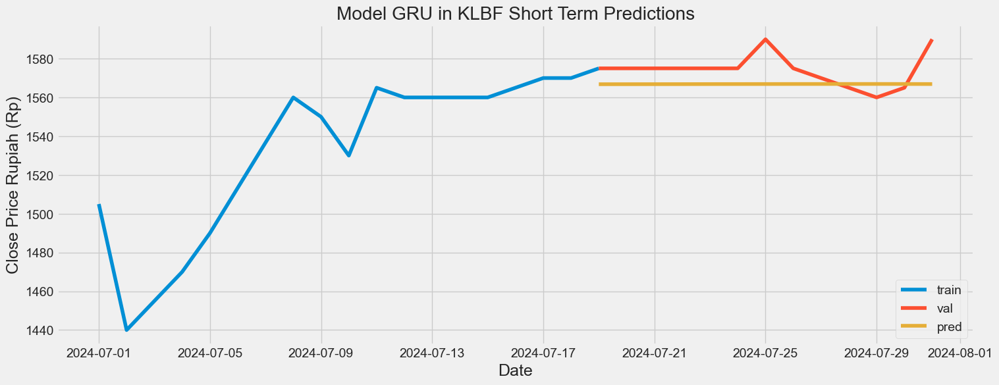

In [831]:
# Visualize the data
# Plot the data
train = KLBF["2024-07-01":"2024-07-19"]
valid = KLBF["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in KLBF Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [832]:
# Evaluating the sequence

rmse = return_rmse(KLBF_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 13.151053865320069.
The root mean squared error after normalization is 0.4383684621773347.


#### RNN Predictions

In [834]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0418 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0774 - accuracy: 0.1000
Epoch 3/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0855 - accuracy: 0.1000
Epoch 4/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0760 - accuracy: 0.1000
Epoch 5/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0596 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0362 - accuracy: 0.1000
Epoch 7/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0348 - accuracy: 0.1000
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0481 - accuracy: 0.1000
Epoch 9/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0253 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0345 - accuracy: 0.1000
Epoch 11/50
1/1 [============

1/1 [==============================] - 0s 53ms/step


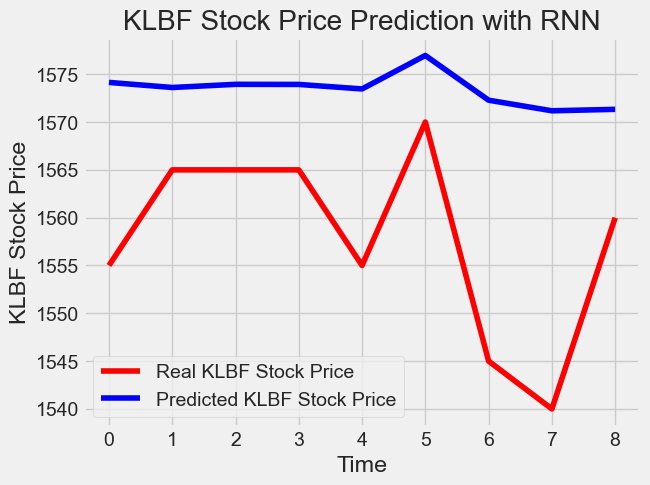

In [835]:
dataset_total = pd.concat((KLBF["close"]["2024-07-01":"2024-07-19"],KLBF["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('KLBF', KLBF_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3189707113.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


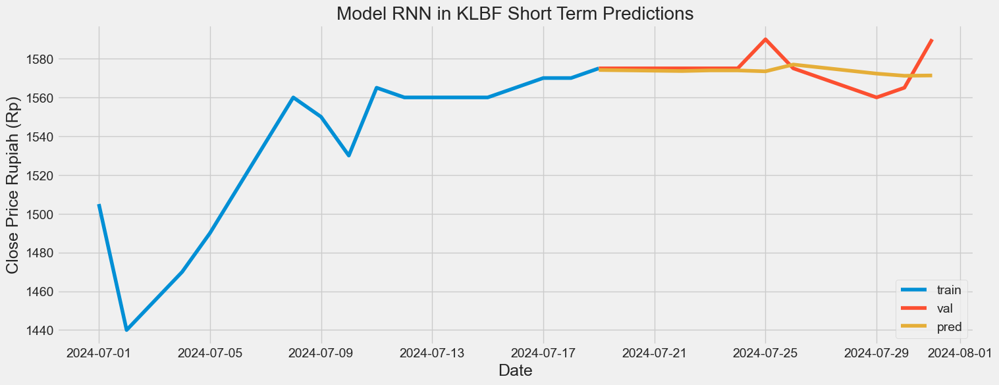

In [836]:
# Visualize the data
# Plot the data
train = KLBF["2024-07-01":"2024-07-19"]
valid = KLBF["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in KLBF Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [837]:
# Evaluating the sequence
rmse = return_rmse(KLBF_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 17.747568588227665.
The root mean squared error after normalization is 0.48012972449642066.


### MAPI

In [838]:
MAPI.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,MAPI,1055,1070,1035,1065,8012800
2020-01-03,MAPI,1065,1070,1050,1070,6591500
2020-01-06,MAPI,1070,1070,1040,1055,5459500
2020-01-07,MAPI,1055,1065,1045,1055,5688100
2020-01-08,MAPI,1055,1060,1030,1035,11561800


#### Data Split

In [839]:
MAPI_short_train = MAPI["2024-07-01":"2024-07-19"].iloc[:,3:4].values
MAPI_short_test = MAPI["2024-07-19":"2024-07-31"].iloc[:,3:4].values

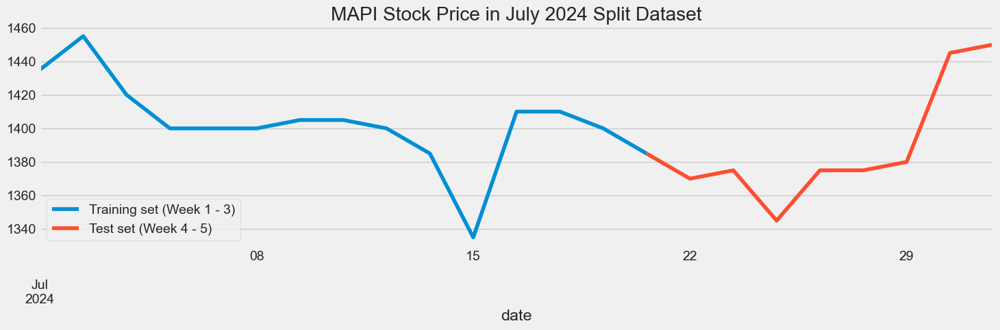

In [337]:
MAPI["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
MAPI["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('MAPI Stock Price in July 2024 Split Dataset')
plt.show()

In [840]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(MAPI_short_train)
len_train = len(MAPI_short_train)
len_test = len(MAPI_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [841]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 21ms/step - loss: 0.2658
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1151
Epoch 3/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0803
Epoch 4/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0608
Epoch 5/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0696
Epoch 6/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0660
Epoch 7/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0654
Epoch 8/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0566
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0579
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0587
Epoch 11/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0568
Epoch 12/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0537
Epoch 13/50
1/1 [==============================] - 0s 19ms/st

1/1 [==============================] - 0s 43ms/step


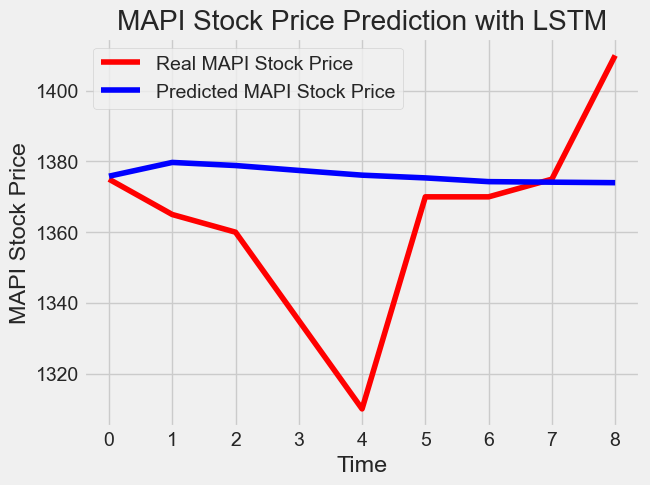

In [842]:
dataset_total = pd.concat((MAPI["close"]["2024-07-01":"2024-07-19"],MAPI["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('MAPI', MAPI_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3767520715.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


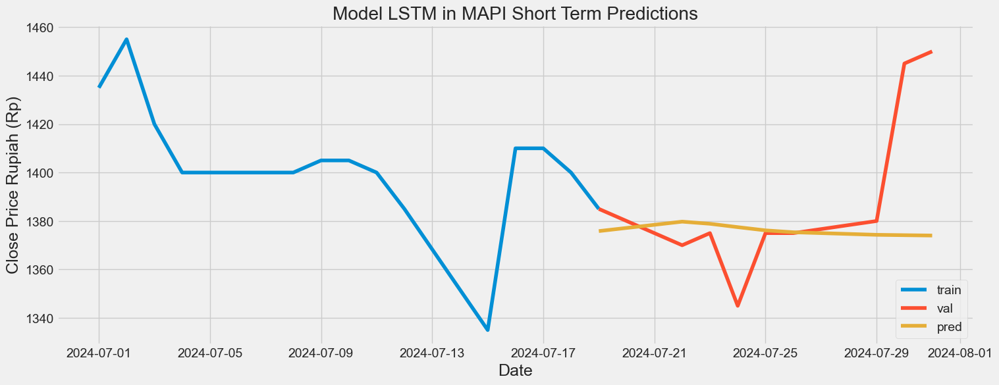

In [843]:
# Visualize the data
# Plot the data
train = MAPI["2024-07-01":"2024-07-19"]
valid = MAPI["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in MAPI Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [844]:
# Evaluating the sequence
rmse = return_rmse(MAPI_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 29.989326630867616.
The root mean squared error after normalization is 0.2998932663086761.


#### GRU Predictions

In [848]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50


1/1 [==============================] - 0s 19ms/step - loss: 0.0563
Epoch 2/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0534
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0573
Epoch 4/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0527
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0583
Epoch 6/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0572
Epoch 7/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0558
Epoch 8/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0586
Epoch 9/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0594
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0586
Epoch 11/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0553
Epoch 12/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0549
Epoch 13/50
1/1 [==============================] - 0s 15ms/step - loss: 

1/1 [==============================] - 0s 110ms/step


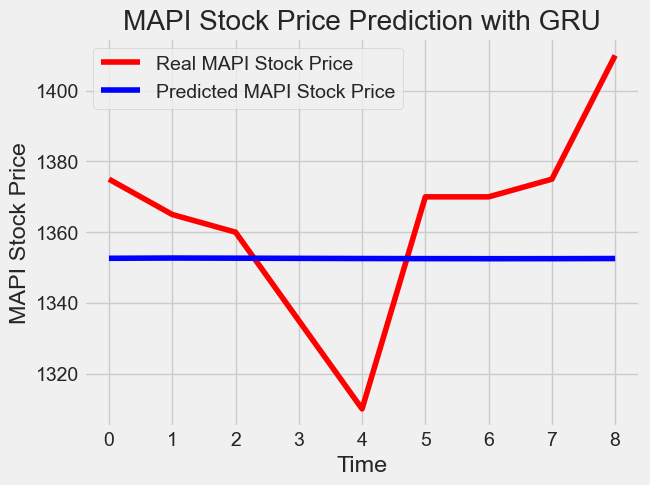

In [849]:
dataset_total = pd.concat((MAPI["close"]["2024-07-01":"2024-07-19"],MAPI["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('MAPI', MAPI_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1285455158.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


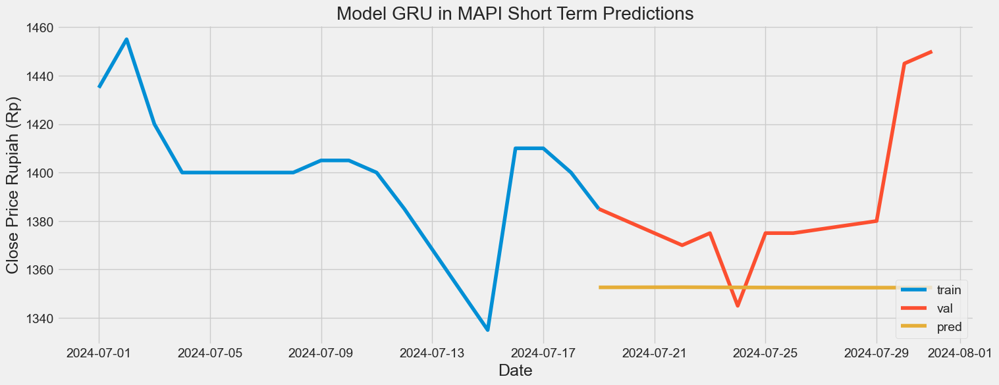

In [850]:
# Visualize the data
# Plot the data
train = MAPI["2024-07-01":"2024-07-19"]
valid = MAPI["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in MAPI Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [851]:
# Evaluating the sequence

rmse = return_rmse(MAPI_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 28.37370878058372.
The root mean squared error after normalization is 0.2837370878058371.


#### RNN Predictions

In [852]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1387 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 14ms/step - loss: 0.3061 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1572 - accuracy: 0.1000
Epoch 4/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1602 - accuracy: 0.0000e+00
Epoch 5/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0877 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0766 - accuracy: 0.2000
Epoch 7/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0239 - accuracy: 0.2000
Epoch 8/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0344 - accuracy: 0.2000
Epoch 9/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0891 - accuracy: 0.2000
Epoch 10/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1072 - accuracy: 0.2000
Epoch 11/50
1/1 [====

1/1 [==============================] - 0s 34ms/step


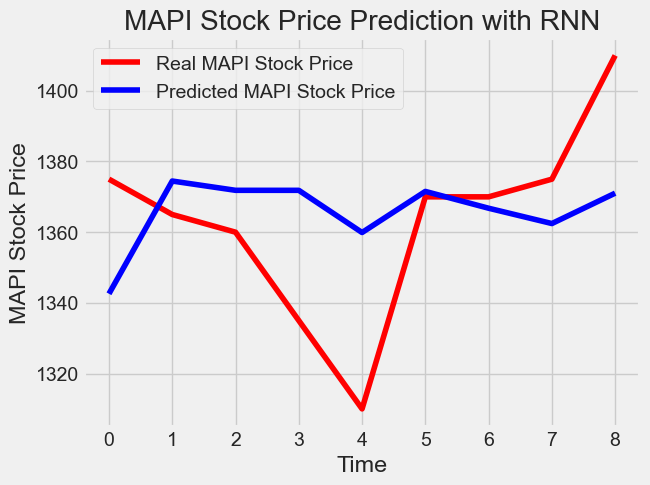

In [853]:
dataset_total = pd.concat((MAPI["close"]["2024-07-01":"2024-07-19"],MAPI["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('MAPI', MAPI_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3191121687.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


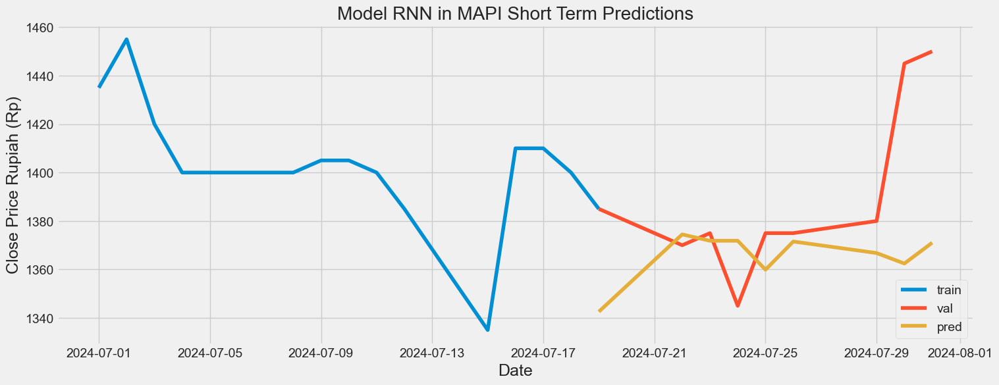

In [854]:
# Visualize the data
# Plot the data
train = MAPI["2024-07-01":"2024-07-19"]
valid = MAPI["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in MAPI Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [855]:
# Evaluating the sequence
rmse = return_rmse(MAPI_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 27.522775387302115.
The root mean squared error after normalization is 0.2752277538730212.


### TLKM

In [856]:
TLKM.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,TLKM,3970,4000,3900,3910,52094000
2020-01-03,TLKM,3910,3980,3930,3980,70032900
2020-01-06,TLKM,3980,3970,3930,3960,42908900
2020-01-07,TLKM,3960,3970,3920,3940,51837600
2020-01-08,TLKM,3940,3950,3900,3900,52402600


#### Data Split

In [857]:
TLKM_short_train = TLKM["2024-07-01":"2024-07-19"].iloc[:,3:4].values
TLKM_short_test = TLKM["2024-07-19":"2024-07-31"].iloc[:,3:4].values

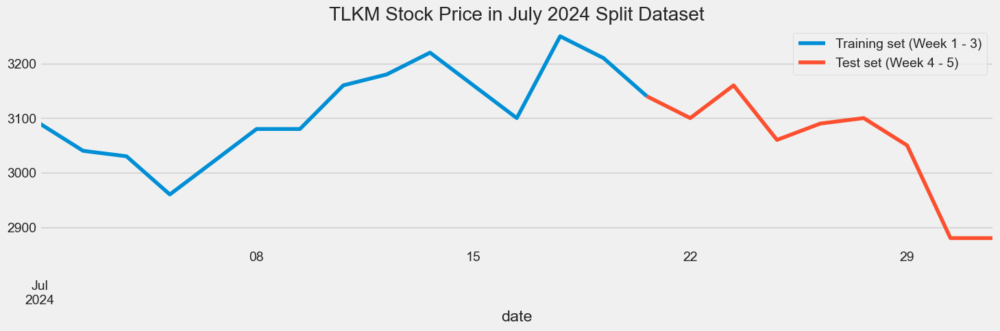

In [858]:
TLKM["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
TLKM["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('TLKM Stock Price in July 2024 Split Dataset')
plt.show()

In [859]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(TLKM_short_train)
len_train = len(TLKM_short_train)
len_test = len(TLKM_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [860]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1264
Epoch 2/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0683
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0628
Epoch 4/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0609
Epoch 5/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0592
Epoch 6/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0736
Epoch 7/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0512
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0720
Epoch 9/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0726
Epoch 10/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0552
Epoch 11/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0665
Epoch 12/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0556
Epoch 13/50
1/1 [==============================] - 0s 23ms/st

1/1 [==============================] - 0s 36ms/step


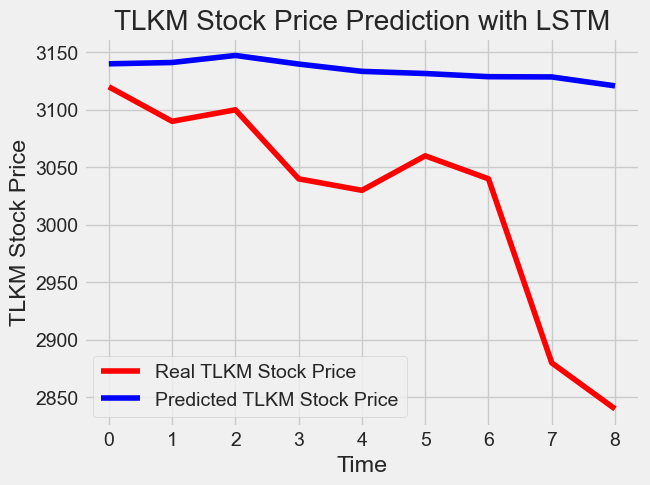

In [861]:
dataset_total = pd.concat((TLKM["close"]["2024-07-01":"2024-07-19"],TLKM["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('TLKM', TLKM_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3926882567.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


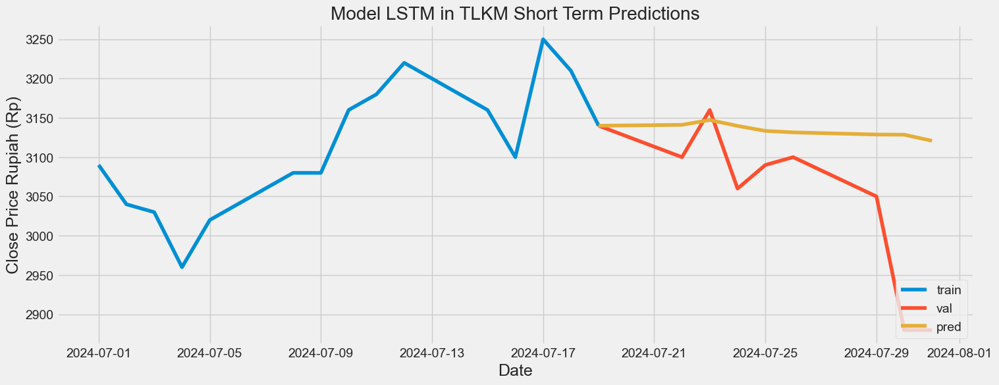

In [863]:
# Visualize the data
# Plot the data
train = TLKM["2024-07-01":"2024-07-19"]
valid = TLKM["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in TLKM Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [864]:
# Evaluating the sequence
rmse = return_rmse(TLKM_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 141.24249254620167.
The root mean squared error after normalization is 0.4597043971813975.


#### GRU Predictions

In [865]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 24ms/step - loss: 0.1064
Epoch 2/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1069
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1016
Epoch 4/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0936
Epoch 5/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0875
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0751
Epoch 7/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0714
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0693
Epoch 9/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0680
Epoch 10/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0655
Epoch 11/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0610
Epoch 12/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0613
Epoch 13/50
1/1 [==============================] - 0s 18ms/st

1/1 [==============================] - 0s 35ms/step


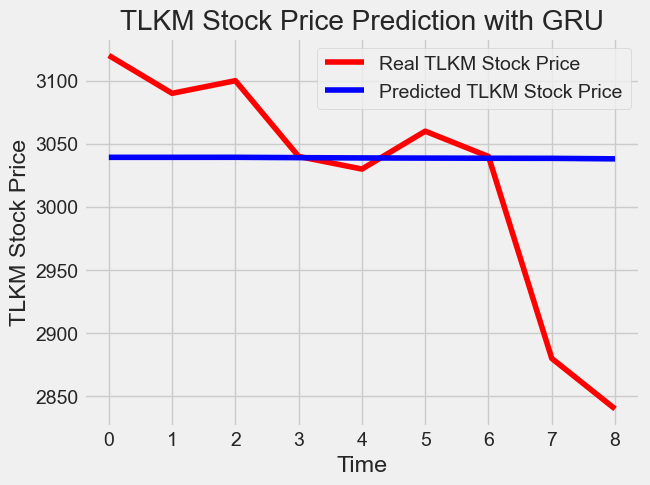

In [866]:
dataset_total = pd.concat((TLKM["close"]["2024-07-01":"2024-07-19"],TLKM["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('TLKM', TLKM_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2924717384.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


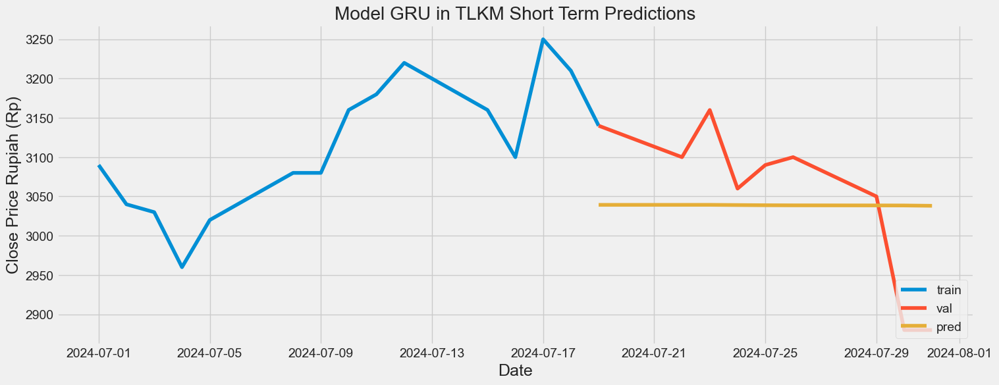

In [868]:
# Visualize the data
# Plot the data
train = TLKM["2024-07-01":"2024-07-19"]
valid = TLKM["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in TLKM Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [869]:
# Evaluating the sequence

rmse = return_rmse(TLKM_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 92.89508278390902.
The root mean squared error after normalization is 0.3317681527996754.


#### RNN Predictions

In [870]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1423 - accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1673 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1046 - accuracy: 0.0000e+00
Epoch 4/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0954 - accuracy: 0.0000e+00
Epoch 5/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1237 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0920 - accuracy: 0.1000
Epoch 7/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0740 - accuracy: 0.0000e+00
Epoch 8/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1084 - accuracy: 0.0000e+00
Epoch 9/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0688 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0714 - accuracy: 0.0000e+00
E

1/1 [==============================] - 0s 41ms/step


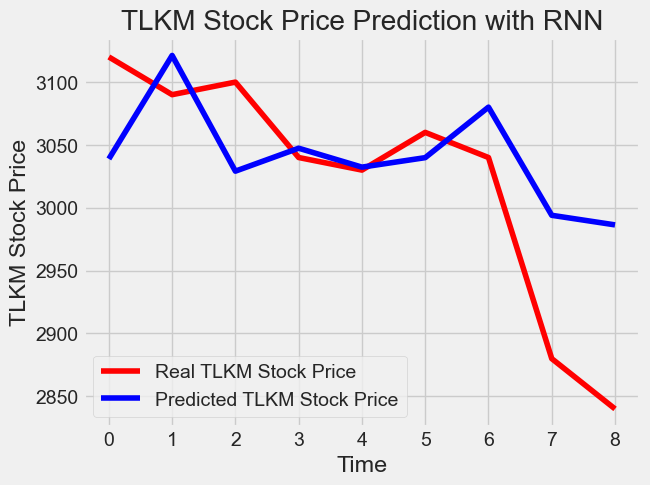

In [871]:
dataset_total = pd.concat((TLKM["close"]["2024-07-01":"2024-07-19"],TLKM["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('TLKM', TLKM_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\547812793.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


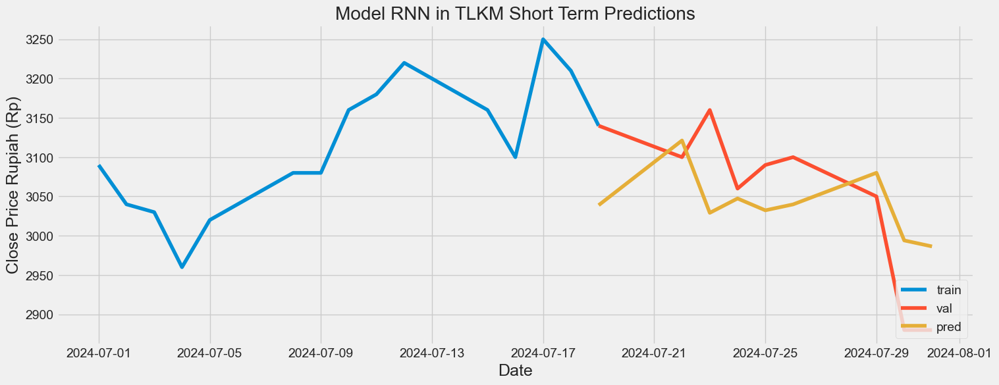

In [872]:
# Visualize the data
# Plot the data
train = TLKM["2024-07-01":"2024-07-19"]
valid = TLKM["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in TLKM Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [873]:
# Evaluating the sequence
rmse = return_rmse(TLKM_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 73.84877384822879.
The root mean squared error after normalization is 0.26261764366772244.


### BBCA

In [716]:
BBCA.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,BBCA,33425,33900,33400,33450,9889000
2020-01-03,BBCA,33450,34000,33625,34000,9551100
2020-01-06,BBCA,34000,33750,33450,33675,5460000
2020-01-07,BBCA,33675,33850,33650,33700,9004500
2020-01-08,BBCA,33700,33725,33350,33400,10738500


#### Data Split

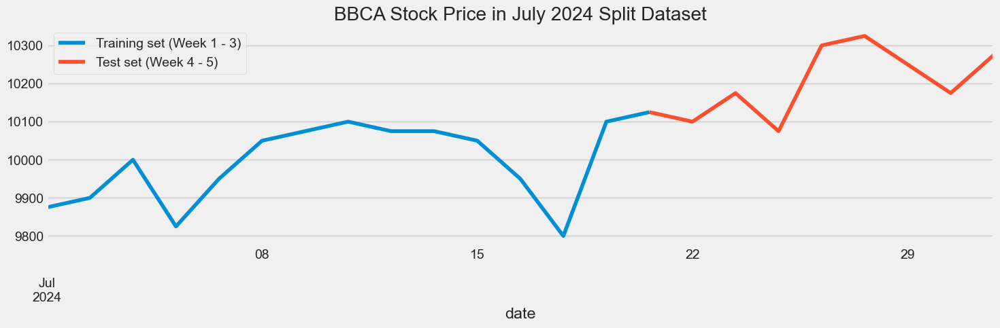

In [730]:
BBCA_short_train = BBCA["2024-07-01":"2024-07-19"].iloc[:,3:4].values
BBCA_short_test = BBCA["2024-07-19":"2024-07-31"].iloc[:,3:4].values
BBCA["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
BBCA["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('BBCA Stock Price in July 2024 Split Dataset')
plt.show()

In [731]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(BBCA_short_train)
len_train = len(BBCA_short_train)
len_test = len(BBCA_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [732]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0750
Epoch 2/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0600
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0596
Epoch 4/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0879
Epoch 5/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0639
Epoch 6/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0572
Epoch 7/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0508
Epoch 8/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0795
Epoch 9/50
1/1 [==============================] - 0s 9ms/step - loss: 0.0843
Epoch 10/50
1/1 [==============================] - 0s 27ms/step - loss: 0.0655
Epoch 11/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0711
Epoch 12/50
1/1 [==============================] - 0s 11ms/step - loss: 0.0635
Epoch 13/50
1/1 [==============================] - 0s 19ms/ste

1/1 [==============================] - 0s 41ms/step


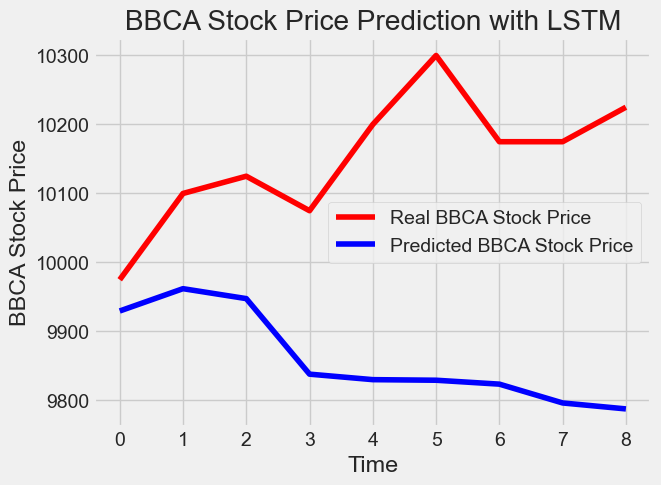

In [733]:
dataset_total = pd.concat((BBCA["close"]["2024-07-01":"2024-07-19"],BBCA["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('BBCA', BBCA_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3878668056.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


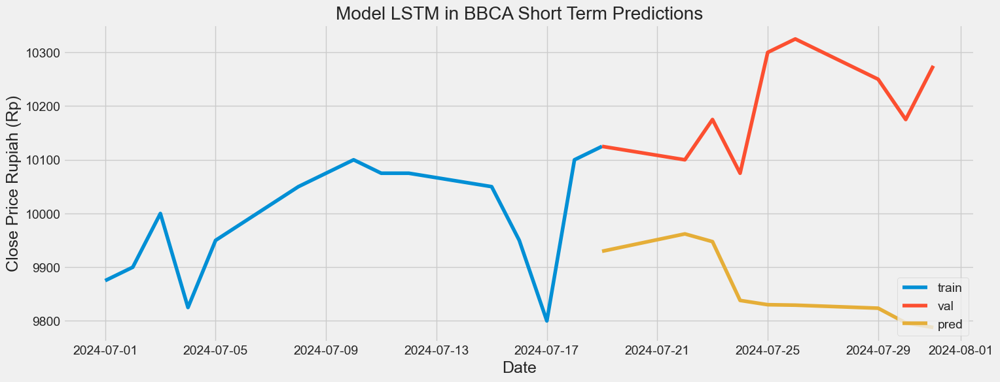

In [734]:
# Visualize the data
# Plot the data
train = BBCA["2024-07-01":"2024-07-19"]
valid = BBCA["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in BBCA Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [738]:
# Evaluating the sequence
rmse = return_rmse(BBCA_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 320.56297717934154.
The root mean squared error after normalization is 0.6258333736216132.


#### GRU Predictions

In [735]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 24ms/step - loss: 0.1118
Epoch 2/50
1/1 [==============================] - 0s 25ms/step - loss: 0.1213
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1258
Epoch 4/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1149
Epoch 5/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1102
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1036
Epoch 7/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0969
Epoch 8/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1123
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1013
Epoch 10/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1235
Epoch 11/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1240
Epoch 12/50
1/1 [==============================] - 0s 23ms/step - loss: 0.1078
Epoch 13/50
1/1 [==============================] - 0s 17ms/st

1/1 [==============================] - 0s 46ms/step


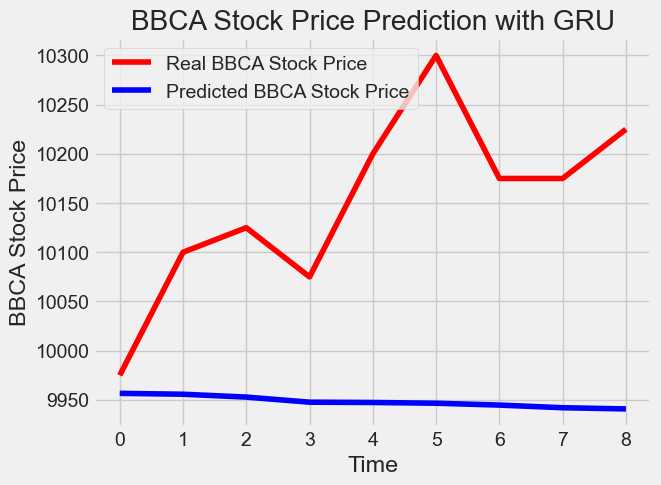

In [736]:
dataset_total = pd.concat((BBCA["close"]["2024-07-01":"2024-07-19"],BBCA["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('BBCA', BBCA_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3182095404.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


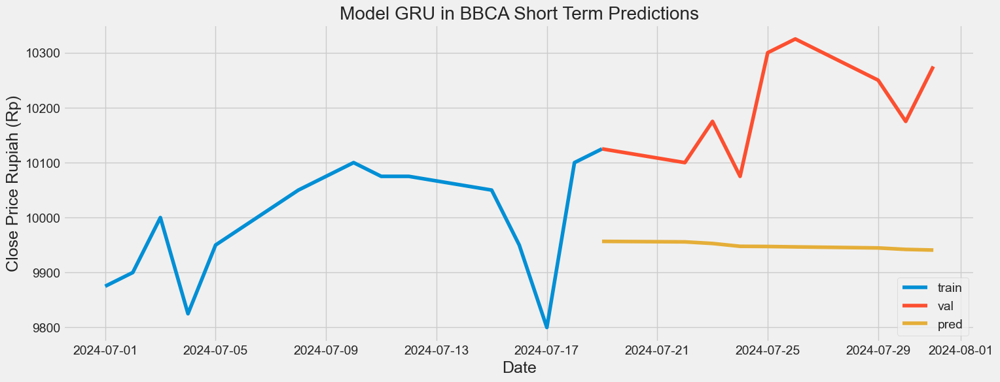

In [739]:
# Visualize the data
# Plot the data
train = BBCA["2024-07-01":"2024-07-19"]
valid = BBCA["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in BBCA Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [740]:
# Evaluating the sequence
rmse = return_rmse(BBCA_short_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_short_test,GRU_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 222.03193508719295.
The root mean squared error after normalization is 0.6182194202559919.


#### RNN Predictions

In [741]:
regressorRNN.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 17ms/step - loss: 0.3046 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1368 - accuracy: 0.3000
Epoch 3/50
1/1 [==============================] - 0s 22ms/step - loss: 0.2889 - accuracy: 0.2000
Epoch 4/50
1/1 [==============================] - 0s 14ms/step - loss: 0.4917 - accuracy: 0.0000e+00
Epoch 5/50
1/1 [==============================] - 0s 13ms/step - loss: 0.3086 - accuracy: 0.2000
Epoch 6/50
1/1 [==============================] - 0s 14ms/step - loss: 0.4029 - accuracy: 0.3000
Epoch 7/50
1/1 [==============================] - 0s 16ms/step - loss: 0.2072 - accuracy: 0.2000
Epoch 8/50
1/1 [==============================] - 0s 15ms/step - loss: 0.2805 - accuracy: 0.1000
Epoch 9/50
1/1 [==============================] - 0s 12ms/step - loss: 0.2944 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 14ms/step - loss: 0.2921 - accuracy: 0.1000
Epoch 11/50
1/1 [========

1/1 [==============================] - 0s 39ms/step


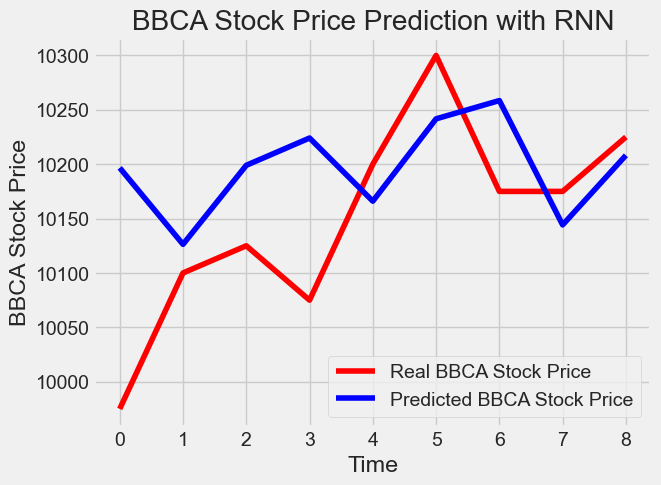

In [742]:
dataset_total = pd.concat((BBCA["close"]["2024-07-01":"2024-07-19"],BBCA["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('BBCA', BBCA_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2328676824.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


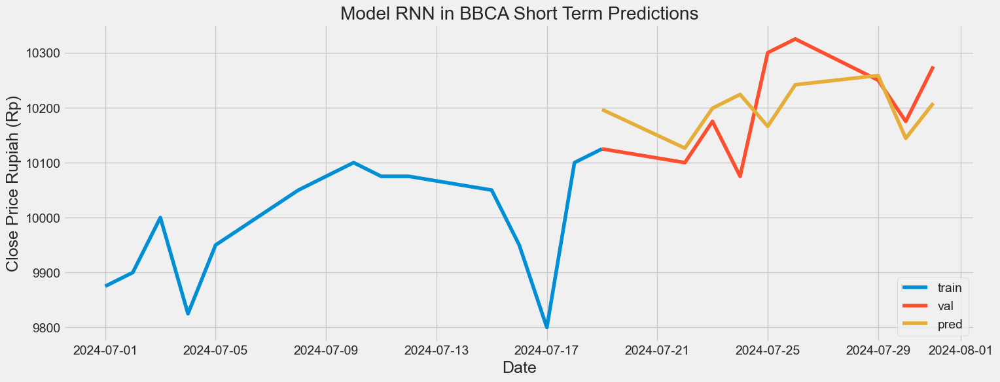

In [743]:
# Visualize the data
# Plot the data
train = BBCA["2024-07-01":"2024-07-19"]
valid = BBCA["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in BBCA Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [744]:
# Evaluating the sequence
rmse = return_rmse(BBCA_short_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_short_test,RNN_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 100.15064536746024.
The root mean squared error after normalization is 0.30815583189987744.


## Medium Term Predictions
Medium term prediction using in this program is prediction of the several month in a year.
Data use for this predictions is data in year 2023 because that is the complete one.
Data train and test is:
1. Data Train
    * Month 1 - 9: January - September 2023
2. Data Test
    * Month 10 - 13: Oktober - Desember 2023

### ADRO

#### Data Split

In [373]:
ADRO_medium_train = ADRO["2023-01":"2023-10-02"].iloc[:,3:4].values
ADRO_medium_test = ADRO["2023-10-02":"2023-12"].iloc[:,3:4].values

##### Plot Train Test Data for ADRO

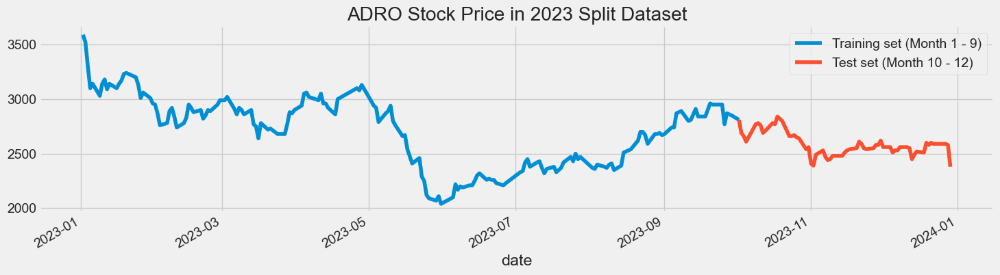

In [374]:
ADRO["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
ADRO["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('ADRO Stock Price in 2023 Split Dataset')
plt.show()

##### Normalize Dataset

In [375]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ADRO_medium_train)

##### Count Dataset Split

In [376]:
len_train = len(ADRO_medium_train)
len_test = len(ADRO_medium_test)
print(len_train, len_test)

177 63


##### 20 Timestep Dataset Preparation

In [377]:
# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

##### Reshaping

In [378]:
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

#### LSTM Predictions

In [379]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 10s 36ms/step - loss: 0.9263
Epoch 2/50
5/5 [==============================] - 0s 32ms/step - loss: 0.0410
Epoch 3/50
5/5 [==============================] - 0s 32ms/step - loss: 0.0402
Epoch 4/50
5/5 [==============================] - 0s 31ms/step - loss: 0.0270
Epoch 5/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0272
Epoch 6/50
5/5 [==============================] - 0s 32ms/step - loss: 0.0319
Epoch 7/50
5/5 [==============================] - 0s 31ms/step - loss: 0.0257
Epoch 8/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0241
Epoch 9/50
5/5 [==============================] - 0s 32ms/step - loss: 0.0242
Epoch 10/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0274
Epoch 11/50
5/5 [==============================] - 0s 32ms/step - loss: 0.0179
Epoch 12/50
5/5 [==============================] - 0s 29ms/step - loss: 0.0242
Epoch 13/50
5/5 [==============================] - 0s 31ms/s

In [380]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"]["2023-01":"2023-10-02"],ADRO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

In [381]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

2/2 [==============================] - 4s 17ms/step


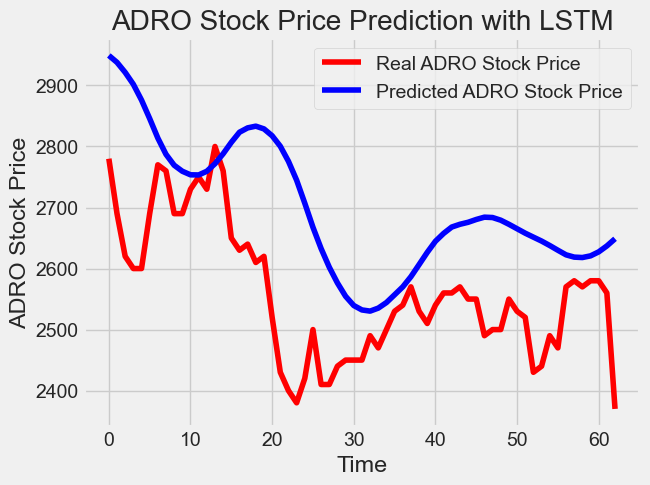

In [382]:
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ADRO', ADRO_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\773518978.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


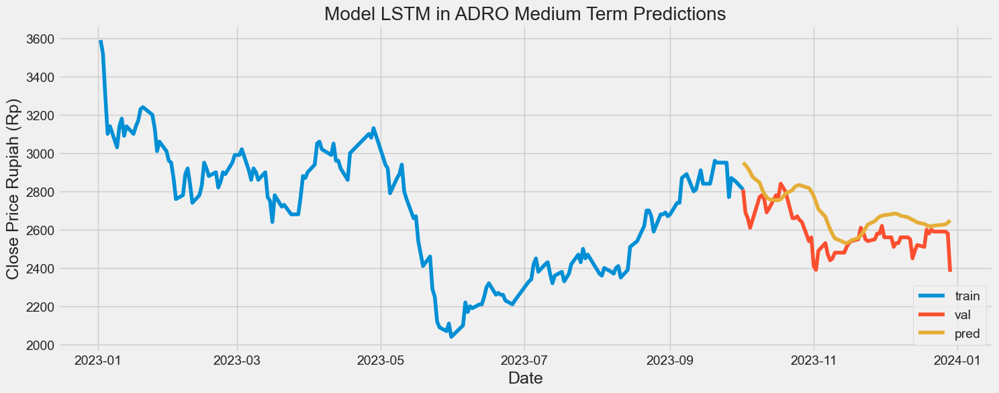

In [383]:
# Visualize the data
# Plot the data
train = ADRO["2023-01":"2023-10-02"]
valid = ADRO["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ADRO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [386]:
# Evaluating the sequence
rmse = return_rmse(ADRO_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 169.7569568382546.
The root mean squared error after normalization is 0.2930951175477368.


#### GRU Predictions

In [387]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 8s 47ms/step - loss: 0.0992
Epoch 2/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0864
Epoch 3/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0646
Epoch 4/50
2/2 [==============================] - 0s 33ms/step - loss: 0.0424
Epoch 5/50
2/2 [==============================] - 0s 33ms/step - loss: 0.0323
Epoch 6/50
2/2 [==============================] - 0s 35ms/step - loss: 0.0300
Epoch 7/50
2/2 [==============================] - 0s 30ms/step - loss: 0.0307
Epoch 8/50
2/2 [==============================] - 0s 35ms/step - loss: 0.0341
Epoch 9/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0368
Epoch 10/50
2/2 [==============================] - 0s 21ms/step - loss: 0.0355
Epoch 11/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0333
Epoch 12/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0309
Epoch 13/50
2/2 [==============================] - 0s 45ms/st

In [393]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

2/2 [==============================] - 0s 12ms/step


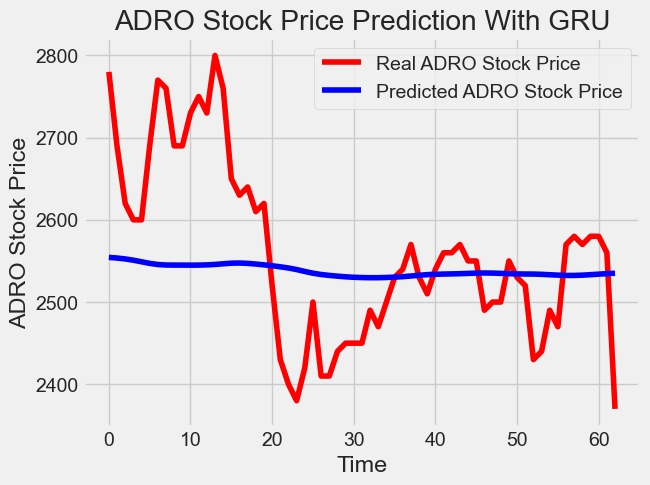

In [394]:
# Visualizing the results for GRU
gru_title = "With GRU"
plot_predictions("ADRO", ADRO_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3971688934.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


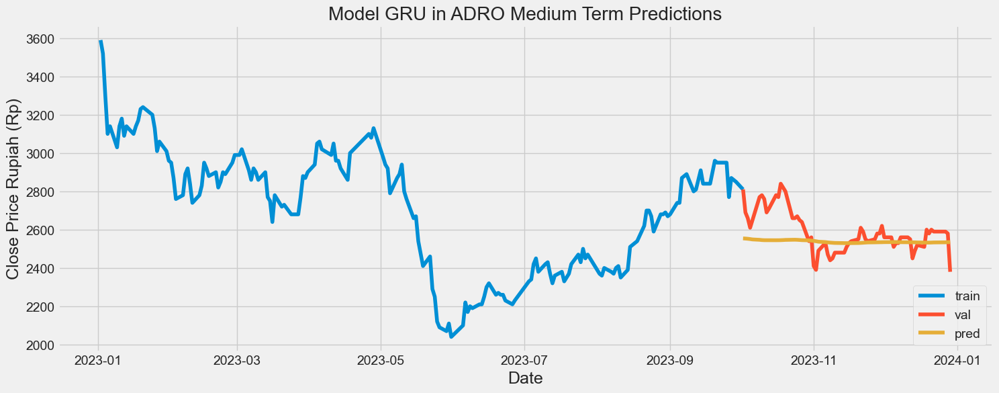

In [395]:
# Visualize the data
# Plot the data
train = ADRO["2023-01":"2023-10-02"]
valid = ADRO["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ADRO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [396]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(ADRO_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 105.78333707449761.
The root mean squared error after normalization is 0.24600776063836644.


#### RNN Predictions

In [397]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 3s 20ms/step - loss: 0.1000 - accuracy: 0.0127
Epoch 2/50
5/5 [==============================] - 0s 18ms/step - loss: 0.0855 - accuracy: 0.0127
Epoch 3/50
5/5 [==============================] - 0s 18ms/step - loss: 0.0604 - accuracy: 0.0127
Epoch 4/50
5/5 [==============================] - 0s 18ms/step - loss: 0.0592 - accuracy: 0.0064
Epoch 5/50
5/5 [==============================] - 0s 17ms/step - loss: 0.0713 - accuracy: 0.0064
Epoch 6/50
5/5 [==============================] - 0s 17ms/step - loss: 0.0595 - accuracy: 0.0127
Epoch 7/50
5/5 [==============================] - 0s 17ms/step - loss: 0.0592 - accuracy: 0.0064
Epoch 8/50
5/5 [==============================] - 0s 16ms/step - loss: 0.0513 - accuracy: 0.0127
Epoch 9/50
5/5 [==============================] - 0s 16ms/step - loss: 0.0463 - accuracy: 0.0127
Epoch 10/50
5/5 [==============================] - 0s 18ms/step - loss: 0.0611 - accuracy: 0.0127
Epoch 11/50
5/5 [============

In [398]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"]["2023-01":"2023-10-02"],ADRO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

In [399]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

2/2 [==============================] - 1s 7ms/step


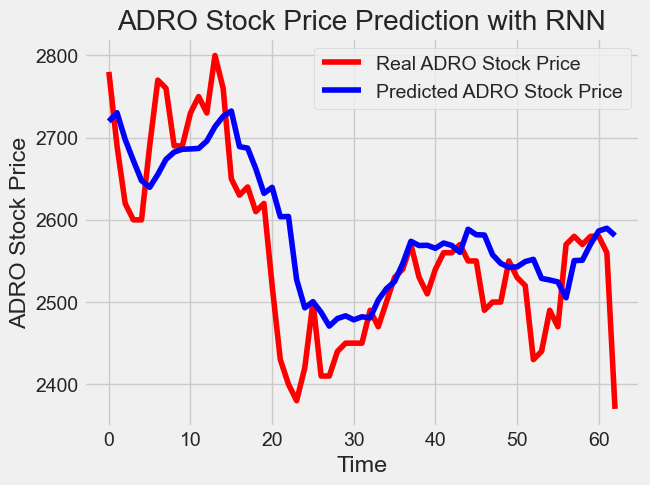

In [400]:
# Visualizing the results for rnn
rnn_title = "with RNN"
plot_predictions('ADRO', ADRO_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3098864298.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


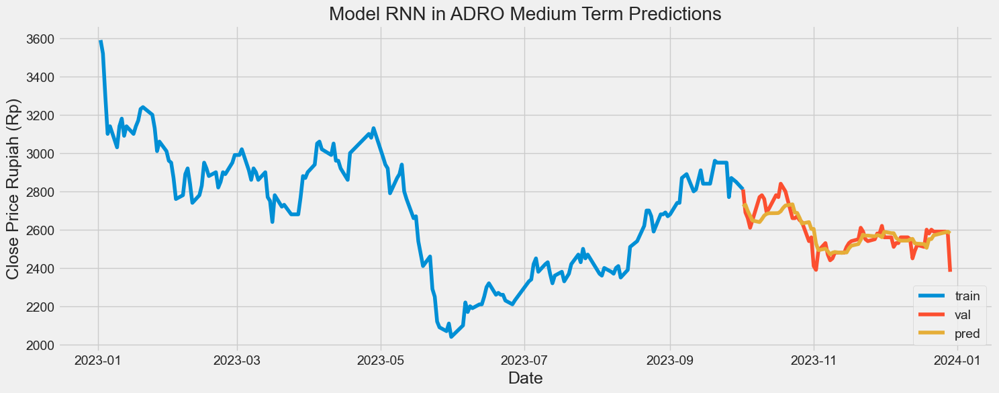

In [401]:
# Visualize the data
# Plot the data
train = ADRO["2023-01":"2023-10-02"]
valid = ADRO["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ADRO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [402]:
# Evaluating the sequence
rmse = return_rmse(ADRO_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 69.40134478577558.
The root mean squared error after normalization is 0.16139847624598969.


### AMMN

#### Data Split

In [597]:
AMMN_medium_train = AMMN["2023-01":"2023-11-01"].iloc[:,3:4].values
AMMN_medium_test = AMMN["2023-11-01":"2023-12"].iloc[:,3:4].values

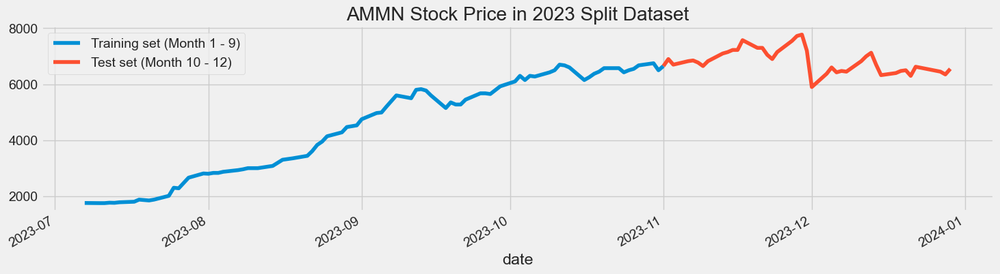

In [598]:
AMMN["close"]["2023-01":"2023-11-01"].plot(figsize=(16,4), legend=True)
AMMN["close"]["2023-11-01":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('AMMN Stock Price in 2023 Split Dataset')
plt.show()

In [599]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMMN_medium_train)

len_train = len(AMMN_medium_train)
len_test = len(AMMN_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))


81 41


#### LSTM Predictions

In [600]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0028
Epoch 2/50
2/2 [==============================] - 0s 31ms/step - loss: 0.0031
Epoch 3/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0031
Epoch 4/50
2/2 [==============================] - 0s 29ms/step - loss: 0.0034
Epoch 5/50
2/2 [==============================] - 0s 29ms/step - loss: 0.0032
Epoch 6/50
2/2 [==============================] - 0s 31ms/step - loss: 0.0026
Epoch 7/50
2/2 [==============================] - 0s 31ms/step - loss: 0.0022
Epoch 8/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0026
Epoch 9/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0031
Epoch 10/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0033
Epoch 11/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0029
Epoch 12/50
2/2 [==============================] - 0s 38ms/step - loss: 0.0029
Epoch 13/50
2/2 [==============================] - 0s 36ms/st

2/2 [==============================] - 0s 11ms/step


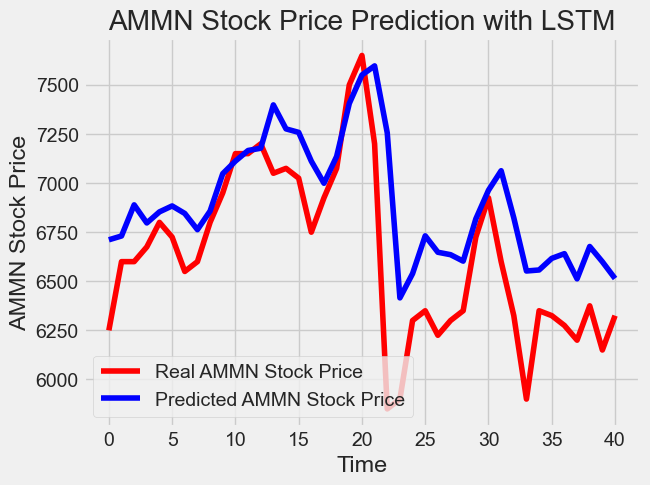

In [601]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"]["2023-01":"2023-11-01"],AMMN["close"]["2023-11-01":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('AMMN', AMMN_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1592110218.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


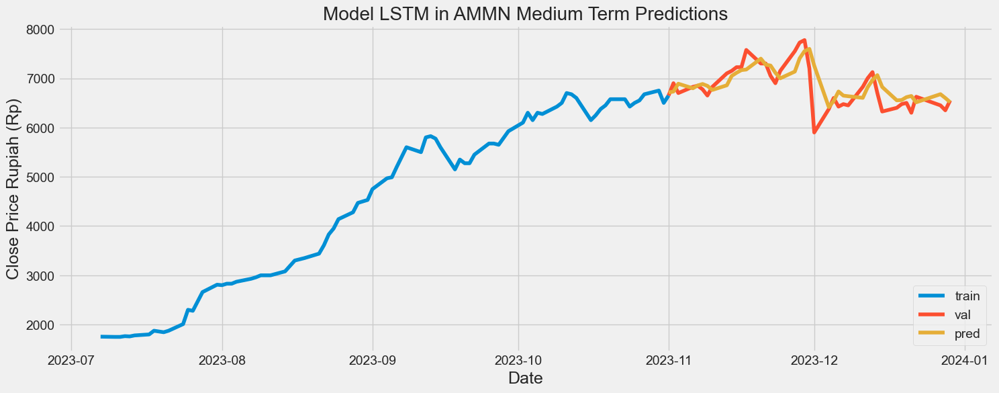

In [602]:
# Visualize the data
# Plot the data
train = AMMN["2023-01":"2023-11-01"]
valid = AMMN["2023-11-01":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMMN Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [603]:
# Evaluating the sequence
rmse = return_rmse(AMMN_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 363.02171422788734.
The root mean squared error after normalization is 0.2016787301266041.


#### GRU Predictions

In [604]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 56ms/step - loss: 0.0045
Epoch 2/50
1/1 [==============================] - 0s 36ms/step - loss: 0.0038
Epoch 3/50
1/1 [==============================] - 0s 42ms/step - loss: 0.0038
Epoch 4/50
1/1 [==============================] - 0s 113ms/step - loss: 0.0042
Epoch 5/50
1/1 [==============================] - 0s 96ms/step - loss: 0.0051
Epoch 6/50
1/1 [==============================] - 0s 78ms/step - loss: 0.0061
Epoch 7/50
1/1 [==============================] - 0s 73ms/step - loss: 0.0061
Epoch 8/50
1/1 [==============================] - 0s 72ms/step - loss: 0.0045
Epoch 9/50
1/1 [==============================] - 0s 70ms/step - loss: 0.0046
Epoch 10/50
1/1 [==============================] - 0s 81ms/step - loss: 0.0045
Epoch 11/50
1/1 [==============================] - 0s 49ms/step - loss: 0.0052
Epoch 12/50
1/1 [==============================] - 0s 99ms/step - loss: 0.0042
Epoch 13/50
1/1 [==============================] - 0s 83ms/s

2/2 [==============================] - 0s 17ms/step


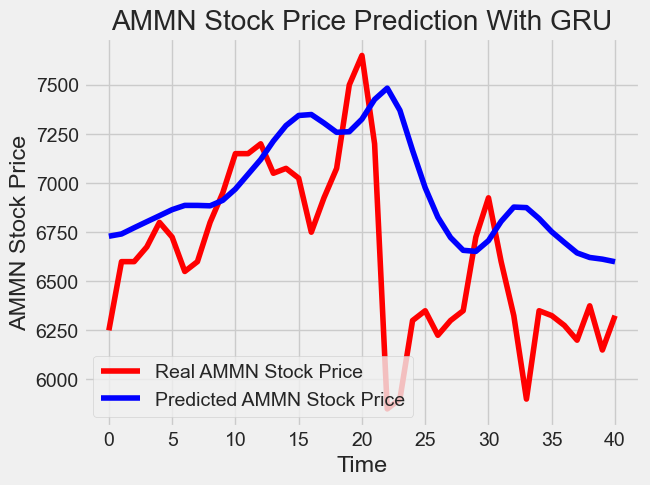

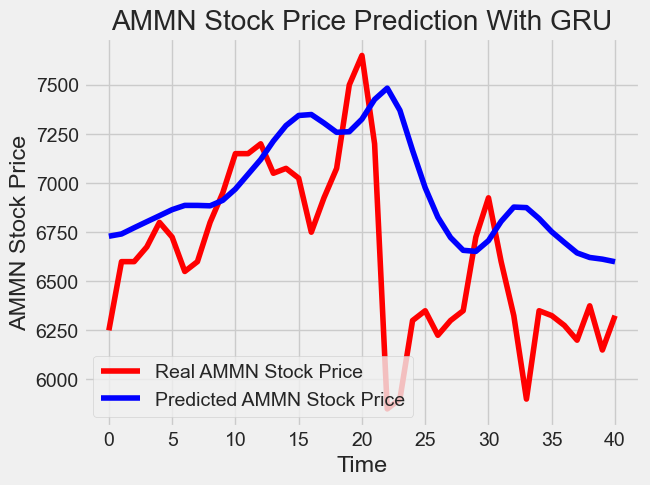

In [605]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"]["2023-01":"2023-11-01"],AMMN["close"]["2023-11-01":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("AMMN", AMMN_medium_test,GRU_predicted_stock_price, gru_title)
plot_predictions("AMMN", AMMN_medium_test,GRU_predicted_stock_price, gru_title)


C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1244434471.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


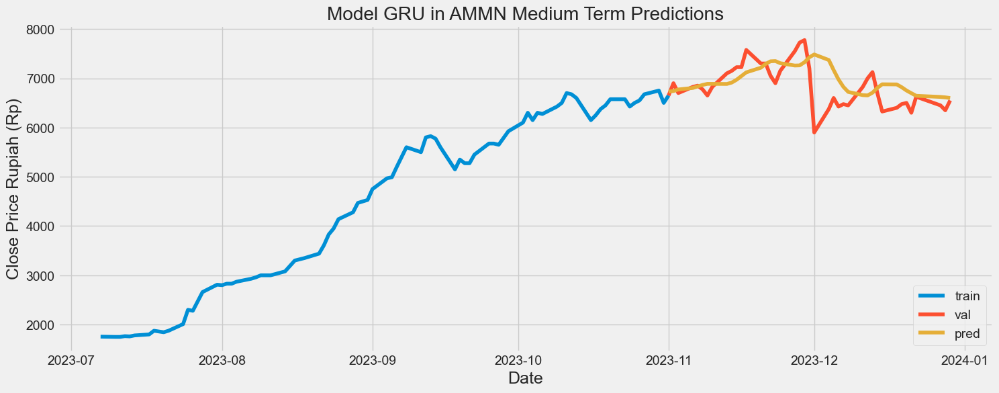

In [606]:
# Visualize the data
# Plot the data
train = AMMN["2023-01":"2023-11-01"]
valid = AMMN["2023-11-01":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMMN Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [607]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(AMMN_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 508.10091975173106.
The root mean squared error after normalization is 0.2822782887509618.


#### RNN Predictions

In [608]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
2/2 [==============================] - 0s 20ms/step - loss: 0.0056 - accuracy: 0.0164
Epoch 2/50
2/2 [==============================] - 0s 21ms/step - loss: 0.0043 - accuracy: 0.0164
Epoch 3/50
2/2 [==============================] - 0s 24ms/step - loss: 0.0060 - accuracy: 0.0164
Epoch 4/50
2/2 [==============================] - 0s 23ms/step - loss: 0.0050 - accuracy: 0.0164
Epoch 5/50
2/2 [==============================] - 0s 22ms/step - loss: 0.0056 - accuracy: 0.0164
Epoch 6/50
2/2 [==============================] - 0s 34ms/step - loss: 0.0047 - accuracy: 0.0164
Epoch 7/50
2/2 [==============================] - 0s 24ms/step - loss: 0.0056 - accuracy: 0.0164
Epoch 8/50
2/2 [==============================] - 0s 25ms/step - loss: 0.0050 - accuracy: 0.0164
Epoch 9/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0044 - accuracy: 0.0164
Epoch 10/50
2/2 [==============================] - 0s 27ms/step - loss: 0.0037 - accuracy: 0.0164
Epoch 11/50
2/2 [============

2/2 [==============================] - 0s 7ms/step


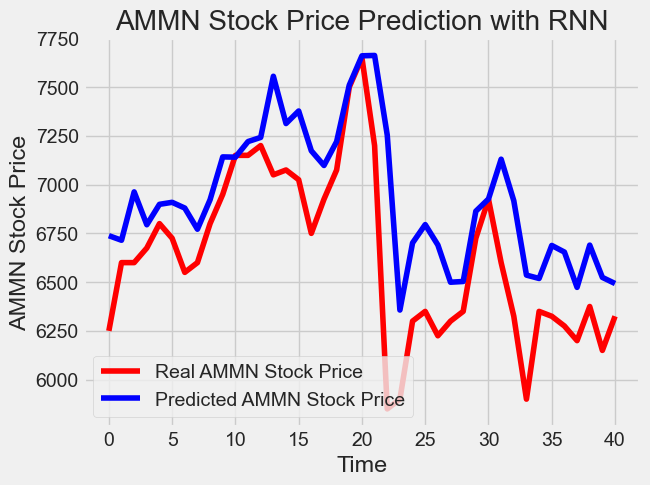

In [609]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"]["2023-01":"2023-11-01"],AMMN["close"]["2023-11-01":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
plot_predictions('AMMN', AMMN_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\49979064.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


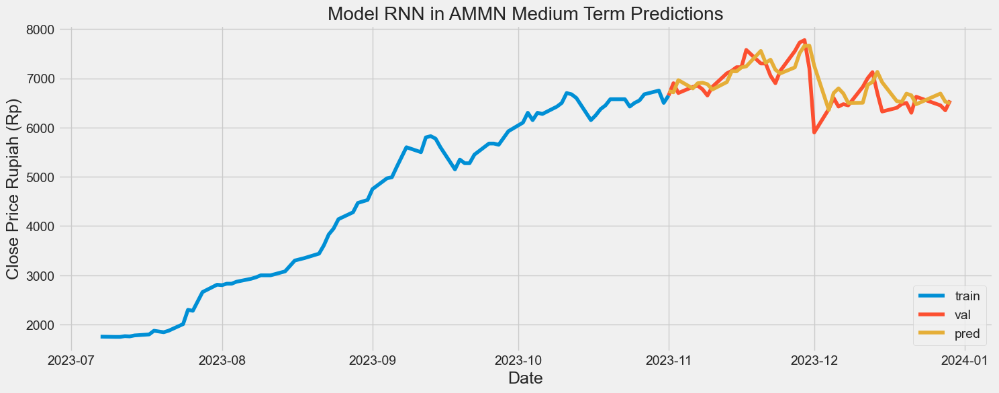

In [610]:
# Visualize the data
# Plot the data
train = AMMN["2023-01":"2023-11-01"]
valid = AMMN["2023-11-01":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMMN Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [611]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(AMMN_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 383.72262971372476.
The root mean squared error after normalization is 0.21175832565923428.


### AMRT

#### Data Split

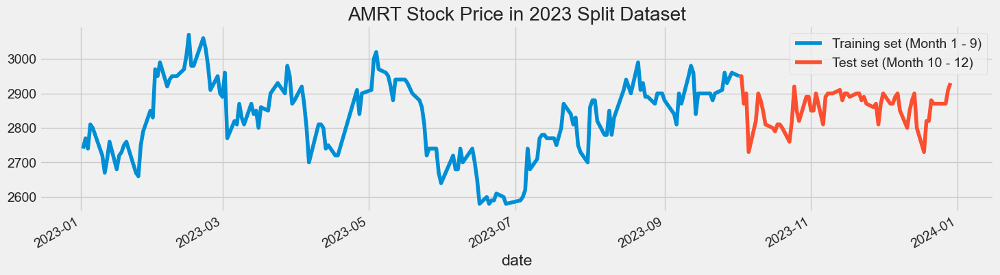

In [612]:
AMRT_medium_train = AMRT["2023-01":"2023-10-02"].iloc[:,3:4].values
AMRT_medium_test = AMRT["2023-10-02":"2023-12"].iloc[:,3:4].values
AMRT["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
AMRT["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('AMRT Stock Price in 2023 Split Dataset')
plt.show()

In [614]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMRT_medium_train)

len_train = len(AMRT_medium_train)
len_test = len(AMRT_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [615]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50


5/5 [==============================] - 0s 33ms/step - loss: 0.0112
Epoch 2/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0092
Epoch 3/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0092
Epoch 4/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0096
Epoch 5/50
5/5 [==============================] - 0s 45ms/step - loss: 0.0082
Epoch 6/50
5/5 [==============================] - 0s 47ms/step - loss: 0.0089
Epoch 7/50
5/5 [==============================] - 0s 44ms/step - loss: 0.0081
Epoch 8/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0090
Epoch 9/50
5/5 [==============================] - 0s 34ms/step - loss: 0.0093
Epoch 10/50
5/5 [==============================] - 0s 34ms/step - loss: 0.0091
Epoch 11/50
5/5 [==============================] - 0s 34ms/step - loss: 0.0089
Epoch 12/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0077
Epoch 13/50
5/5 [==============================] - 0s 35ms/step - loss: 

2/2 [==============================] - 0s 14ms/step


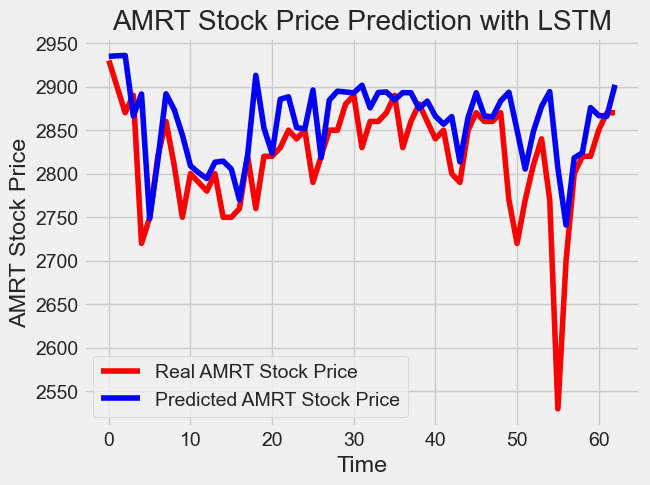

In [616]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"]["2023-01":"2023-10-02"],AMRT["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('AMRT', AMRT_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\544419584.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


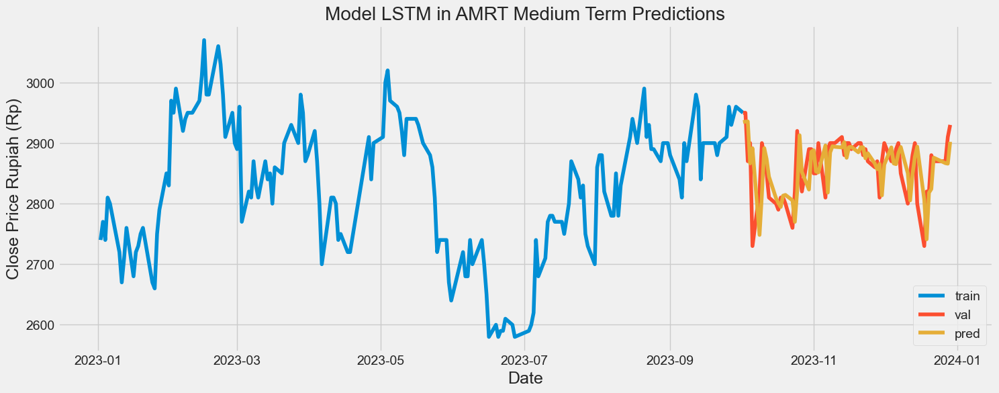

In [617]:
# Visualize the data
# Plot the data
train = AMRT["2023-01":"2023-10-02"]
valid = AMRT["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMRT Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [618]:
# Evaluating the sequence
rmse = return_rmse(AMRT_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 63.63671271159092.
The root mean squared error after normalization is 0.1568370576241439.


#### GRU Predictions

In [619]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0228
Epoch 2/50
2/2 [==============================] - 0s 38ms/step - loss: 0.0207
Epoch 3/50
2/2 [==============================] - 0s 34ms/step - loss: 0.0199
Epoch 4/50
2/2 [==============================] - 0s 35ms/step - loss: 0.0204
Epoch 5/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0214
Epoch 6/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0211
Epoch 7/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0218
Epoch 8/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0197
Epoch 9/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0200
Epoch 10/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0214
Epoch 11/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0199
Epoch 12/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0186
Epoch 13/50
2/2 [==============================] - 0s 39ms/st

2/2 [==============================] - 0s 18ms/step


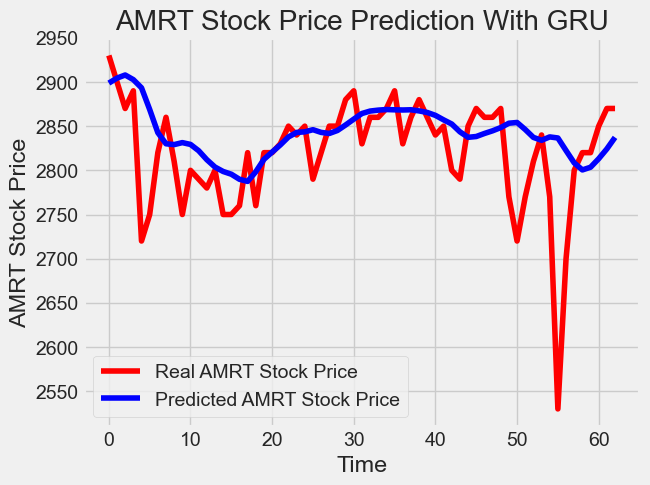

In [620]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"]["2023-01":"2023-10-02"],AMRT["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("AMRT", AMRT_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1936509062.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


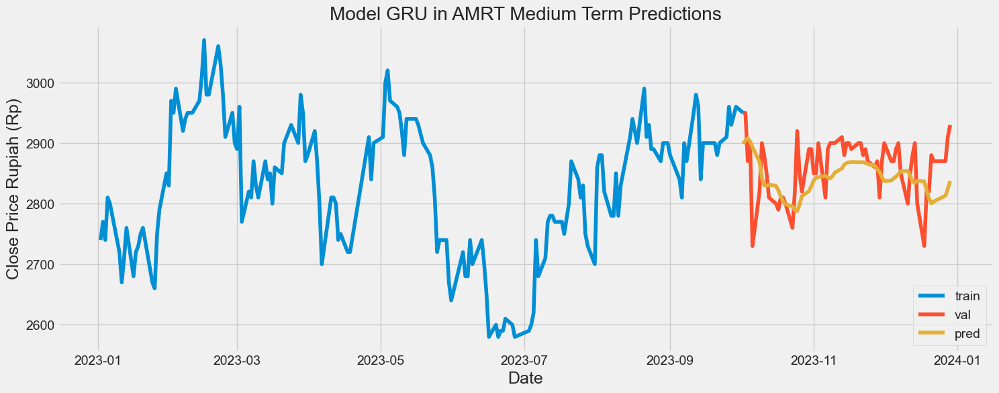

In [621]:
# Visualize the data
# Plot the data
train = AMRT["2023-01":"2023-10-02"]
valid = AMRT["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMRT Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [622]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(AMRT_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 60.95145115747875.
The root mean squared error after normalization is 0.15237862789369694.


#### RNN Predictions

In [623]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 25ms/step - loss: 0.0102 - accuracy: 0.0127
Epoch 2/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0111 - accuracy: 0.0127
Epoch 3/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0092 - accuracy: 0.0127
Epoch 4/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0100 - accuracy: 0.0127
Epoch 5/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0083 - accuracy: 0.0127
Epoch 6/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0094 - accuracy: 0.0127
Epoch 7/50
5/5 [==============================] - 0s 24ms/step - loss: 0.0085 - accuracy: 0.0127
Epoch 8/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0098 - accuracy: 0.0127
Epoch 9/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0102 - accuracy: 0.0127
Epoch 10/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0096 - accuracy: 0.0127
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 7ms/step


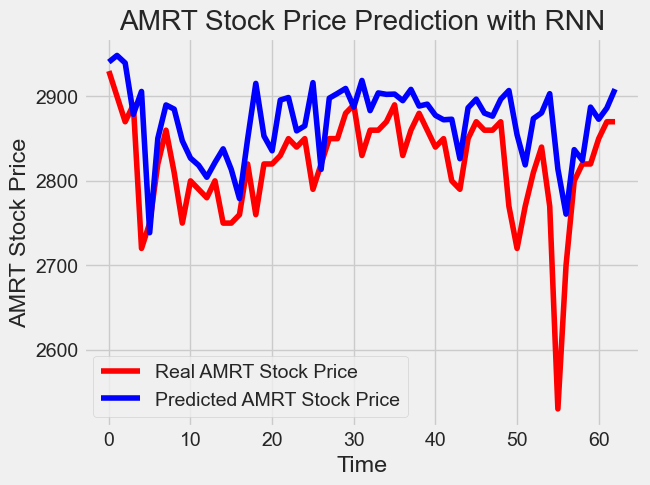

In [624]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"]["2023-01":"2023-10-02"],AMRT["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('AMRT', AMRT_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2205770258.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


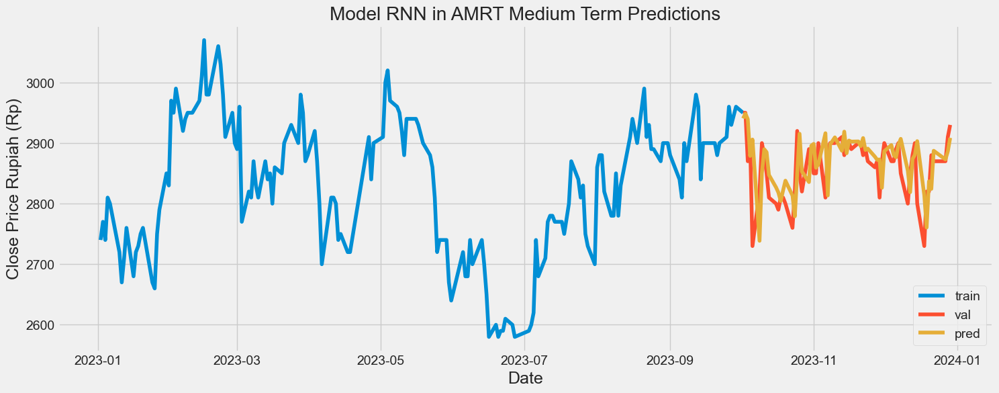

In [626]:
# Visualize the data
# Plot the data
train = AMRT["2023-01":"2023-10-02"]
valid = AMRT["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMRT Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [627]:

# Evaluating the sequence
rmse = return_rmse(AMRT_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 70.79412844184093.
The root mean squared error after normalization is 0.16917265055317685.


### ASII

#### Data Split

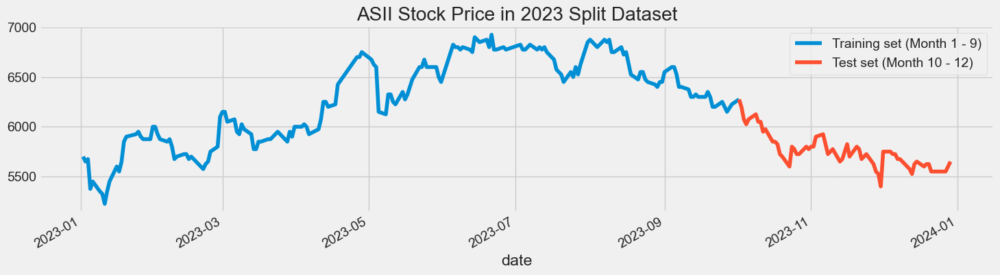

In [628]:
ASII_medium_train = ASII["2023-01":"2023-10-02"].iloc[:,3:4].values
ASII_medium_test = ASII["2023-10-02":"2023-12"].iloc[:,3:4].values
ASII["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
ASII["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('ASII Stock Price in 2023 Split Dataset')
plt.show()

In [629]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ASII_medium_train)

len_train = len(ASII_medium_train)
len_test = len(ASII_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))


177 63


#### LSTM Predictions

In [631]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0047
Epoch 2/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0046
Epoch 3/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0045
Epoch 4/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0049
Epoch 5/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0051
Epoch 6/50
5/5 [==============================] - 0s 51ms/step - loss: 0.0041
Epoch 7/50
5/5 [==============================] - 0s 44ms/step - loss: 0.0047
Epoch 8/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0043
Epoch 9/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0047
Epoch 10/50
5/5 [==============================] - 0s 46ms/step - loss: 0.0042
Epoch 11/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0045
Epoch 12/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0044
Epoch 13/50
5/5 [==============================] - 0s 37ms/st

2/2 [==============================] - 0s 15ms/step


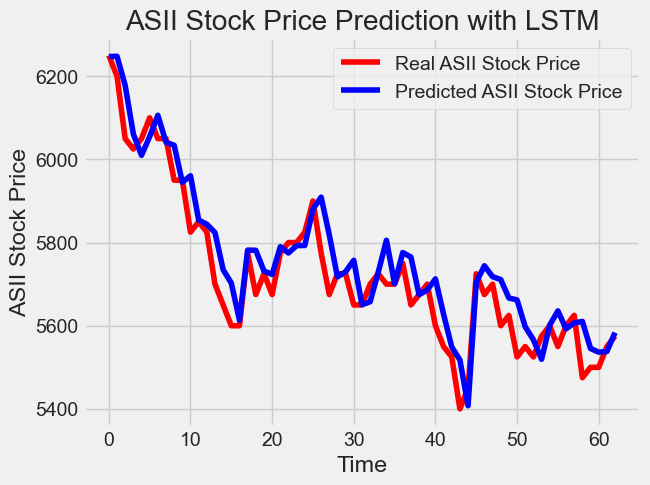

In [632]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"]["2023-01":"2023-10-02"],ASII["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('ASII', ASII_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1505808189.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


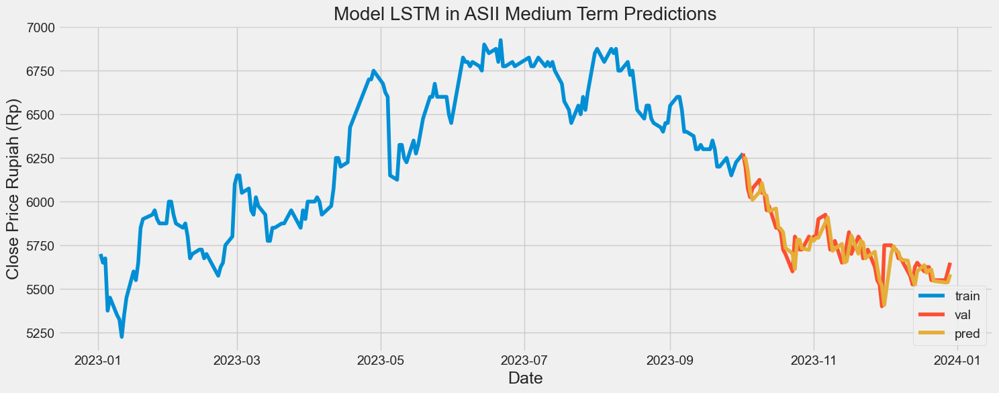

In [633]:
# Visualize the data
# Plot the data
train = ASII["2023-01":"2023-10-02"]
valid = ASII["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ASII Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [634]:
# Evaluating the sequence
rmse = return_rmse(ASII_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 67.78495069246337.
The root mean squared error after normalization is 0.07974700081466274.


#### GRU Predictions

In [635]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0117
Epoch 2/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0099
Epoch 3/50
2/2 [==============================] - 0s 35ms/step - loss: 0.0099
Epoch 4/50
2/2 [==============================] - 0s 34ms/step - loss: 0.0092
Epoch 5/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0090
Epoch 6/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0100
Epoch 7/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0095
Epoch 8/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0094
Epoch 9/50
2/2 [==============================] - 0s 38ms/step - loss: 0.0110
Epoch 10/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0100
Epoch 11/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0094
Epoch 12/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0103
Epoch 13/50
2/2 [==============================] - 0s 39ms/st

2/2 [==============================] - 0s 17ms/step


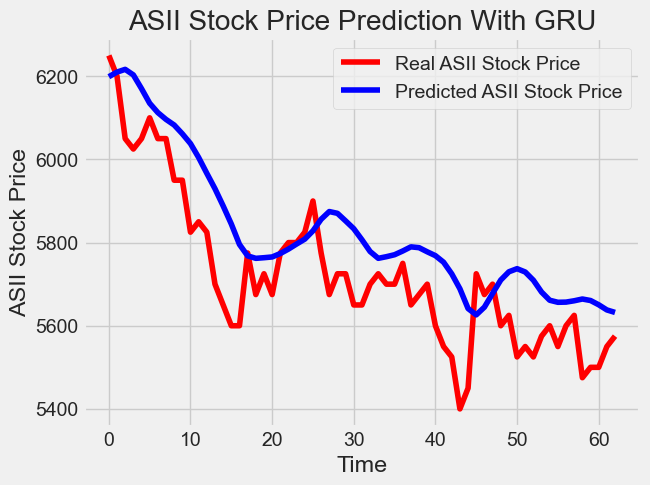

In [636]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"]["2023-01":"2023-10-02"],ASII["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("ASII", ASII_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3151604182.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


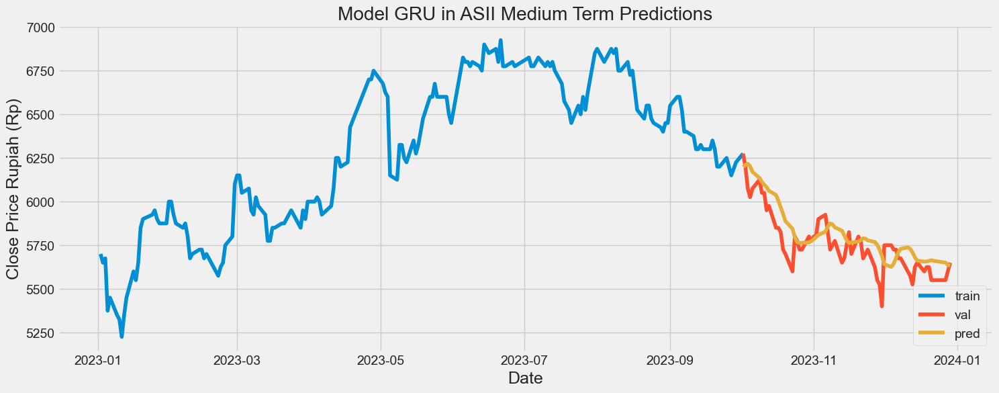

In [637]:
# Visualize the data
# Plot the data
train = ASII["2023-01":"2023-10-02"]
valid = ASII["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ASII Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [638]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(ASII_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 134.09182330239108.
The root mean squared error after normalization is 0.1577550862381072.


#### RNN Predictions

In [639]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0051 - accuracy: 0.0191
Epoch 2/50
5/5 [==============================] - 0s 18ms/step - loss: 0.0059 - accuracy: 0.0191
Epoch 3/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0067 - accuracy: 0.0191
Epoch 4/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0058 - accuracy: 0.0191
Epoch 5/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0061 - accuracy: 0.0191
Epoch 6/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0057 - accuracy: 0.0191
Epoch 7/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0062 - accuracy: 0.0191
Epoch 8/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0066 - accuracy: 0.0191
Epoch 9/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0059 - accuracy: 0.0191
Epoch 10/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0064 - accuracy: 0.0191
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 8ms/step


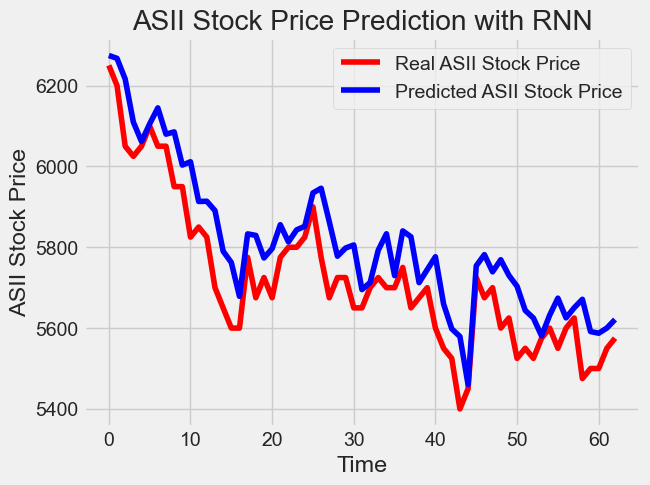

In [640]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"]["2023-01":"2023-10-02"],ASII["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('ASII', ASII_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1620255119.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


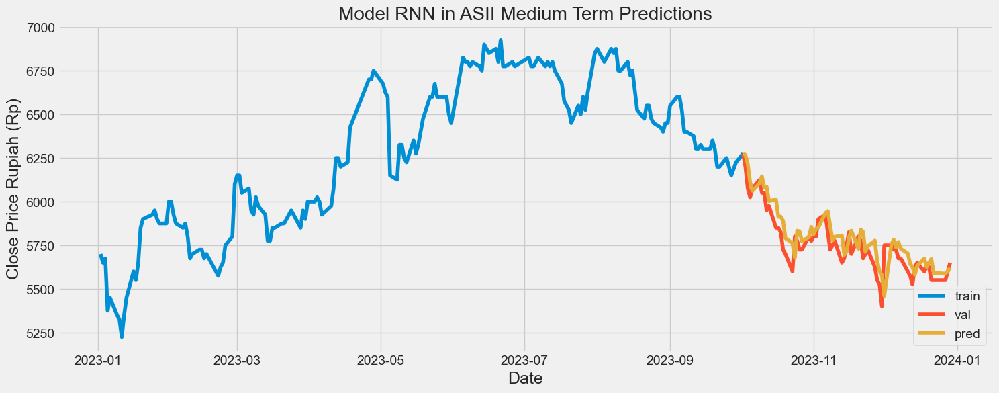

In [641]:
# Visualize the data
# Plot the data
train = ASII["2023-01":"2023-10-02"]
valid = ASII["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ASII Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [642]:
# Evaluating the sequence
rmse = return_rmse(ASII_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 104.48419064990446.
The root mean squared error after normalization is 0.1194736406186775.


### GOTO

#### Data Split

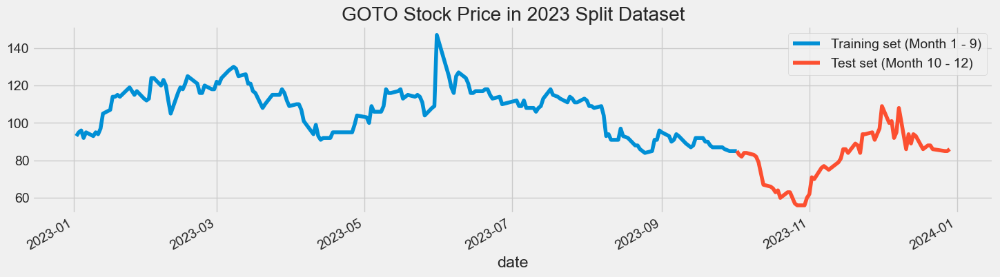

In [643]:
GOTO_medium_train = GOTO["2023-01":"2023-10-02"].iloc[:,3:4].values
GOTO_medium_test = GOTO["2023-10-02":"2023-12"].iloc[:,3:4].values
GOTO["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
GOTO["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('GOTO Stock Price in 2023 Split Dataset')
plt.show()

In [644]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(GOTO_medium_train)

len_train = len(GOTO_medium_train)
len_test = len(GOTO_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))


177 63


#### LSTM Predictions

In [645]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0078
Epoch 2/50
5/5 [==============================] - 0s 36ms/step - loss: 0.0080
Epoch 3/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0085
Epoch 4/50
5/5 [==============================] - 0s 45ms/step - loss: 0.0088
Epoch 5/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0087
Epoch 6/50
5/5 [==============================] - 0s 46ms/step - loss: 0.0079
Epoch 7/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0084
Epoch 8/50
5/5 [==============================] - 0s 49ms/step - loss: 0.0087
Epoch 9/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0081
Epoch 10/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0083
Epoch 11/50
5/5 [==============================] - 0s 52ms/step - loss: 0.0085
Epoch 12/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0086
Epoch 13/50
5/5 [==============================] - 0s 41ms/st

2/2 [==============================] - 0s 12ms/step


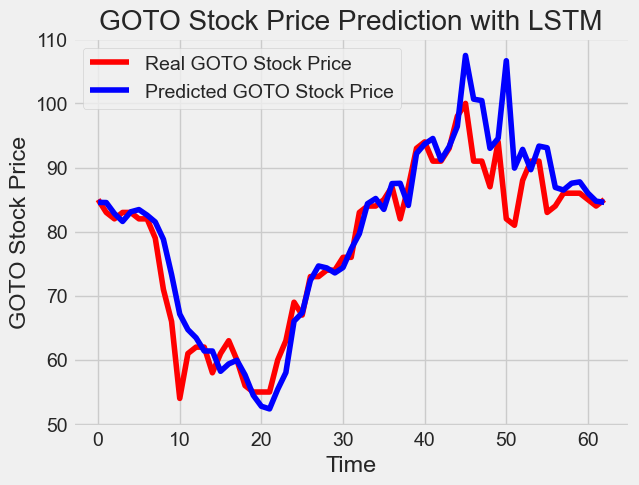

In [646]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"]["2023-01":"2023-10-02"],GOTO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('GOTO', GOTO_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\823254503.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


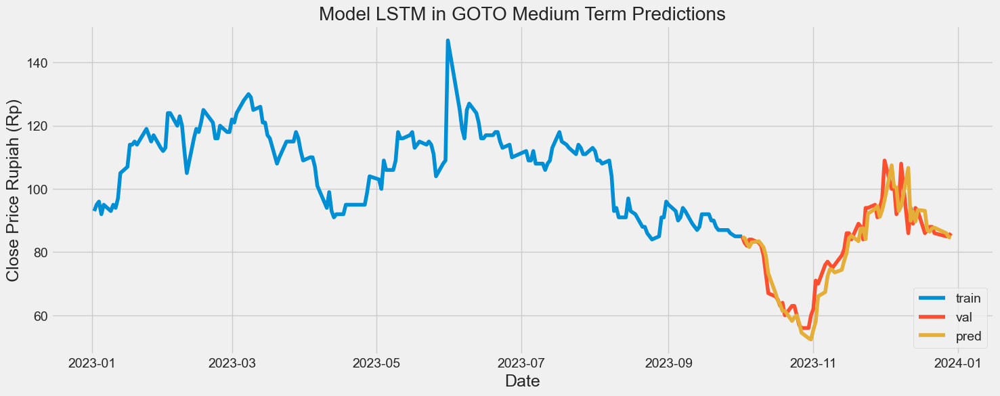

In [647]:
# Visualize the data
# Plot the data
train = GOTO["2023-01":"2023-10-02"]
valid = GOTO["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in GOTO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [648]:
# Evaluating the sequence
rmse = return_rmse(GOTO_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 5.051725524358905.
The root mean squared error after normalization is 0.09165884910597782.


#### GRU Predictions

In [649]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0185
Epoch 2/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0202
Epoch 3/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0182
Epoch 4/50
2/2 [==============================] - 0s 33ms/step - loss: 0.0173
Epoch 5/50
2/2 [==============================] - 0s 34ms/step - loss: 0.0172
Epoch 6/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0172
Epoch 7/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0192
Epoch 8/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0197
Epoch 9/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0175
Epoch 10/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0175
Epoch 11/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0171
Epoch 12/50
2/2 [==============================] - 0s 55ms/step - loss: 0.0193
Epoch 13/50
2/2 [==============================] - 0s 41ms/st

2/2 [==============================] - 0s 12ms/step


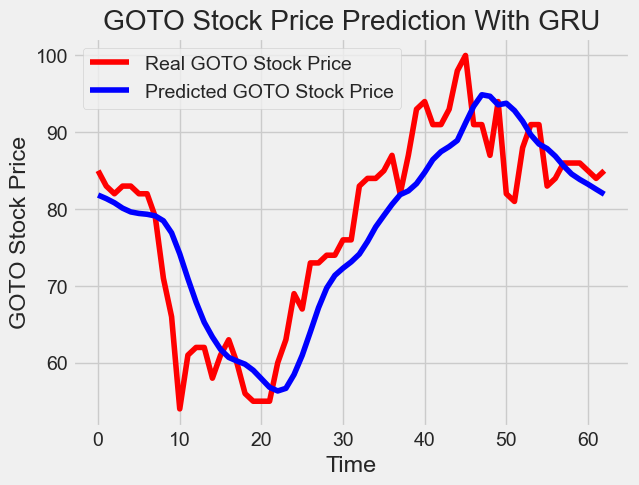

In [650]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"]["2023-01":"2023-10-02"],GOTO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("GOTO", GOTO_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2104518936.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


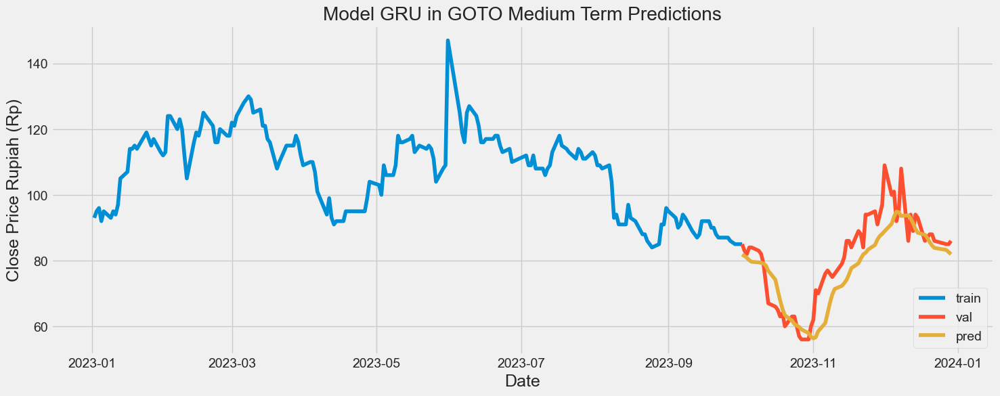

In [651]:
# Visualize the data
# Plot the data
train = GOTO["2023-01":"2023-10-02"]
valid = GOTO["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in GOTO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [652]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(GOTO_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 6.07241286551235.
The root mean squared error after normalization is 0.132008975337225.


#### RNN Predictions

In [653]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0099 - accuracy: 0.0191
Epoch 2/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0103 - accuracy: 0.0191
Epoch 3/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0104 - accuracy: 0.0191
Epoch 4/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0101 - accuracy: 0.0191
Epoch 5/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0093 - accuracy: 0.0191
Epoch 6/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0103 - accuracy: 0.0191
Epoch 7/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0095 - accuracy: 0.0191
Epoch 8/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0083 - accuracy: 0.0191
Epoch 9/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0096 - accuracy: 0.0191
Epoch 10/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0098 - accuracy: 0.0191
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 7ms/step


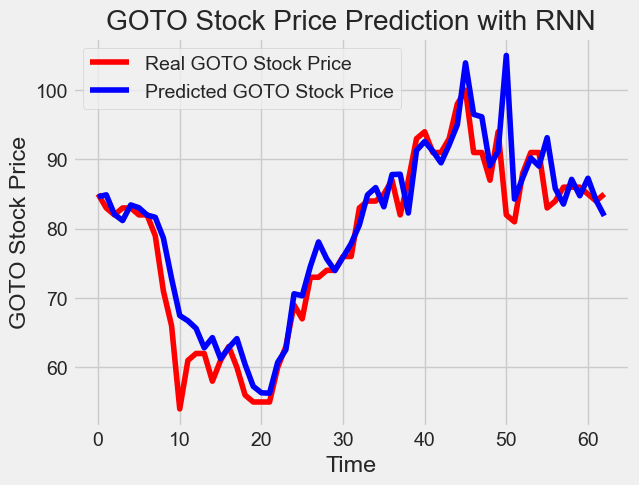

In [654]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"]["2023-01":"2023-10-02"],GOTO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('GOTO', GOTO_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2015191341.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


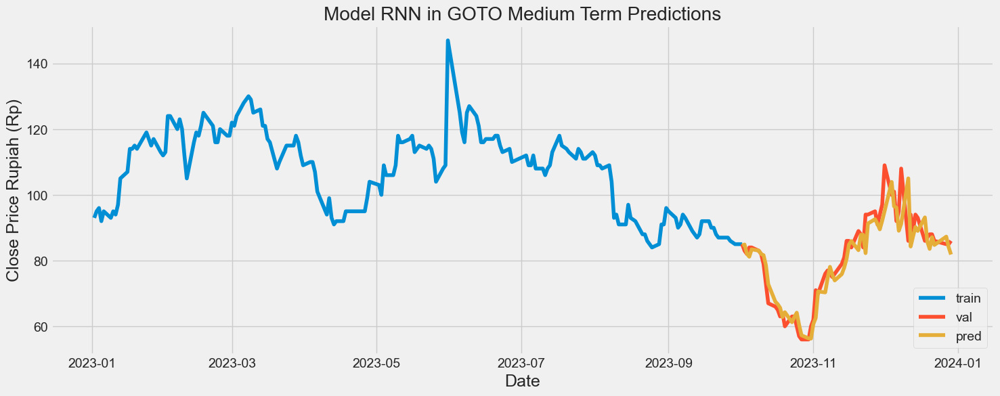

In [655]:
# Visualize the data
# Plot the data
train = GOTO["2023-01":"2023-10-02"]
valid = GOTO["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in GOTO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [656]:
# Evaluating the sequence
rmse = return_rmse(GOTO_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 4.5953556057447775.
The root mean squared error after normalization is 0.09008913600457379.


### KLBF

#### Data Split

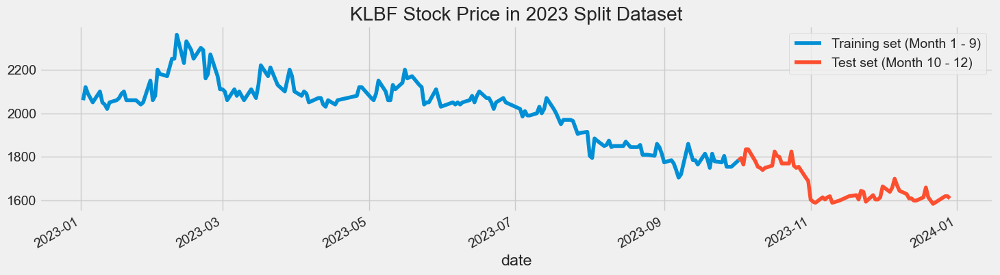

In [657]:
KLBF_medium_train = KLBF["2023-01":"2023-10-02"].iloc[:,3:4].values
KLBF_medium_test = KLBF["2023-10-02":"2023-12"].iloc[:,3:4].values
KLBF["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
KLBF["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('KLBF Stock Price in 2023 Split Dataset')
plt.show()

In [658]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(KLBF_medium_train)

len_train = len(KLBF_medium_train)
len_test = len(KLBF_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [659]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 1s 40ms/step - loss: 0.0054
Epoch 2/50
5/5 [==============================] - 0s 66ms/step - loss: 0.0042
Epoch 3/50
5/5 [==============================] - 0s 52ms/step - loss: 0.0038
Epoch 4/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0039
Epoch 5/50
5/5 [==============================] - 0s 35ms/step - loss: 0.0041
Epoch 6/50
5/5 [==============================] - 0s 36ms/step - loss: 0.0042
Epoch 7/50
5/5 [==============================] - 0s 35ms/step - loss: 0.0039
Epoch 8/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0040
Epoch 9/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0039
Epoch 10/50
5/5 [==============================] - 0s 30ms/step - loss: 0.0043
Epoch 11/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0042
Epoch 12/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0041
Epoch 13/50
5/5 [==============================] - 0s 31ms/st

2/2 [==============================] - 0s 16ms/step


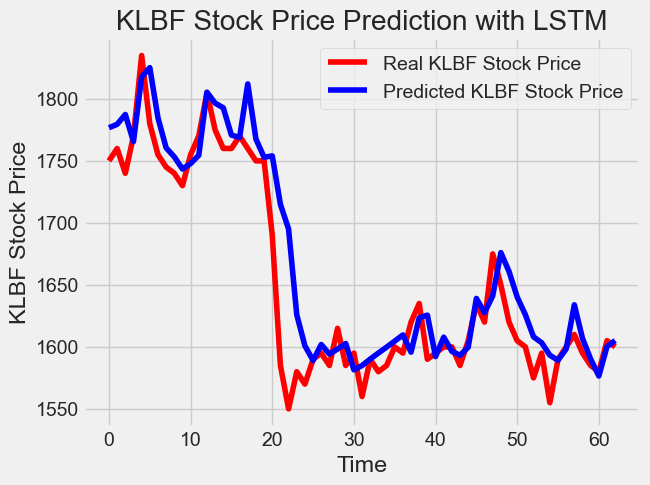

In [660]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"]["2023-01":"2023-10-02"],KLBF["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('KLBF', KLBF_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1911474585.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


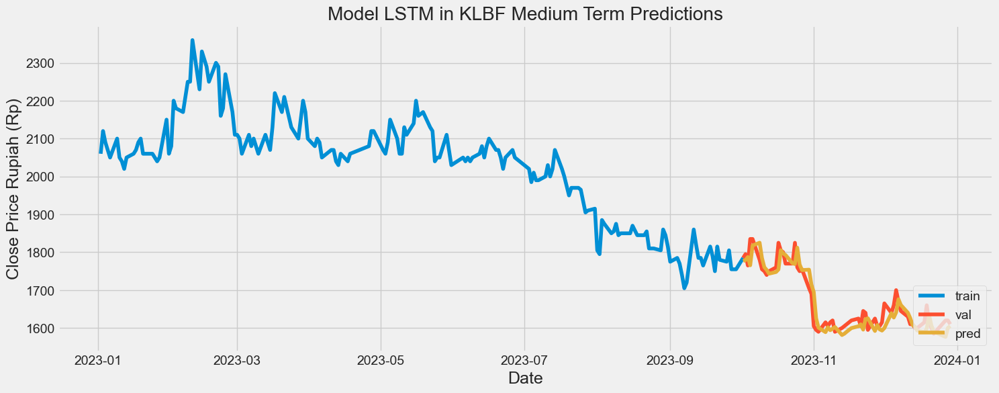

In [661]:
# Visualize the data
# Plot the data
train = KLBF["2023-01":"2023-10-02"]
valid = KLBF["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in KLBF Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [662]:
# Evaluating the sequence
rmse = return_rmse(KLBF_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 33.45399512387919.
The root mean squared error after normalization is 0.11738243903115503.


#### GRU Predictions

In [663]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0106
Epoch 2/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0093
Epoch 3/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0074
Epoch 4/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0065
Epoch 5/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0086
Epoch 6/50
2/2 [==============================] - 0s 50ms/step - loss: 0.0106
Epoch 7/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0077
Epoch 8/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0078
Epoch 9/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0069
Epoch 10/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0070
Epoch 11/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0068
Epoch 12/50
2/2 [==============================] - 0s 54ms/step - loss: 0.0073
Epoch 13/50
2/2 [==============================] - 0s 37ms/st

2/2 [==============================] - 0s 12ms/step


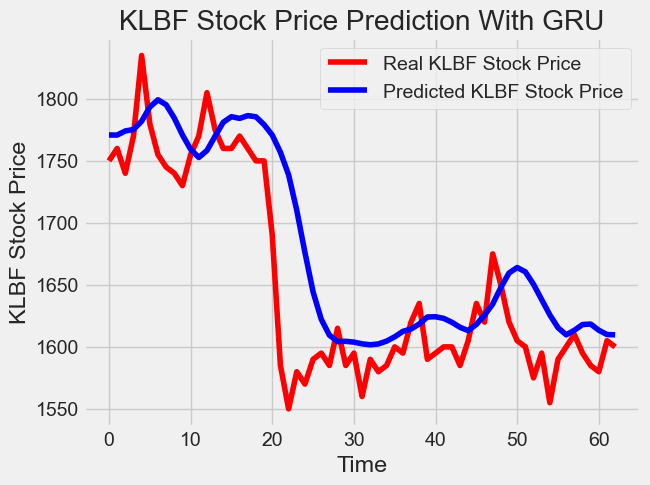

In [665]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"]["2023-01":"2023-10-02"],KLBF["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("KLBF", KLBF_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\893678420.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


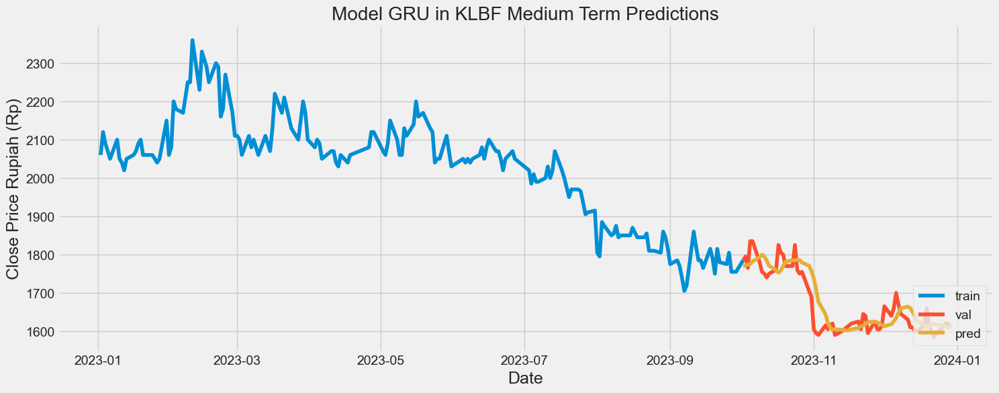

In [666]:
# Visualize the data
# Plot the data
train = KLBF["2023-01":"2023-10-02"]
valid = KLBF["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in KLBF Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [667]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(KLBF_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 50.18862191337051.
The root mean squared error after normalization is 0.17610042776621235.


#### RNN Predictions

In [668]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0055 - accuracy: 0.0127
Epoch 2/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0056 - accuracy: 0.0127
Epoch 3/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0050 - accuracy: 0.0127
Epoch 4/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0048 - accuracy: 0.0127
Epoch 5/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0052 - accuracy: 0.0127
Epoch 6/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0048 - accuracy: 0.0127
Epoch 7/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0045 - accuracy: 0.0127
Epoch 8/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0057 - accuracy: 0.0127
Epoch 9/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0052 - accuracy: 0.0127
Epoch 10/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0043 - accuracy: 0.0127
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 7ms/step


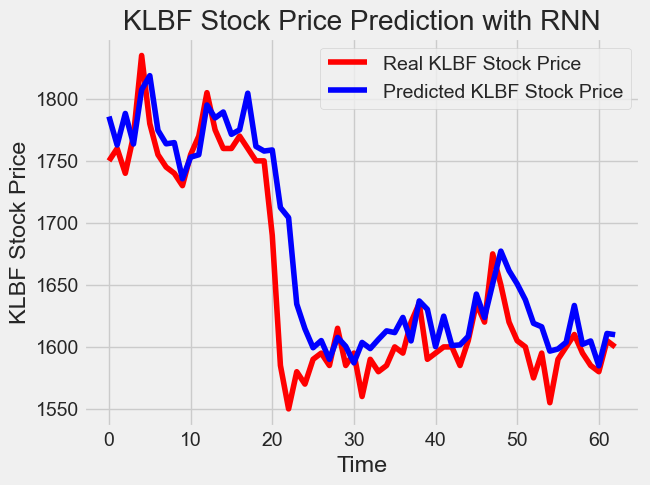

In [669]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"]["2023-01":"2023-10-02"],KLBF["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('KLBF', KLBF_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2737896725.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


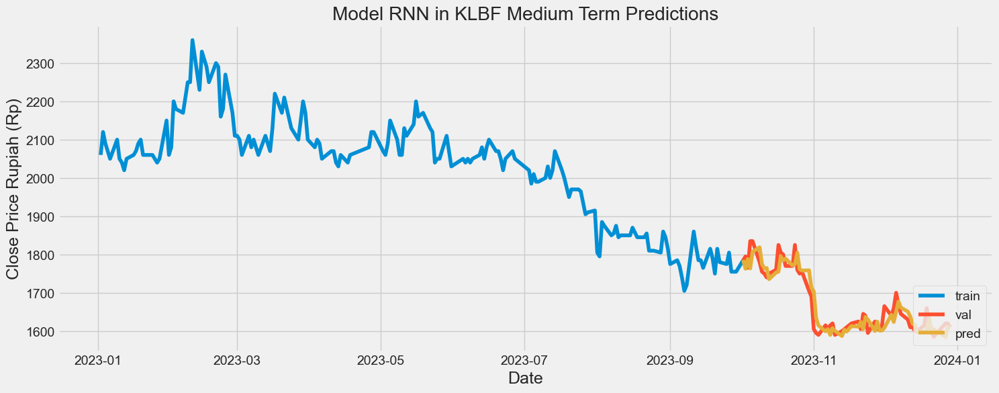

In [670]:
# Visualize the data
# Plot the data
train = KLBF["2023-01":"2023-10-02"]
valid = KLBF["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in KLBF Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [671]:
# Evaluating the sequence
rmse = return_rmse(KLBF_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 35.71664701625408.
The root mean squared error after normalization is 0.12532156847808448.


### MAPI

#### Data Split

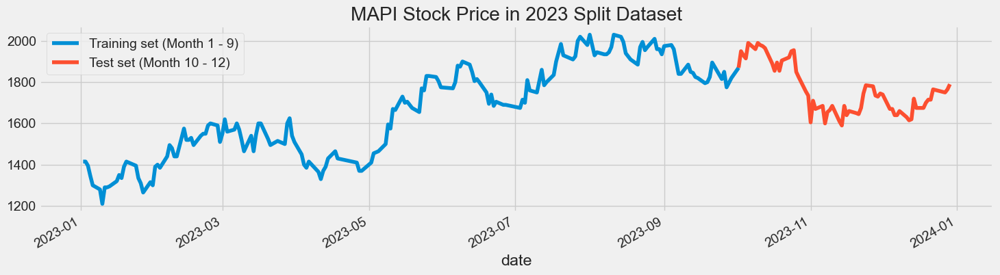

In [540]:
MAPI_medium_train = MAPI["2023-01":"2023-10-02"].iloc[:,3:4].values
MAPI_medium_test = MAPI["2023-10-02":"2023-12"].iloc[:,3:4].values
MAPI["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
MAPI["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('MAPI Stock Price in 2023 Split Dataset')
plt.show()

In [541]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(MAPI_medium_train)

len_train = len(MAPI_medium_train)
len_test = len(MAPI_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [542]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 31ms/step - loss: 0.0050
Epoch 2/50
5/5 [==============================] - 0s 28ms/step - loss: 0.0043
Epoch 3/50
5/5 [==============================] - 0s 29ms/step - loss: 0.0038
Epoch 4/50
5/5 [==============================] - 0s 34ms/step - loss: 0.0039
Epoch 5/50
5/5 [==============================] - 0s 31ms/step - loss: 0.0045
Epoch 6/50
5/5 [==============================] - 0s 30ms/step - loss: 0.0046
Epoch 7/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0038
Epoch 8/50
5/5 [==============================] - 0s 31ms/step - loss: 0.0058
Epoch 9/50
5/5 [==============================] - 0s 30ms/step - loss: 0.0046
Epoch 10/50
5/5 [==============================] - 0s 30ms/step - loss: 0.0041
Epoch 11/50
5/5 [==============================] - 0s 32ms/step - loss: 0.0040
Epoch 12/50
5/5 [==============================] - 0s 31ms/step - loss: 0.0043
Epoch 13/50
5/5 [==============================] - 0s 29ms/st

2/2 [==============================] - 0s 11ms/step


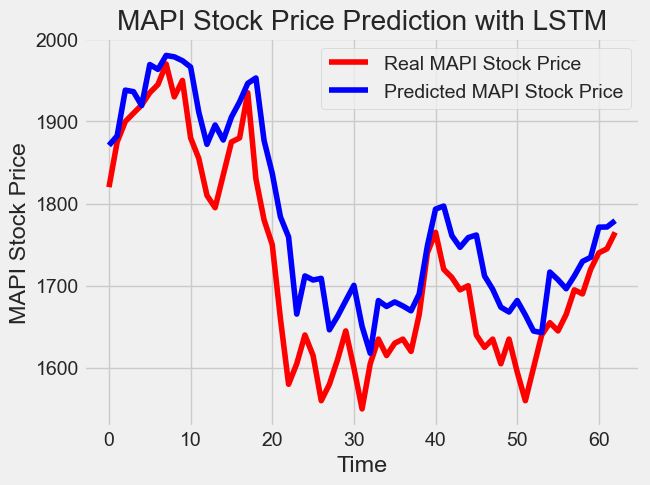

In [543]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"]["2023-01":"2023-10-02"],MAPI["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('MAPI', MAPI_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1272168269.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


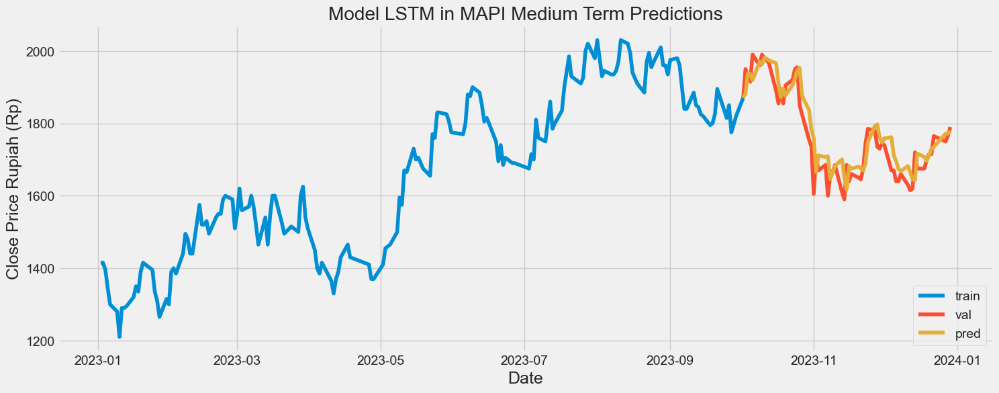

In [544]:
# Visualize the data
# Plot the data
train = MAPI["2023-01":"2023-10-02"]
valid = MAPI["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in MAPI Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [545]:
# Evaluating the sequence
rmse = return_rmse(MAPI_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 66.6830423639109.
The root mean squared error after normalization is 0.15493600618679249.


#### GRU Predictions

In [546]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 35ms/step - loss: 0.0081
Epoch 2/50
2/2 [==============================] - 0s 32ms/step - loss: 0.0084
Epoch 3/50
2/2 [==============================] - 0s 31ms/step - loss: 0.0071
Epoch 4/50
2/2 [==============================] - 0s 35ms/step - loss: 0.0065
Epoch 5/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0093
Epoch 6/50
2/2 [==============================] - 0s 21ms/step - loss: 0.0079
Epoch 7/50
2/2 [==============================] - 0s 34ms/step - loss: 0.0084
Epoch 8/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0074
Epoch 9/50
2/2 [==============================] - 0s 19ms/step - loss: 0.0074
Epoch 10/50
2/2 [==============================] - 0s 29ms/step - loss: 0.0080
Epoch 11/50
2/2 [==============================] - 0s 27ms/step - loss: 0.0083
Epoch 12/50
2/2 [==============================] - 0s 33ms/step - loss: 0.0078
Epoch 13/50
2/2 [==============================] - 0s 26ms/st

2/2 [==============================] - 0s 9ms/step


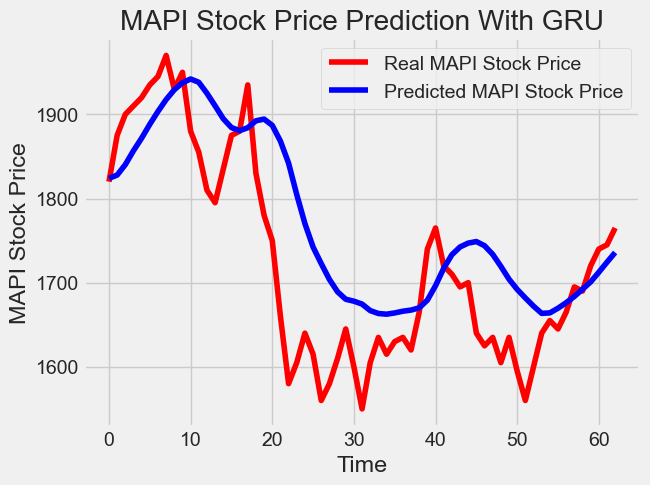

In [547]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"]["2023-01":"2023-10-02"],MAPI["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("MAPI", MAPI_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3531272499.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


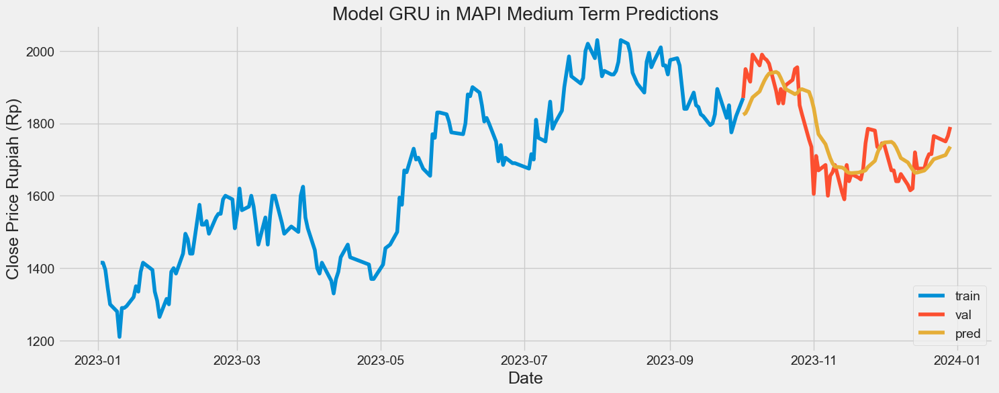

In [548]:
# Visualize the data
# Plot the data
train = MAPI["2023-01":"2023-10-02"]
valid = MAPI["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in MAPI Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [549]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(MAPI_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 85.87226875123072.
The root mean squared error after normalization is 0.20445778274102555.


#### RNN Predictions

In [550]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0057 - accuracy: 0.0064
Epoch 2/50
5/5 [==============================] - 0s 16ms/step - loss: 0.0049 - accuracy: 0.0064
Epoch 3/50
5/5 [==============================] - 0s 15ms/step - loss: 0.0044 - accuracy: 0.0064
Epoch 4/50
5/5 [==============================] - 0s 15ms/step - loss: 0.0056 - accuracy: 0.0064
Epoch 5/50
5/5 [==============================] - 0s 16ms/step - loss: 0.0067 - accuracy: 0.0064
Epoch 6/50
5/5 [==============================] - 0s 18ms/step - loss: 0.0049 - accuracy: 0.0064
Epoch 7/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0059 - accuracy: 0.0064
Epoch 8/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0055 - accuracy: 0.0064
Epoch 9/50
5/5 [==============================] - 0s 24ms/step - loss: 0.0054 - accuracy: 0.0064
Epoch 10/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0061 - accuracy: 0.0064
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 6ms/step


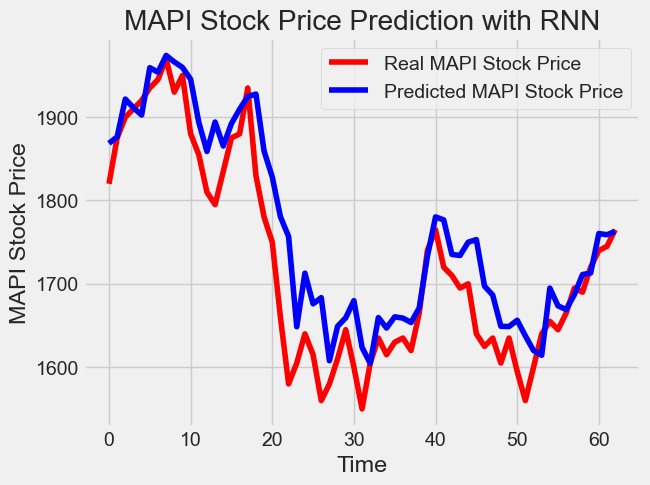

In [551]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"]["2023-01":"2023-10-02"],MAPI["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('MAPI', MAPI_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1148126434.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


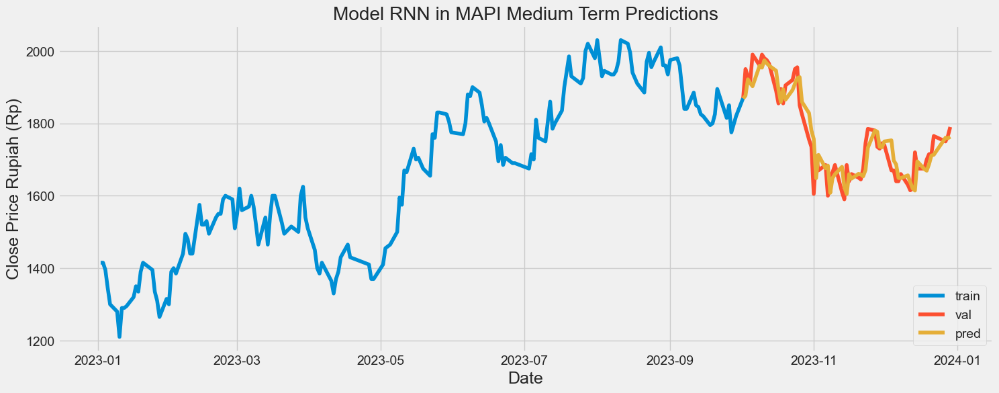

In [552]:
# Visualize the data
# Plot the data
train = MAPI["2023-01":"2023-10-02"]
valid = MAPI["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in MAPI Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [553]:
# Evaluating the sequence
rmse = return_rmse(MAPI_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 53.95028328408968.
The root mean squared error after normalization is 0.1272464728902812.


### TLKM

#### Data Split

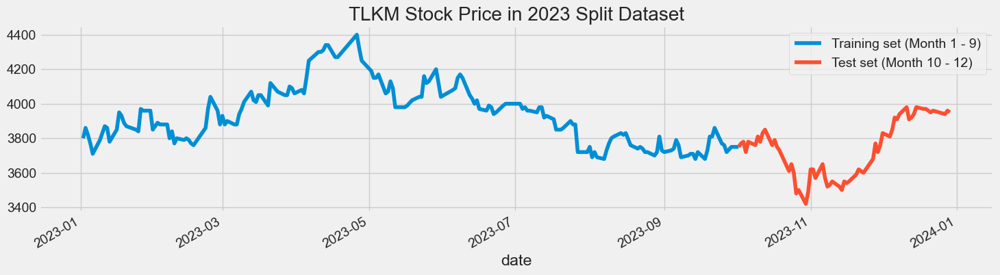

In [554]:
TLKM_medium_train = TLKM["2023-01":"2023-10-02"].iloc[:,3:4].values
TLKM_medium_test = TLKM["2023-10-02":"2023-12"].iloc[:,3:4].values
TLKM["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
TLKM["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('TLKM Stock Price in 2023 Split Dataset')
plt.show()

In [555]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(TLKM_medium_train)

len_train = len(TLKM_medium_train)
len_test = len(TLKM_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))



# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

177 63


#### LSTM Predictions

In [556]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0056
Epoch 2/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0053
Epoch 3/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0059
Epoch 4/50
5/5 [==============================] - 0s 44ms/step - loss: 0.0049
Epoch 5/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0061
Epoch 6/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0058
Epoch 7/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0054
Epoch 8/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0056
Epoch 9/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0059
Epoch 10/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0060
Epoch 11/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0051
Epoch 12/50
5/5 [==============================] - 0s 35ms/step - loss: 0.0055
Epoch 13/50
5/5 [==============================] - 0s 36ms/st

2/2 [==============================] - 0s 12ms/step


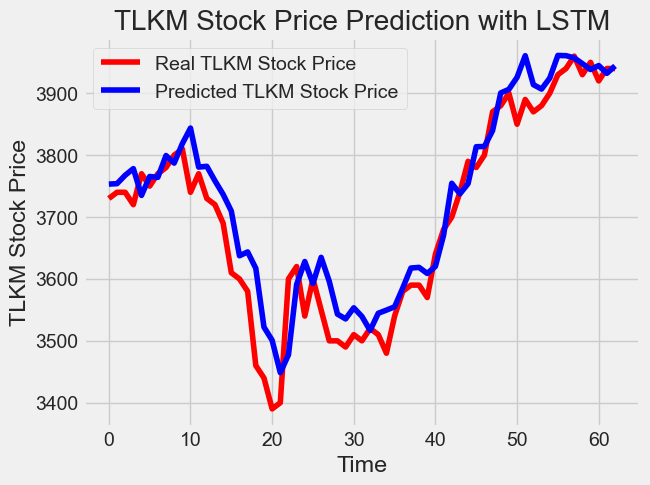

In [557]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"]["2023-01":"2023-10-02"],TLKM["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('TLKM', TLKM_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1747539515.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


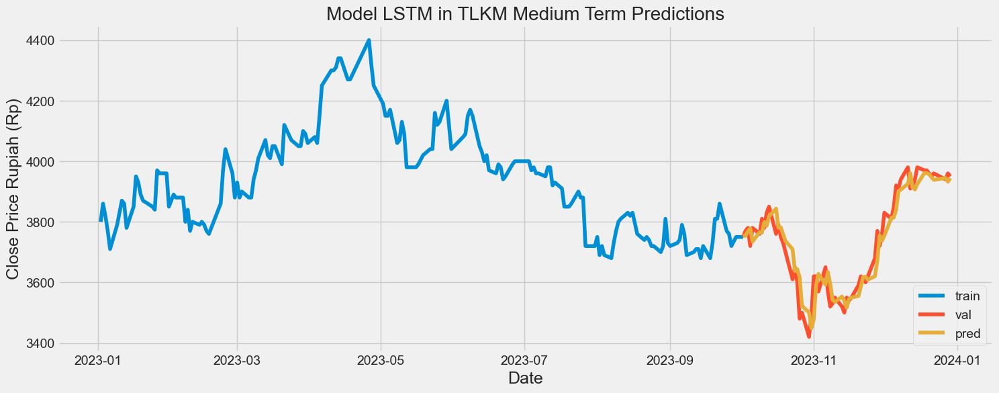

In [558]:
# Visualize the data
# Plot the data
train = TLKM["2023-01":"2023-10-02"]
valid = TLKM["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in TLKM Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [559]:
# Evaluating the sequence
rmse = return_rmse(TLKM_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 51.42002890568916.
The root mean squared error after normalization is 0.09003757616802577.


#### GRU Predictions

In [560]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)


Epoch 1/50


2/2 [==============================] - 0s 44ms/step - loss: 0.0135
Epoch 2/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0133
Epoch 3/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0125
Epoch 4/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0131
Epoch 5/50
2/2 [==============================] - 0s 38ms/step - loss: 0.0121
Epoch 6/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0117
Epoch 7/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0135
Epoch 8/50
2/2 [==============================] - 0s 38ms/step - loss: 0.0140
Epoch 9/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0145
Epoch 10/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0127
Epoch 11/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0121
Epoch 12/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0126
Epoch 13/50
2/2 [==============================] - 0s 39ms/step - loss: 

2/2 [==============================] - 0s 15ms/step


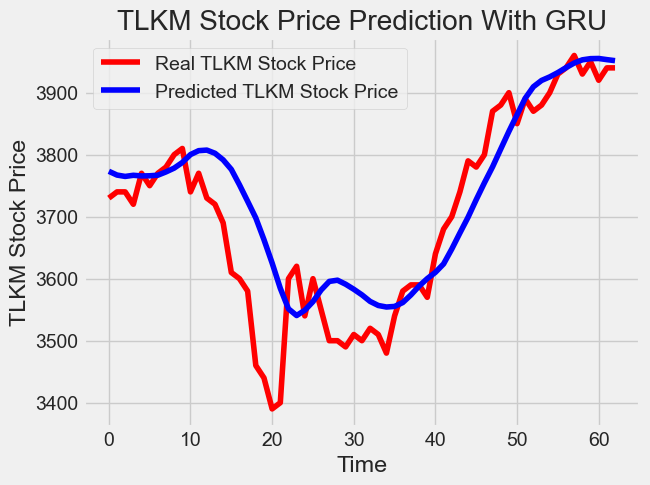

In [562]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"]["2023-01":"2023-10-02"],TLKM["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("TLKM", TLKM_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1644033162.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


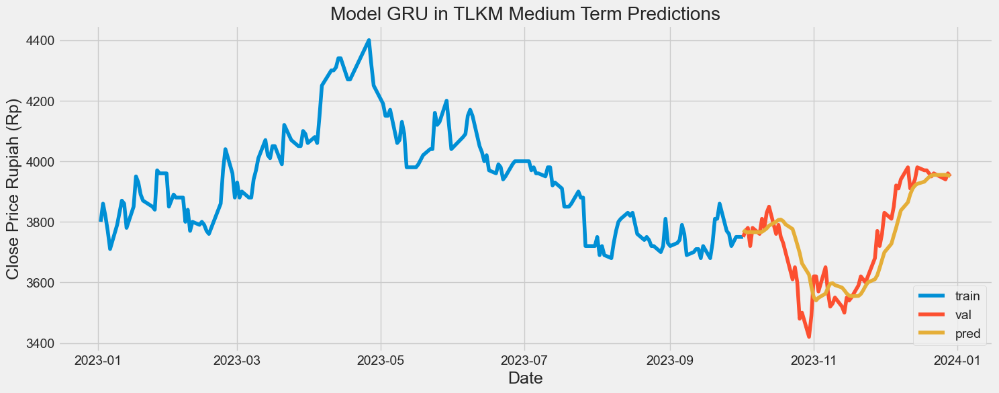

In [563]:
# Visualize the data
# Plot the data
train = TLKM["2023-01":"2023-10-02"]
valid = TLKM["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in TLKM Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [564]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(TLKM_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 80.82231530906652.
The root mean squared error after normalization is 0.1417935356299413.


#### RNN Predictions

In [565]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0061 - accuracy: 0.0382
Epoch 2/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0057 - accuracy: 0.0382
Epoch 3/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0067 - accuracy: 0.0382
Epoch 4/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0062 - accuracy: 0.0382
Epoch 5/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0080 - accuracy: 0.0382
Epoch 6/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0063 - accuracy: 0.0382
Epoch 7/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0046 - accuracy: 0.0382
Epoch 8/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0067 - accuracy: 0.0382
Epoch 9/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0067 - accuracy: 0.0382
Epoch 10/50
5/5 [==============================] - 0s 19ms/step - loss: 0.0062 - accuracy: 0.0382
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 6ms/step


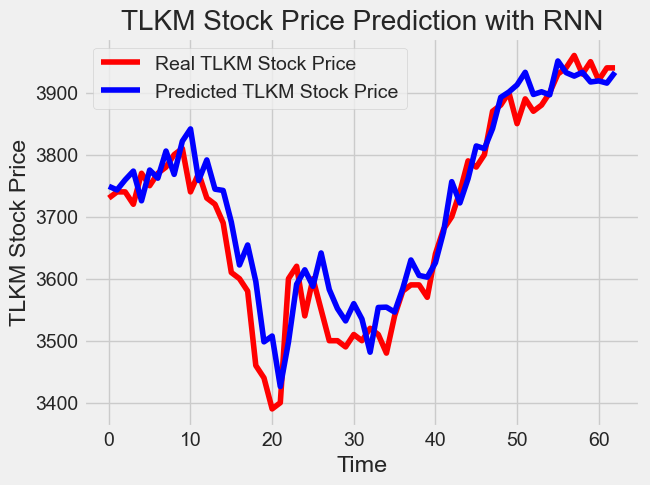

In [566]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"]["2023-01":"2023-10-02"],TLKM["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('TLKM', TLKM_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1947723270.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


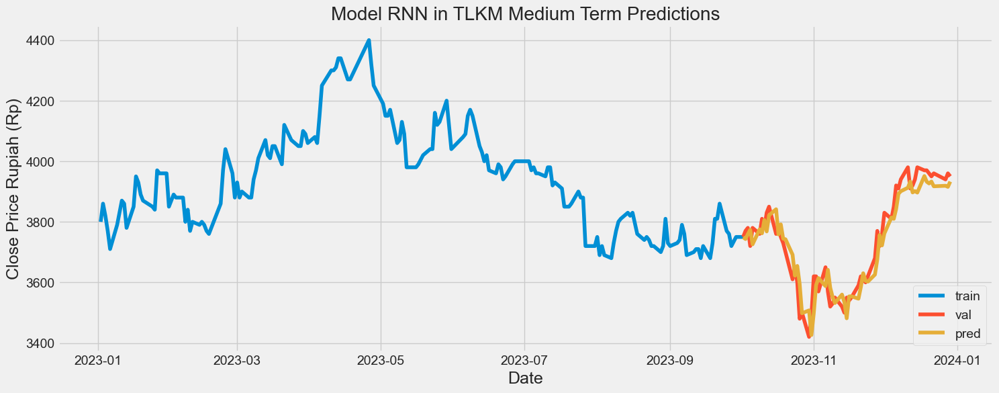

In [567]:
# Visualize the data
# Plot the data
train = TLKM["2023-01":"2023-10-02"]
valid = TLKM["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in TLKM Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [568]:
# Evaluating the sequence
rmse = return_rmse(TLKM_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 47.75516032600117.
The root mean squared error after normalization is 0.08378098302807221.


### BBCA

#### Data Split

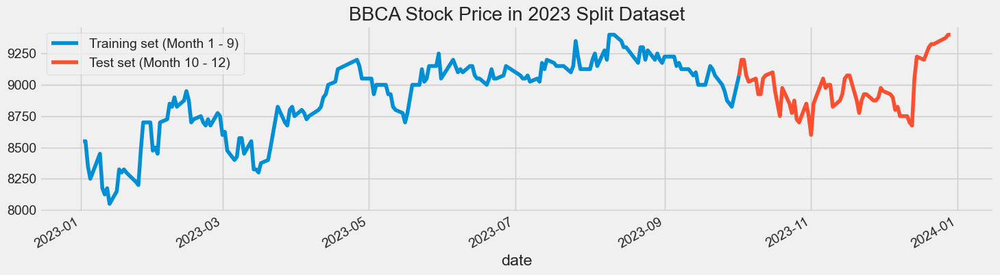

In [569]:
BBCA_medium_train = BBCA["2023-01":"2023-10-02"].iloc[:,3:4].values
BBCA_medium_test = BBCA["2023-10-02":"2023-12"].iloc[:,3:4].values
BBCA["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
BBCA["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('BBCA Stock Price in 2023 Split Dataset')
plt.show()

In [571]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(BBCA_medium_train)

len_train = len(BBCA_medium_train)
len_test = len(BBCA_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [572]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0049
Epoch 2/50
5/5 [==============================] - 0s 46ms/step - loss: 0.0038
Epoch 3/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0045
Epoch 4/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0053
Epoch 5/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0046
Epoch 6/50
5/5 [==============================] - 0s 51ms/step - loss: 0.0037
Epoch 7/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0036
Epoch 8/50
5/5 [==============================] - 0s 34ms/step - loss: 0.0036
Epoch 9/50
5/5 [==============================] - 0s 34ms/step - loss: 0.0042
Epoch 10/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0036
Epoch 11/50
5/5 [==============================] - 0s 35ms/step - loss: 0.0040
Epoch 12/50
5/5 [==============================] - 0s 33ms/step - loss: 0.0047
Epoch 13/50
5/5 [==============================] - 0s 34ms/st

2/2 [==============================] - 0s 12ms/step


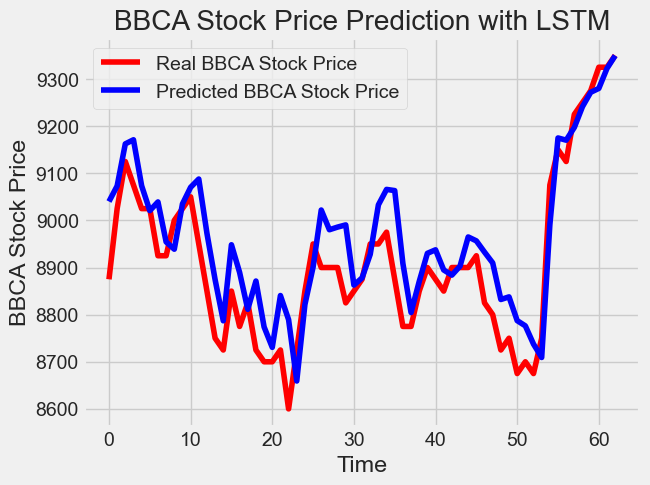

In [573]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"]["2023-01":"2023-10-02"],BBCA["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('BBCA', BBCA_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\380346659.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


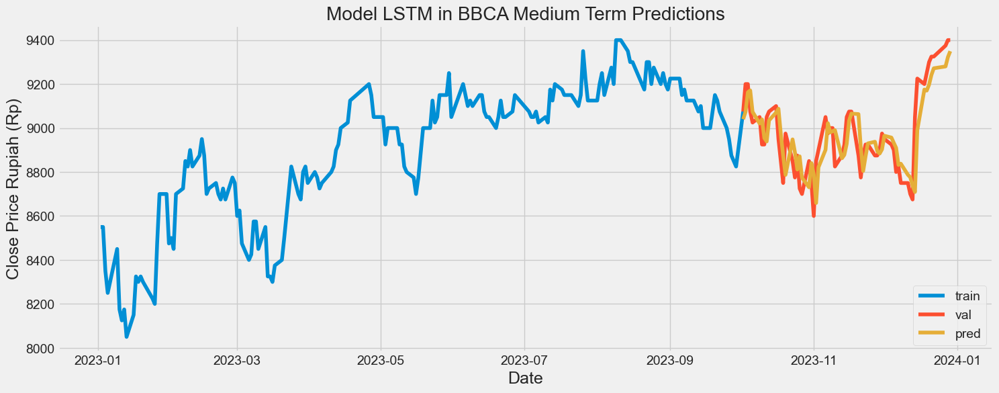

In [574]:
# Visualize the data
# Plot the data
train = BBCA["2023-01":"2023-10-02"]
valid = BBCA["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in BBCA Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [575]:
# Evaluating the sequence
rmse = return_rmse(BBCA_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 83.56272143457016.
The root mean squared error after normalization is 0.11141696191276029.


#### GRU Predictions

In [576]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0078
Epoch 2/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0084
Epoch 3/50
2/2 [==============================] - 0s 37ms/step - loss: 0.0078
Epoch 4/50
2/2 [==============================] - 0s 35ms/step - loss: 0.0067
Epoch 5/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0079
Epoch 6/50
2/2 [==============================] - 0s 25ms/step - loss: 0.0076
Epoch 7/50
2/2 [==============================] - 0s 31ms/step - loss: 0.0071
Epoch 8/50
2/2 [==============================] - 0s 31ms/step - loss: 0.0073
Epoch 9/50
2/2 [==============================] - 0s 32ms/step - loss: 0.0080
Epoch 10/50
2/2 [==============================] - 0s 38ms/step - loss: 0.0082
Epoch 11/50
2/2 [==============================] - 0s 30ms/step - loss: 0.0068
Epoch 12/50
2/2 [==============================] - 0s 34ms/step - loss: 0.0068
Epoch 13/50
2/2 [==============================] - 0s 35ms/st

2/2 [==============================] - 0s 14ms/step


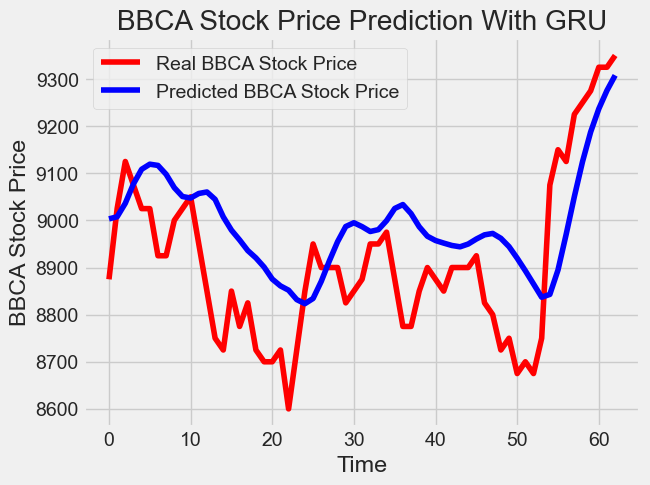

In [580]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"]["2023-01":"2023-10-02"],BBCA["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("BBCA", BBCA_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2978296960.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


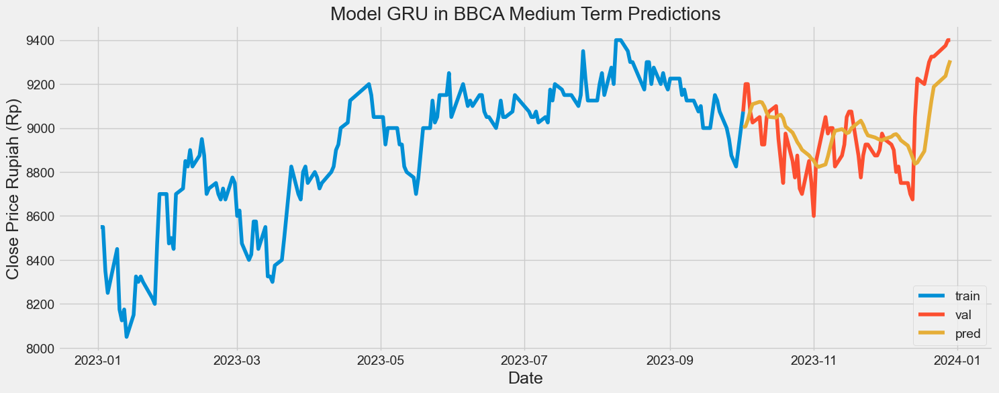

In [581]:
# Visualize the data
# Plot the data
train = BBCA["2023-01":"2023-10-02"]
valid = BBCA["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in BBCA Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [582]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(BBCA_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 147.43319965678188.
The root mean squared error after normalization is 0.196577599542376.


#### RNN Predicitions

## Long Term Predictions
Long term prediction using in this program is prediction in several year to predict next year.
Data use for this predictions is data 2020 - July 2024.
Data train and test is:
1. Data Train
    * Year 2020 - 2022
2. Data Test
    * Year 2023 - July 2024

### ADRO

#### Data Split

In [672]:
ADRO_long_train = ADRO[:"2023"].iloc[:,3:4].values
ADRO_long_test = ADRO["2023":].iloc[:,3:4].values

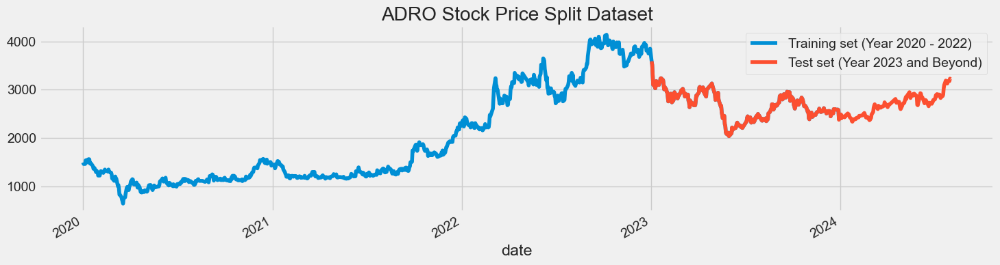

In [673]:
ADRO["close"][:"2023"].plot(figsize=(16,4), legend=True)
ADRO["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('ADRO Stock Price Split Dataset')
plt.show()

In [674]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ADRO_long_train)

In [675]:
len_train = len(ADRO_long_train)
len_test = len(ADRO_long_test)
print(len_train, len_test)

974 372


In [676]:
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

#### LSTM Predictions

In [677]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 2s 79ms/step - loss: 0.0014
Epoch 2/50
29/29 [==============================] - 2s 77ms/step - loss: 0.0014
Epoch 3/50
29/29 [==============================] - 2s 74ms/step - loss: 0.0013
Epoch 4/50
29/29 [==============================] - 2s 83ms/step - loss: 0.0015
Epoch 5/50
29/29 [==============================] - 2s 81ms/step - loss: 0.0013
Epoch 6/50
29/29 [==============================] - 2s 82ms/step - loss: 0.0013
Epoch 7/50
29/29 [==============================] - 2s 79ms/step - loss: 0.0014
Epoch 8/50
29/29 [==============================] - 3s 88ms/step - loss: 0.0014
Epoch 9/50
29/29 [==============================] - 3s 88ms/step - loss: 0.0014
Epoch 10/50
29/29 [==============================] - 2s 83ms/step - loss: 0.0013
Epoch 11/50
29/29 [==============================] - 2s 81ms/step - loss: 0.0014
Epoch 12/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0014
Epoch 13/50
29/29 [==================

12/12 [==============================] - 0s 35ms/step


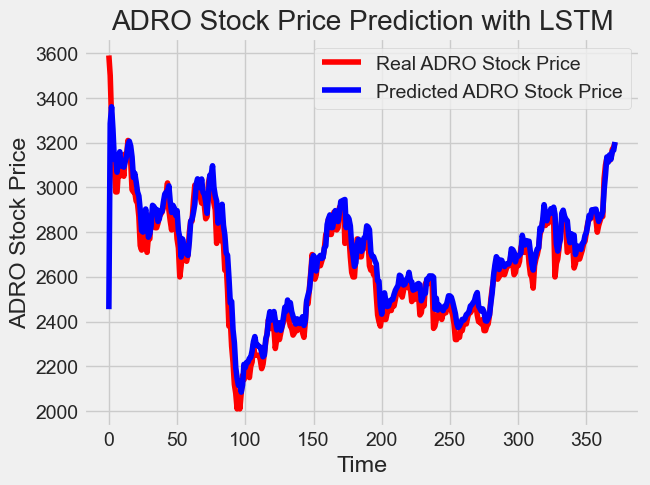

In [681]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"][:"2023"],ADRO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ADRO', ADRO_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2162718566.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


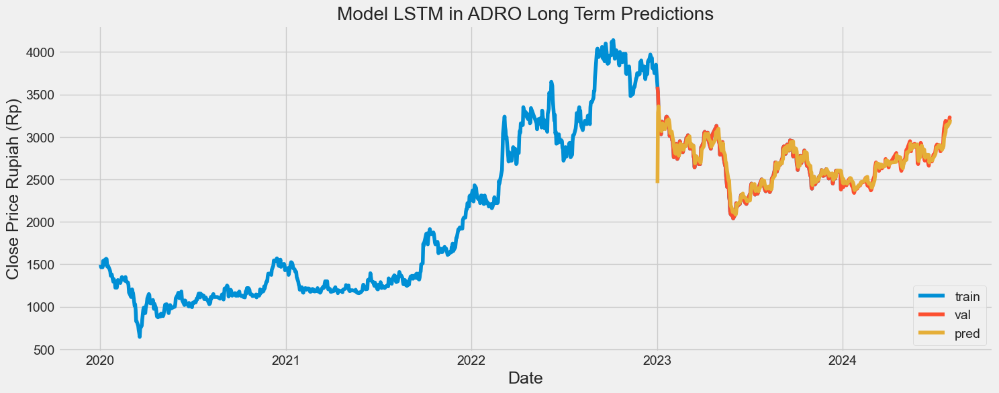

In [683]:
# Visualize the data
# Plot the data
train = ADRO[:"2023"]
valid = ADRO["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ADRO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [684]:
# Evaluating the sequence
rmse = return_rmse(ADRO_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 89.26429289156785.
The root mean squared error after normalization is 0.05649638790605561.


#### GRU Predictions

In [685]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/7 [=======>......................] - ETA: 1s - loss: 0.0029

7/7 [==============================] - 1s 185ms/step - loss: 0.0029
Epoch 2/50
7/7 [==============================] - 1s 160ms/step - loss: 0.0026
Epoch 3/50
7/7 [==============================] - 1s 166ms/step - loss: 0.0028
Epoch 4/50
7/7 [==============================] - 1s 157ms/step - loss: 0.0028
Epoch 5/50
7/7 [==============================] - 1s 159ms/step - loss: 0.0028
Epoch 6/50
7/7 [==============================] - 1s 161ms/step - loss: 0.0028
Epoch 7/50
7/7 [==============================] - 1s 162ms/step - loss: 0.0029
Epoch 8/50
7/7 [==============================] - 1s 165ms/step - loss: 0.0026
Epoch 9/50
7/7 [==============================] - 1s 166ms/step - loss: 0.0023
Epoch 10/50
7/7 [==============================] - 1s 176ms/step - loss: 0.0024
Epoch 11/50
7/7 [==============================] - 1s 175ms/step - loss: 0.0027
Epoch 12/50
7/7 [==============================] - 1s 197ms/step - loss: 0.0026
Epoch 13/50
7/7 [==============================] - 1s 184ms/

12/12 [==============================] - 0s 31ms/step


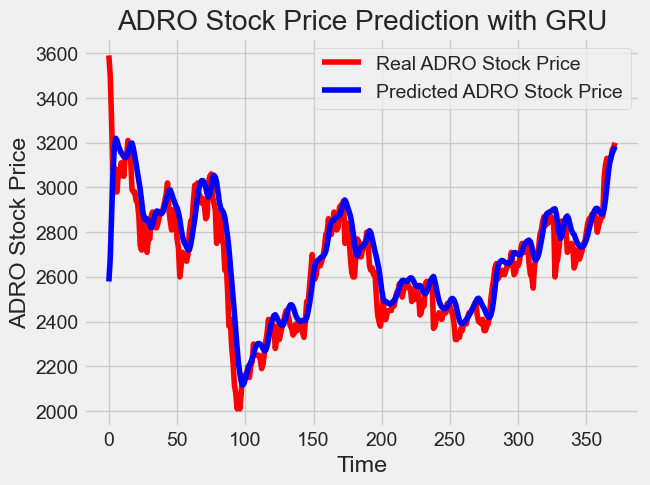

In [686]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"][:"2023"],ADRO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('ADRO', ADRO_long_test,GRU_predicted_stock_price, GRU_title)

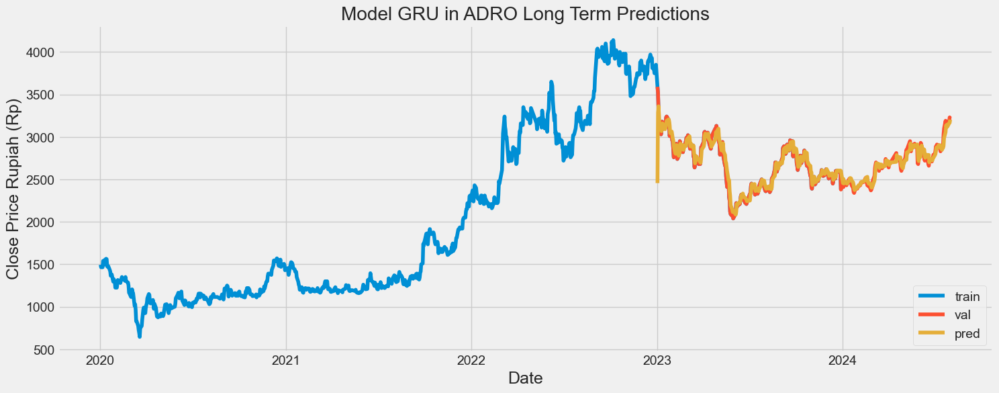

In [687]:
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ADRO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [688]:
# Evaluating the sequence
rmse = return_rmse(ADRO_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 121.03453422301534.
The root mean squared error after normalization is 0.07660413558418694.


#### RNN Predicitions

In [689]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 39ms/step - loss: 0.0018 - accuracy: 0.0022
Epoch 2/50
29/29 [==============================] - 1s 36ms/step - loss: 0.0018 - accuracy: 0.0022
Epoch 3/50
29/29 [==============================] - 1s 38ms/step - loss: 0.0018 - accuracy: 0.0022
Epoch 4/50
29/29 [==============================] - 1s 36ms/step - loss: 0.0019 - accuracy: 0.0022
Epoch 5/50
29/29 [==============================] - 1s 41ms/step - loss: 0.0019 - accuracy: 0.0022
Epoch 6/50
29/29 [==============================] - 1s 40ms/step - loss: 0.0017 - accuracy: 0.0022
Epoch 7/50
29/29 [==============================] - 1s 41ms/step - loss: 0.0017 - accuracy: 0.0022
Epoch 8/50
29/29 [==============================] - 1s 37ms/step - loss: 0.0018 - accuracy: 0.0022
Epoch 9/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0016 - accuracy: 0.0022
Epoch 10/50
29/29 [==============================] - 2s 74ms/step - loss: 0.0017 - accuracy: 0.0022
Epoch 11/

12/12 [==============================] - 0s 15ms/step


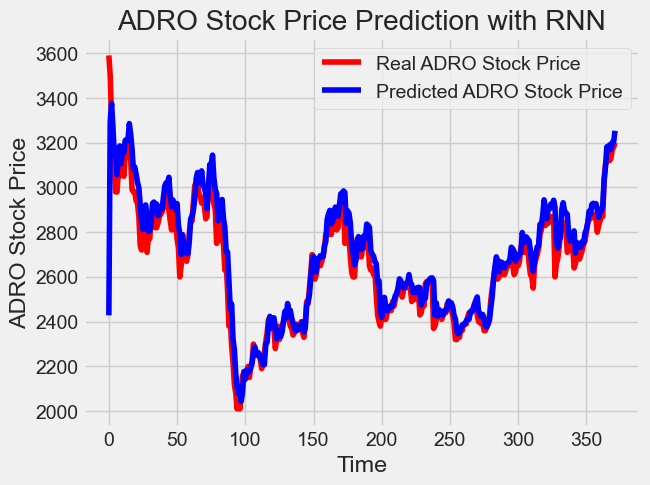

In [690]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"][:"2023"],ADRO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('ADRO', ADRO_long_test,RNN_predicted_stock_price, RNN_title)

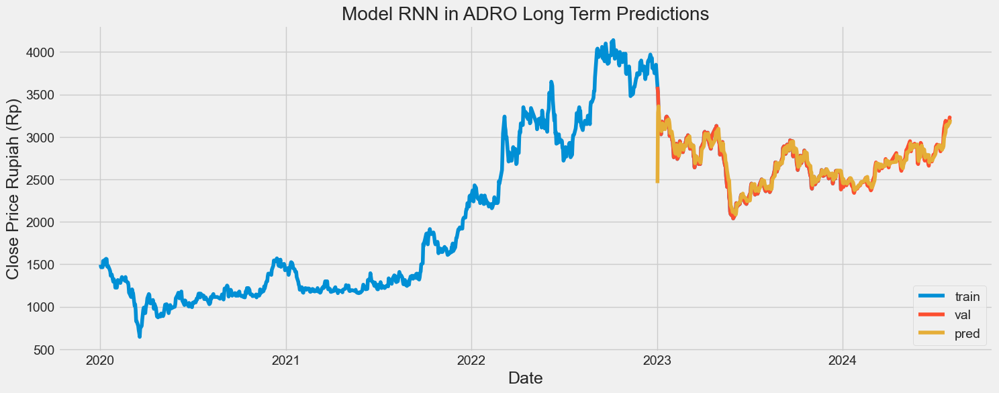

In [691]:
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ADRO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [692]:
# Evaluating the sequence
rmse = return_rmse(ADRO_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 93.65168999224043.
The root mean squared error after normalization is 0.05927322151407623.


### AMMN

#### Data Split

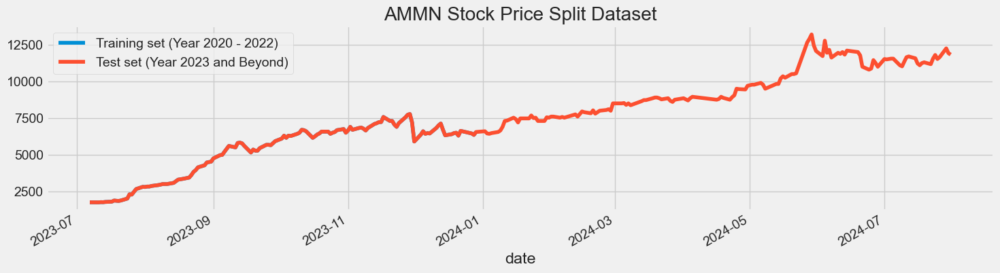

In [876]:
AMMN_long_train = AMMN[:"2023"].iloc[:,3:4].values
AMMN_long_test = AMMN["2023":].iloc[:,3:4].values
AMMN["close"][:"2023"].plot(figsize=(16,4), legend=True)
AMMN["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('AMMN Stock Price Split Dataset')
plt.show()

#### LSTM Predictions

#### GRU Predicitions

#### RNN Predictions

### AMRT

#### Data Split

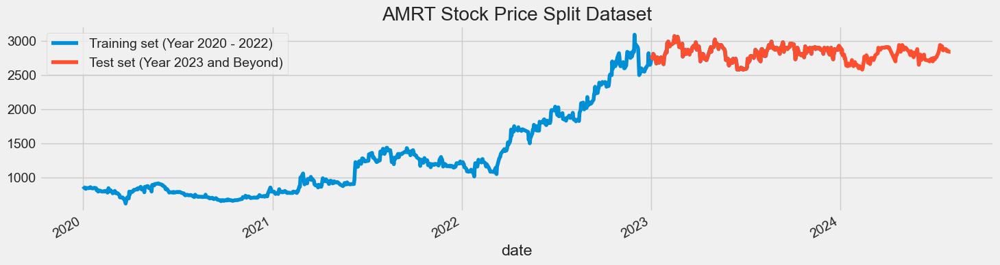

In [877]:
AMRT_long_train = AMRT[:"2023"].iloc[:,3:4].values
AMRT_long_test = AMRT["2023":].iloc[:,3:4].values
AMRT["close"][:"2023"].plot(figsize=(16,4), legend=True)
AMRT["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('AMRT Stock Price Split Dataset')
plt.show()

In [878]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMRT_long_train)
len_train = len(AMRT_long_train)
len_test = len(AMRT_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [879]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 10s 107ms/step - loss: 0.1111
Epoch 2/50
29/29 [==============================] - 2s 82ms/step - loss: 0.0124
Epoch 3/50
29/29 [==============================] - 2s 80ms/step - loss: 0.0095
Epoch 4/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0076
Epoch 5/50
29/29 [==============================] - 3s 98ms/step - loss: 0.0074
Epoch 6/50
29/29 [==============================] - 3s 93ms/step - loss: 0.0069
Epoch 7/50
29/29 [==============================] - 3s 96ms/step - loss: 0.0061
Epoch 8/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0057
Epoch 9/50
29/29 [==============================] - 3s 93ms/step - loss: 0.0066
Epoch 10/50
29/29 [==============================] - 3s 89ms/step - loss: 0.0054
Epoch 11/50
29/29 [==============================] - 3s 93ms/step - loss: 0.0048
Epoch 12/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0050
Epoch 13/50
29/29 [================

12/12 [==============================] - 4s 32ms/step


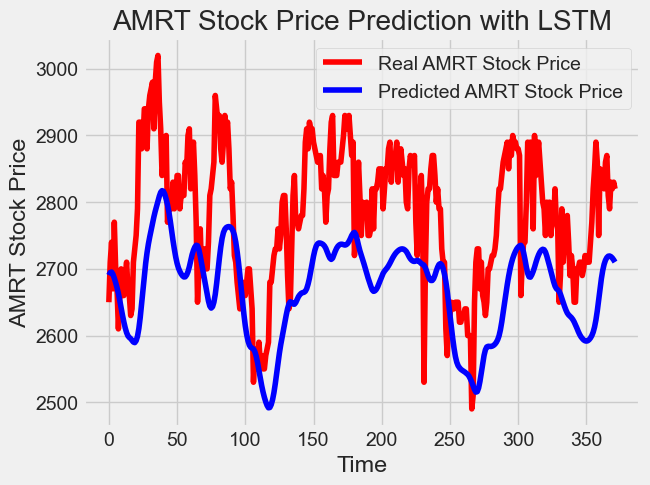

In [880]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"][:"2023"],AMRT["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('AMRT', AMRT_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2398016394.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


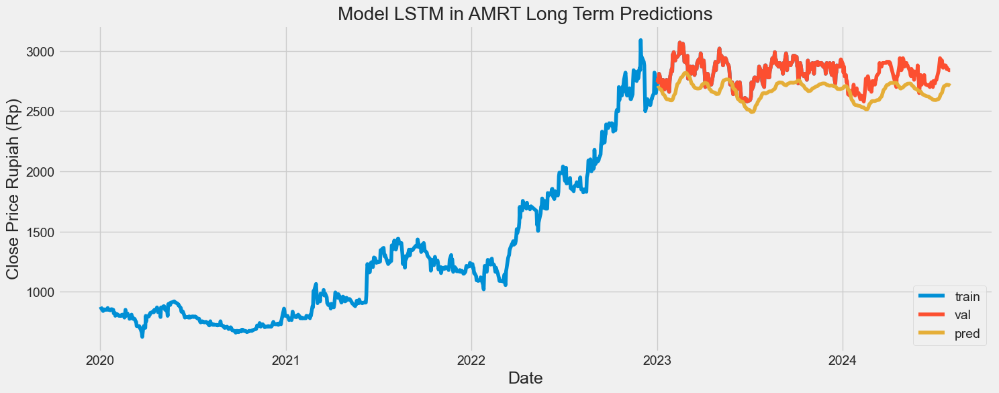

In [881]:
# Visualize the data
# Plot the data
train = AMRT[:"2023"]
valid = AMRT["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMRT Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [882]:
# Evaluating the sequence
rmse = return_rmse(AMRT_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 132.5295823987881.
The root mean squared error after normalization is 0.25005581584677.


#### GRU Predictions

In [902]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 1s 187ms/step - loss: 0.0035
Epoch 2/50
7/7 [==============================] - 1s 195ms/step - loss: 0.0035
Epoch 3/50
7/7 [==============================] - 1s 194ms/step - loss: 0.0035
Epoch 4/50
7/7 [==============================] - 1s 198ms/step - loss: 0.0037
Epoch 5/50
7/7 [==============================] - 2s 211ms/step - loss: 0.0032
Epoch 6/50
7/7 [==============================] - 2s 211ms/step - loss: 0.0034
Epoch 7/50
7/7 [==============================] - 2s 213ms/step - loss: 0.0035
Epoch 8/50
7/7 [==============================] - 2s 226ms/step - loss: 0.0034
Epoch 9/50
7/7 [==============================] - 2s 224ms/step - loss: 0.0035
Epoch 10/50
7/7 [==============================] - 2s 212ms/step - loss: 0.0033
Epoch 11/50
7/7 [==============================] - 1s 211ms/step - loss: 0.0033
Epoch 12/50
7/7 [==============================] - 1s 196ms/step - loss: 0.0032
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 33ms/step


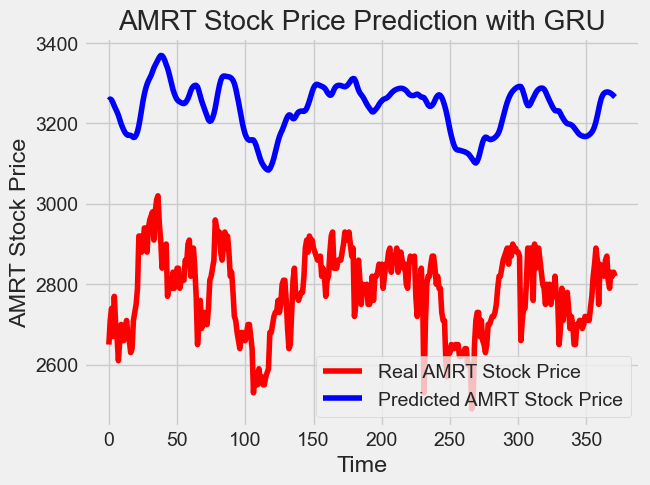

In [903]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"][:"2023"],AMRT["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('AMRT', AMRT_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\785506514.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


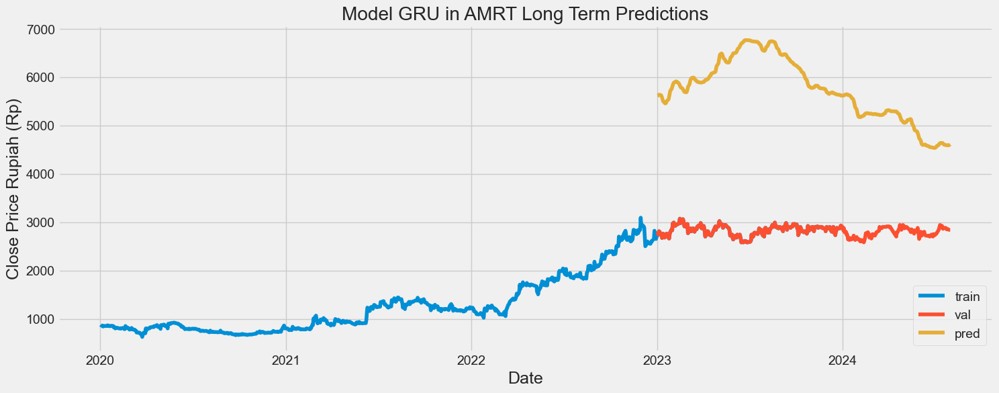

In [901]:
# Visualize the data
# Plot the data
train = AMRT[:"2023"]
valid = AMRT["2023":]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMRT Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [904]:
# Evaluating the sequence
rmse = return_rmse(AMRT_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 460.86638975372836.
The root mean squared error after normalization is 0.5242519876135443.


#### RNN Predictions

In [905]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50


29/29 [==============================] - 2s 55ms/step - loss: 0.0063 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 51ms/step - loss: 0.0053 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 2s 62ms/step - loss: 0.0052 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 1s 51ms/step - loss: 0.0049 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 51ms/step - loss: 0.0057 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0059 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 2s 75ms/step - loss: 0.0048 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 44ms/step - loss: 0.0050 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0047 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0044 - accuracy: 0.0011
Epoch 11/50
29/29 [=

12/12 [==============================] - 0s 16ms/step


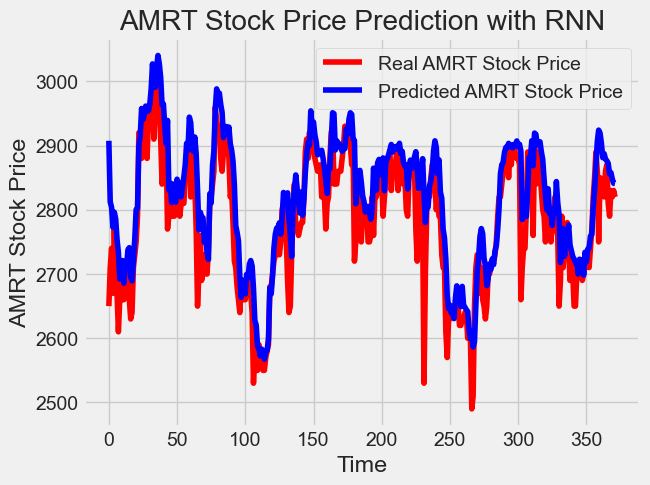

In [906]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"][:"2023"],AMRT["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('AMRT', AMRT_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1992500669.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


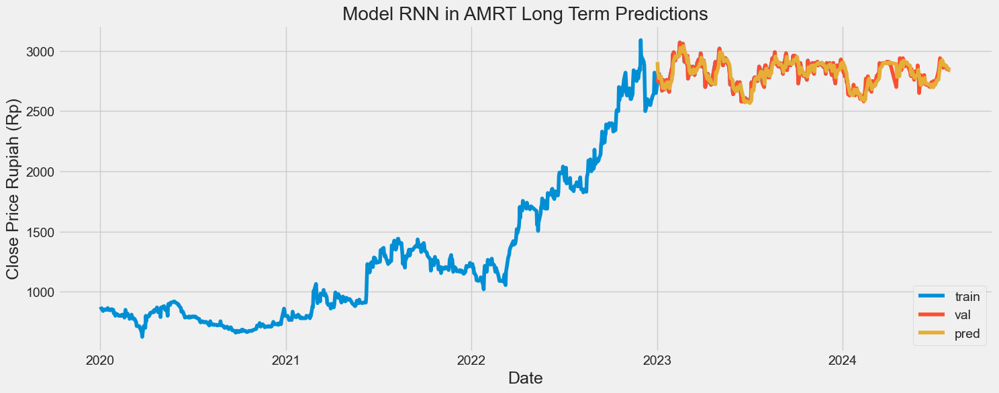

In [907]:
# Visualize the data
# Visualize the data
# Plot the data
train = AMRT[:"2023"]
valid = AMRT["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMRT Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [908]:
# Evaluating the sequence
rmse = return_rmse(AMRT_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 58.252863684627755.
The root mean squared error after normalization is 0.10587115586432518.


### ASII

#### Data Split

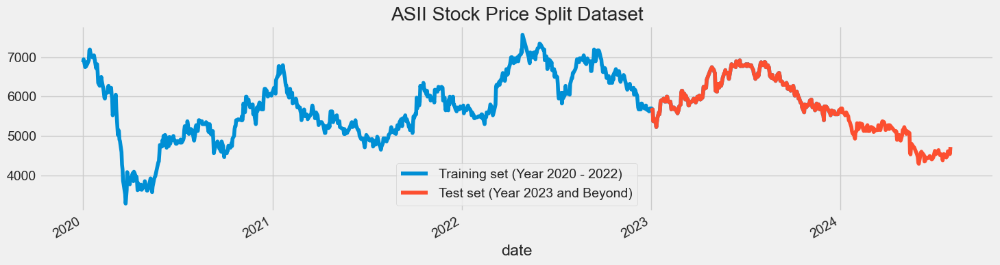

In [909]:
ASII_long_train = ASII[:"2023"].iloc[:,3:4].values
ASII_long_test = ASII["2023":].iloc[:,3:4].values
ASII["close"][:"2023"].plot(figsize=(16,4), legend=True)
ASII["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('ASII Stock Price Split Dataset')
plt.show()

In [910]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ASII_long_train)
len_train = len(ASII_long_train)
len_test = len(ASII_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [911]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0028
Epoch 2/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0025
Epoch 3/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0025
Epoch 4/50
29/29 [==============================] - 4s 125ms/step - loss: 0.0024
Epoch 5/50
29/29 [==============================] - 3s 102ms/step - loss: 0.0024
Epoch 6/50
29/29 [==============================] - 3s 103ms/step - loss: 0.0024
Epoch 7/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0024
Epoch 8/50
29/29 [==============================] - 3s 95ms/step - loss: 0.0026
Epoch 9/50
29/29 [==============================] - 3s 102ms/step - loss: 0.0022
Epoch 10/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0023
Epoch 11/50
29/29 [==============================] - 3s 107ms/step - loss: 0.0025
Epoch 12/50
29/29 [==============================] - 3s 98ms/step - loss: 0.0024
Epoch 13/50
29/29 [==========

12/12 [==============================] - 1s 40ms/step


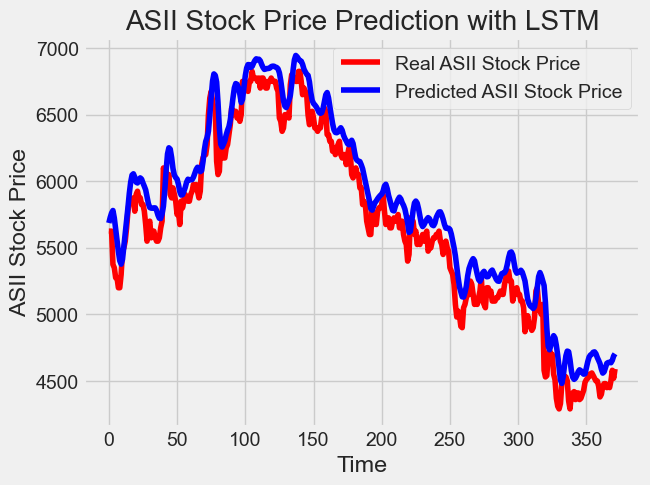

In [912]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"][:"2023"],ASII["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ASII', ASII_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\4118180660.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


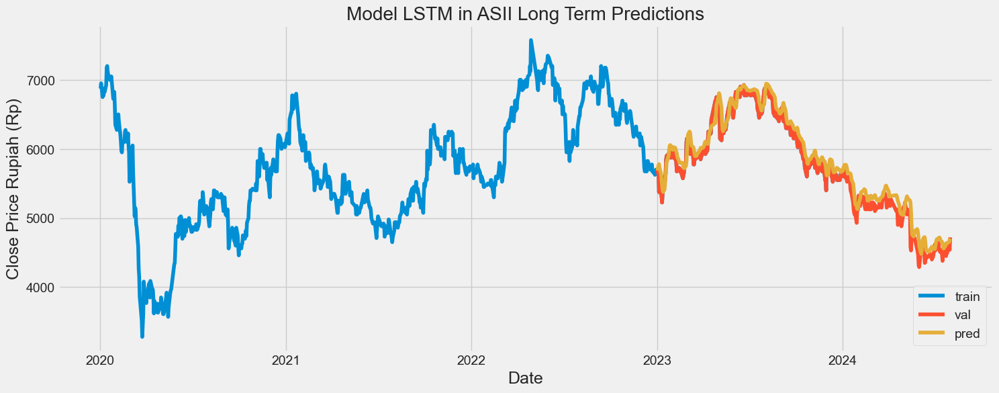

In [913]:
# Visualize the data
# Plot the data
train = ASII[:"2023"]
valid = ASII["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ASII Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [914]:
# Evaluating the sequence
rmse = return_rmse(ASII_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 189.81008065661746.
The root mean squared error after normalization is 0.07149907726006087.


#### GRU Predictions

In [915]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 2s 236ms/step - loss: 0.0032
Epoch 2/50
7/7 [==============================] - 2s 215ms/step - loss: 0.0033
Epoch 3/50
7/7 [==============================] - 2s 217ms/step - loss: 0.0035
Epoch 4/50
7/7 [==============================] - 2s 217ms/step - loss: 0.0031
Epoch 5/50
7/7 [==============================] - 1s 205ms/step - loss: 0.0032
Epoch 6/50
7/7 [==============================] - 2s 318ms/step - loss: 0.0034
Epoch 7/50
7/7 [==============================] - 1s 197ms/step - loss: 0.0032
Epoch 8/50
7/7 [==============================] - 1s 207ms/step - loss: 0.0032
Epoch 9/50
7/7 [==============================] - 1s 209ms/step - loss: 0.0034
Epoch 10/50
7/7 [==============================] - 1s 208ms/step - loss: 0.0030
Epoch 11/50
7/7 [==============================] - 1s 187ms/step - loss: 0.0031
Epoch 12/50
7/7 [==============================] - 1s 196ms/step - loss: 0.0031
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 30ms/step


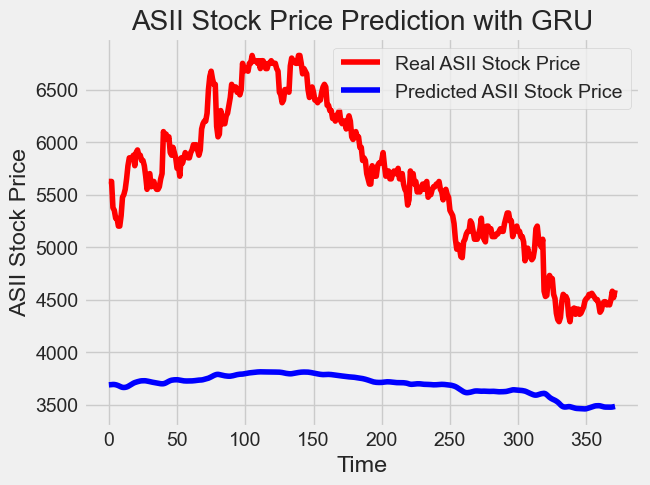

In [947]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"][:"2023"],ASII["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('ASII', ASII_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3232990028.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


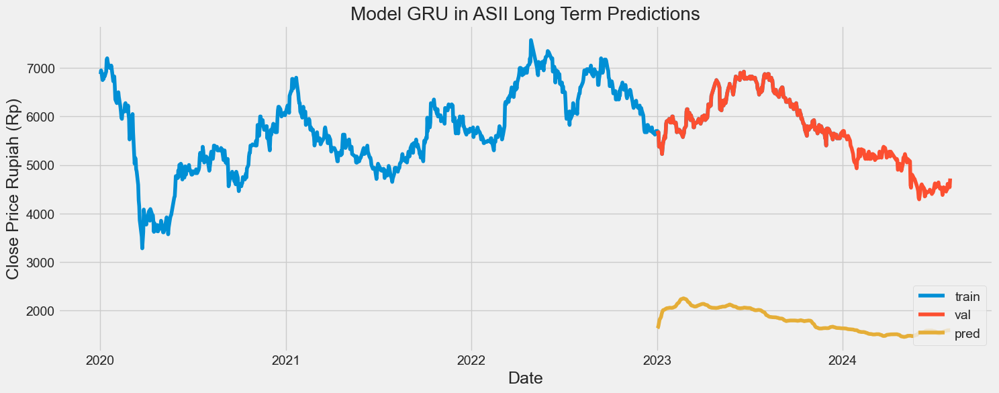

In [946]:
# Visualize the data
# Visualize the data
# Plot the data
train = ASII[:"2023"]
valid = ASII["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in ASII Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [918]:
# Evaluating the sequence
rmse = return_rmse(ASII_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 175.71290882867098.
The root mean squared error after normalization is 0.06931475693438696.


#### RNN Predictions

In [919]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0025 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0024 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 2s 56ms/step - loss: 0.0024 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0028 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 2s 54ms/step - loss: 0.0024 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 2s 57ms/step - loss: 0.0024 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 2s 55ms/step - loss: 0.0025 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0025 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0024 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 2s 55ms/step - loss: 0.0025 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 14ms/step


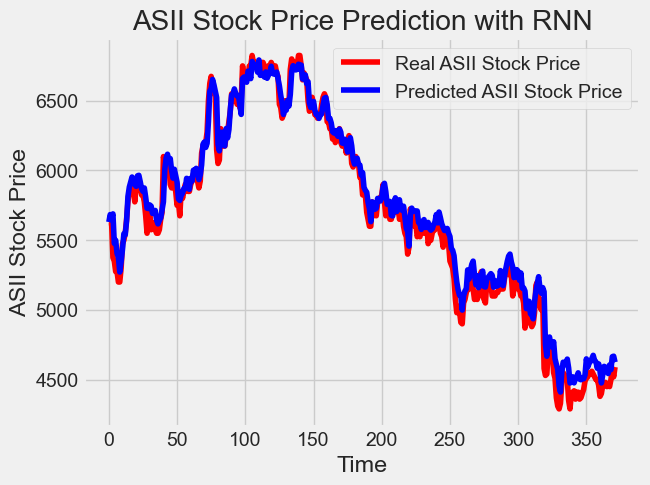

In [920]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"][:"2023"],ASII["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('ASII', ASII_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2411556250.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


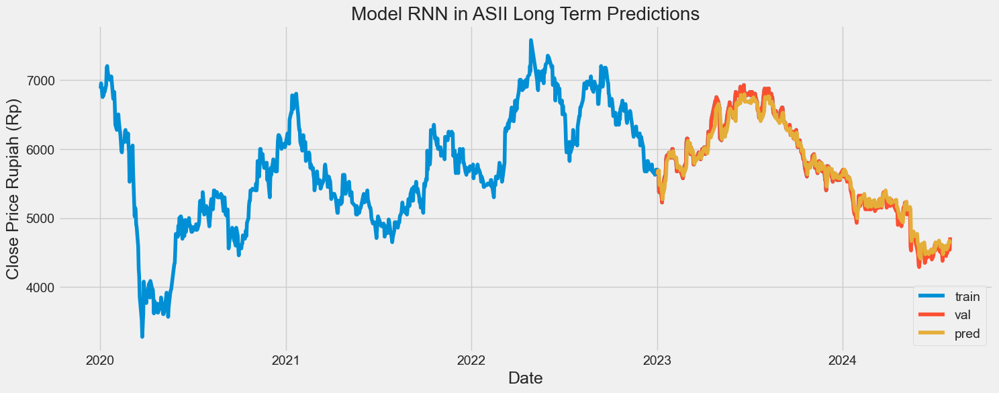

In [921]:
# Visualize the data
# Visualize the data
# Plot the data
train = ASII[:"2023"]
valid = ASII["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in ASII Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [922]:
# Evaluating the sequence
rmse = return_rmse(ASII_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 100.11676987371774.
The root mean squared error after normalization is 0.039493794821979386.


### GOTO

#### Data Split

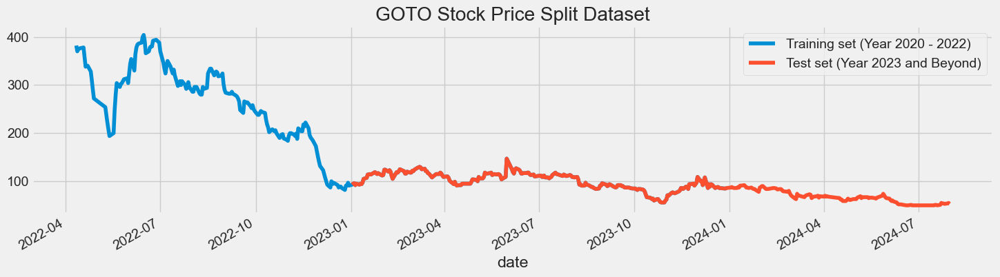

In [923]:
GOTO_long_train = GOTO[:"2023"].iloc[:,3:4].values
GOTO_long_test = GOTO["2023":].iloc[:,3:4].values
GOTO["close"][:"2023"].plot(figsize=(16,4), legend=True)
GOTO["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('GOTO Stock Price Split Dataset')
plt.show()

In [924]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(GOTO_long_train)
len_train = len(GOTO_long_train)
len_test = len(GOTO_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

418 372


#### LSTM Predictions

In [925]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
12/12 [==============================] - 1s 94ms/step - loss: 0.0034
Epoch 2/50
12/12 [==============================] - 1s 92ms/step - loss: 0.0024
Epoch 3/50
12/12 [==============================] - 1s 90ms/step - loss: 0.0024
Epoch 4/50
12/12 [==============================] - 1s 93ms/step - loss: 0.0026
Epoch 5/50
12/12 [==============================] - 1s 94ms/step - loss: 0.0033
Epoch 6/50
12/12 [==============================] - 1s 92ms/step - loss: 0.0027
Epoch 7/50
12/12 [==============================] - 1s 96ms/step - loss: 0.0021
Epoch 8/50
12/12 [==============================] - 1s 95ms/step - loss: 0.0022
Epoch 9/50
12/12 [==============================] - 1s 89ms/step - loss: 0.0028
Epoch 10/50
12/12 [==============================] - 1s 88ms/step - loss: 0.0018
Epoch 11/50
12/12 [==============================] - 1s 86ms/step - loss: 0.0023
Epoch 12/50
12/12 [==============================] - 1s 86ms/step - loss: 0.0018
Epoch 13/50
12/12 [==================

12/12 [==============================] - 0s 32ms/step


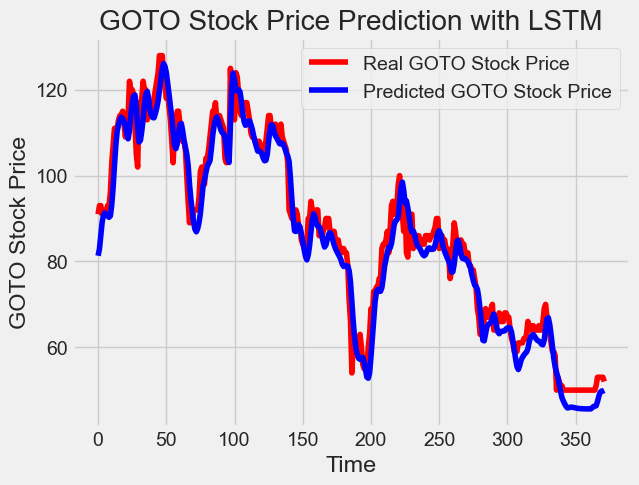

In [926]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"][:"2023"],GOTO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('GOTO', GOTO_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1677187012.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


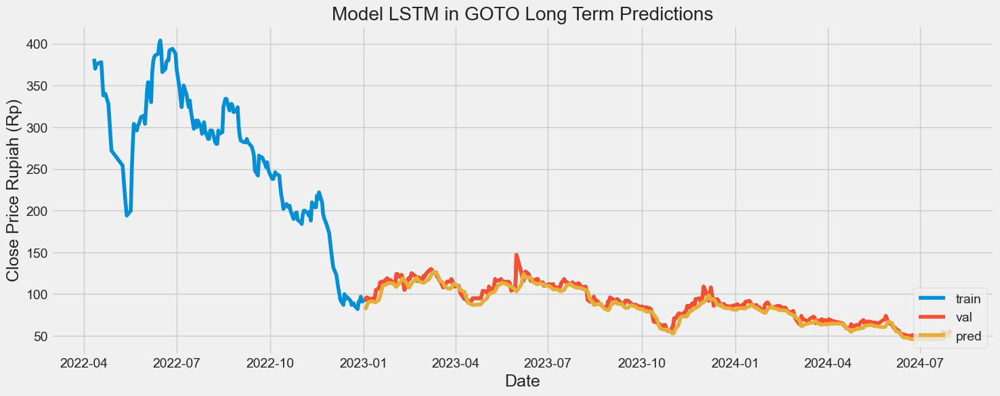

In [927]:
# Visualize the data
# Plot the data
train = GOTO[:"2023"]
valid = GOTO["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in GOTO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [928]:
# Evaluating the sequence
rmse = return_rmse(GOTO_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 4.496425875099356.
The root mean squared error after normalization is 0.05458222000535792.


#### GRU Predictions


In [929]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
3/3 [==============================] - 1s 182ms/step - loss: 0.0051
Epoch 2/50
3/3 [==============================] - 1s 174ms/step - loss: 0.0042
Epoch 3/50
3/3 [==============================] - 1s 168ms/step - loss: 0.0046
Epoch 4/50
3/3 [==============================] - 1s 160ms/step - loss: 0.0038
Epoch 5/50
3/3 [==============================] - 1s 169ms/step - loss: 0.0038
Epoch 6/50
3/3 [==============================] - 1s 166ms/step - loss: 0.0042
Epoch 7/50
3/3 [==============================] - 1s 164ms/step - loss: 0.0037
Epoch 8/50
3/3 [==============================] - 1s 173ms/step - loss: 0.0037
Epoch 9/50
3/3 [==============================] - 1s 182ms/step - loss: 0.0038
Epoch 10/50
3/3 [==============================] - 1s 191ms/step - loss: 0.0038
Epoch 11/50
3/3 [==============================] - 1s 192ms/step - loss: 0.0038
Epoch 12/50
3/3 [==============================] - 1s 323ms/step - loss: 0.0033
Epoch 13/50
3/3 [==============================] 

12/12 [==============================] - 0s 31ms/step


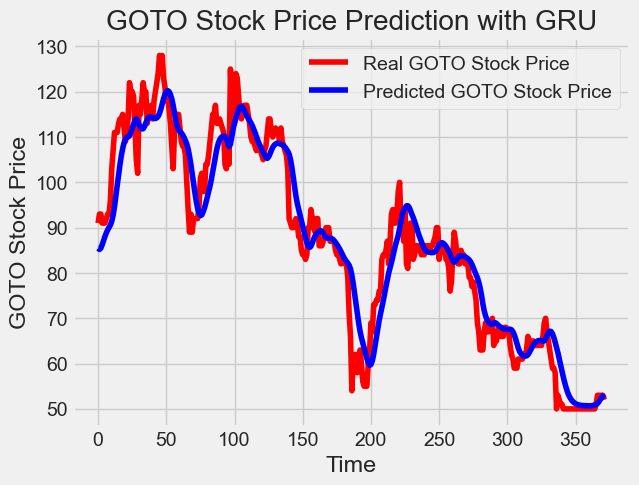

In [930]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"][:"2023"],GOTO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('GOTO', GOTO_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2023922229.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


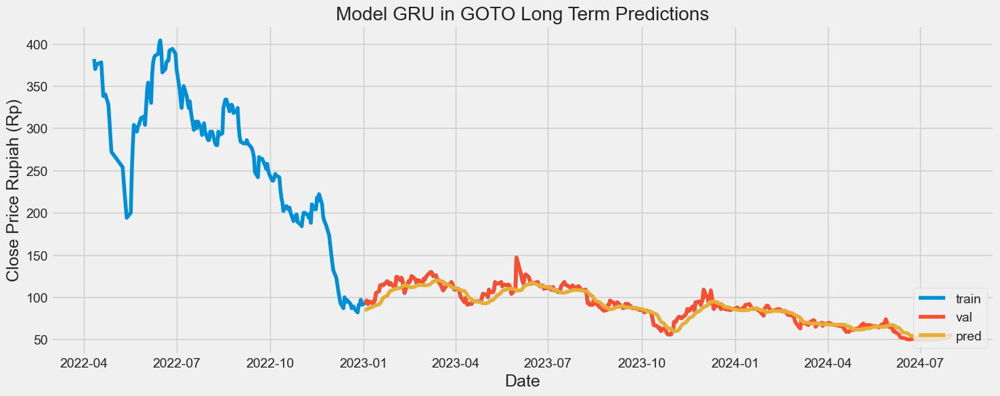

In [931]:
# Visualize the data
# Plot the data
train = GOTO[:"2023"]
valid = GOTO["2023":]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in GOTO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [932]:
# Evaluating the sequence
rmse = return_rmse(GOTO_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 6.164684977691858.
The root mean squared error after normalization is 0.07903442279092125.


#### RNN Predictions

In [933]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
12/12 [==============================] - 1s 55ms/step - loss: 0.0018 - accuracy: 0.0028
Epoch 2/50
12/12 [==============================] - 1s 68ms/step - loss: 0.0021 - accuracy: 0.0028
Epoch 3/50
12/12 [==============================] - 1s 59ms/step - loss: 0.0024 - accuracy: 0.0028
Epoch 4/50
12/12 [==============================] - 1s 64ms/step - loss: 0.0020 - accuracy: 0.0028
Epoch 5/50
12/12 [==============================] - 1s 60ms/step - loss: 0.0015 - accuracy: 0.0028
Epoch 6/50
12/12 [==============================] - 1s 65ms/step - loss: 0.0015 - accuracy: 0.0028
Epoch 7/50
12/12 [==============================] - 1s 57ms/step - loss: 0.0015 - accuracy: 0.0028
Epoch 8/50
12/12 [==============================] - 1s 57ms/step - loss: 0.0018 - accuracy: 0.0028
Epoch 9/50
12/12 [==============================] - 1s 60ms/step - loss: 0.0015 - accuracy: 0.0028
Epoch 10/50
12/12 [==============================] - 1s 60ms/step - loss: 0.0014 - accuracy: 0.0028
Epoch 11/

12/12 [==============================] - 0s 16ms/step


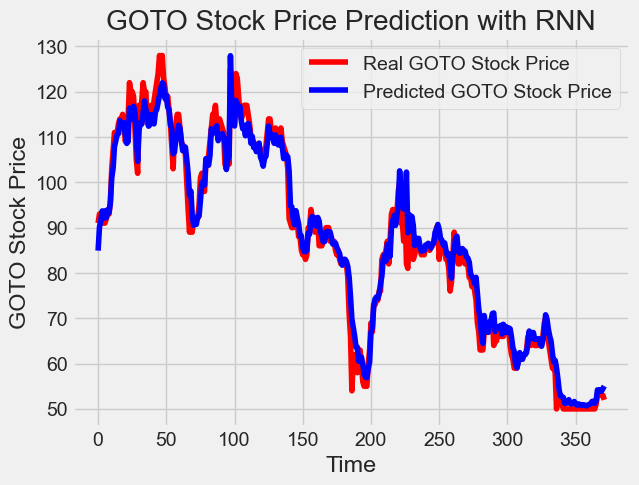

In [934]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"][:"2023"],GOTO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('GOTO', GOTO_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\223507426.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


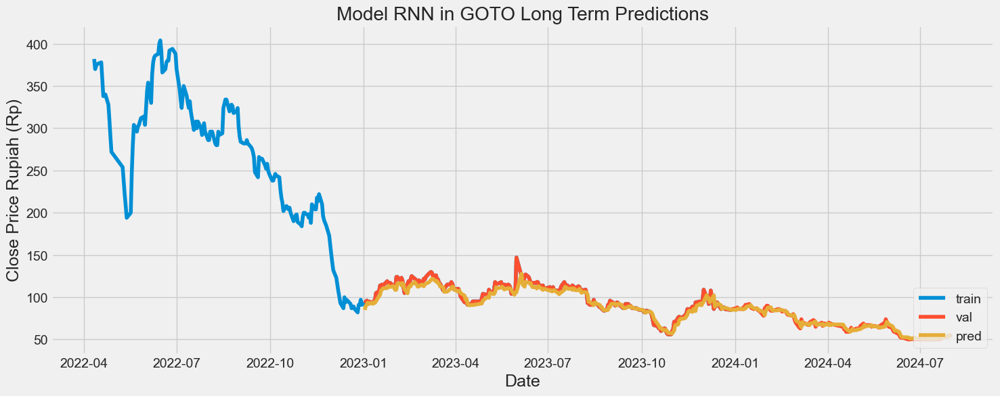

In [935]:
# Visualize the data
# Visualize the data
# Plot the data
train = GOTO[:"2023"]
valid = GOTO["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in GOTO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [936]:
# Evaluating the sequence
rmse = return_rmse(GOTO_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 3.2095846407650277.
The root mean squared error after normalization is 0.041148521035449075.


### KLBF

#### Data Split

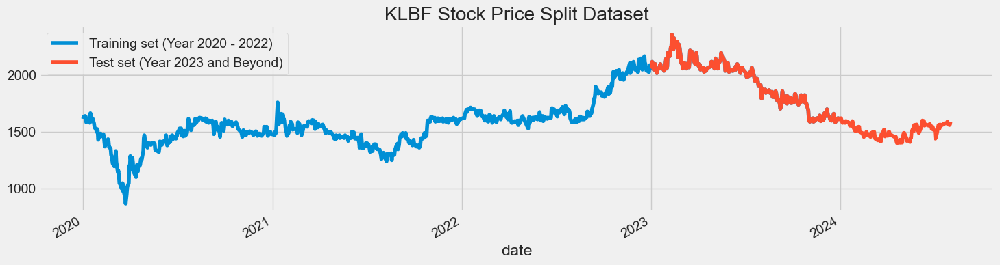

In [937]:
KLBF_long_train = KLBF[:"2023"].iloc[:,3:4].values
KLBF_long_test = KLBF["2023":].iloc[:,3:4].values
KLBF["close"][:"2023"].plot(figsize=(16,4), legend=True)
KLBF["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('KLBF Stock Price Split Dataset')
plt.show()

In [938]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(KLBF_long_train)
len_train = len(KLBF_long_train)
len_test = len(KLBF_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [939]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 87ms/step - loss: 0.0016
Epoch 2/50
29/29 [==============================] - 3s 112ms/step - loss: 0.0015
Epoch 3/50
29/29 [==============================] - 3s 87ms/step - loss: 0.0014
Epoch 4/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0014
Epoch 5/50
29/29 [==============================] - 3s 87ms/step - loss: 0.0015
Epoch 6/50
29/29 [==============================] - 3s 102ms/step - loss: 0.0014
Epoch 7/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0013
Epoch 8/50
29/29 [==============================] - 3s 99ms/step - loss: 0.0014
Epoch 9/50
29/29 [==============================] - 3s 94ms/step - loss: 0.0013
Epoch 10/50
29/29 [==============================] - 3s 98ms/step - loss: 0.0012
Epoch 11/50
29/29 [==============================] - 3s 98ms/step - loss: 0.0013
Epoch 12/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0013
Epoch 13/50
29/29 [===============

12/12 [==============================] - 0s 33ms/step


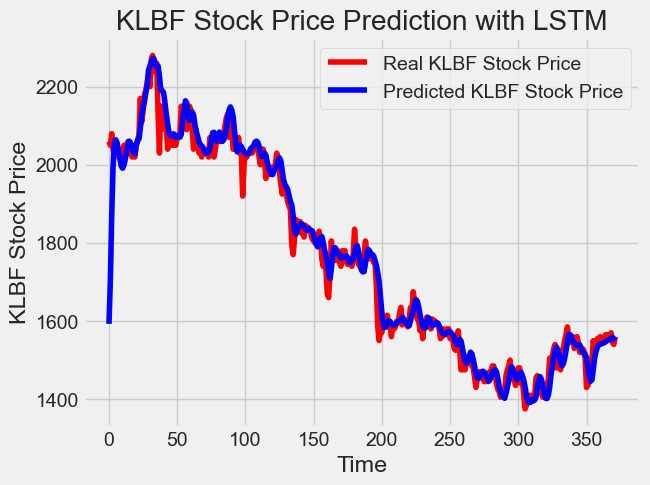

In [940]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"][:"2023"],KLBF["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('KLBF', KLBF_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1644974751.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


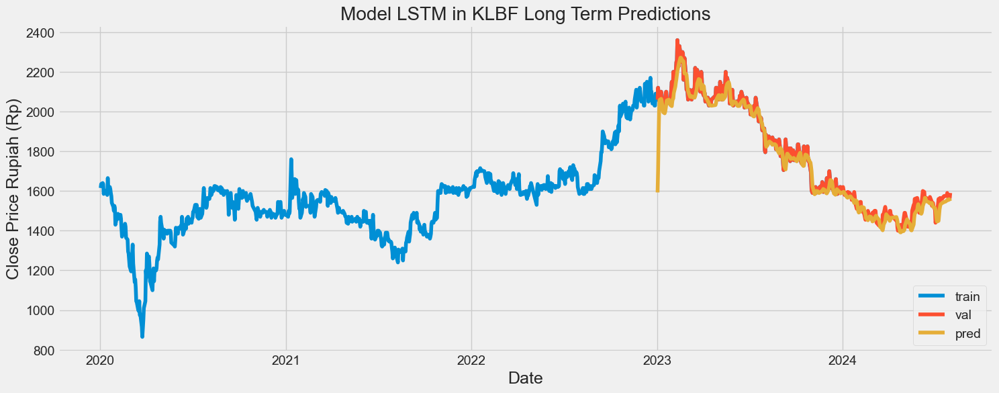

In [941]:
# Visualize the data
# Plot the data
train = KLBF[:"2023"]
valid = KLBF["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in KLBF Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [942]:
# Evaluating the sequence
rmse = return_rmse(KLBF_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 46.540403021389956.
The root mean squared error after normalization is 0.05142585969214361.


#### GRU Predictions

In [943]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 1s 193ms/step - loss: 0.0023
Epoch 2/50
7/7 [==============================] - 1s 194ms/step - loss: 0.0022
Epoch 3/50
7/7 [==============================] - 1s 183ms/step - loss: 0.0019
Epoch 4/50
7/7 [==============================] - 1s 190ms/step - loss: 0.0018
Epoch 5/50
7/7 [==============================] - 2s 236ms/step - loss: 0.0020
Epoch 6/50
7/7 [==============================] - 2s 225ms/step - loss: 0.0018
Epoch 7/50
7/7 [==============================] - 1s 206ms/step - loss: 0.0018
Epoch 8/50
7/7 [==============================] - 2s 237ms/step - loss: 0.0017
Epoch 9/50
7/7 [==============================] - 2s 226ms/step - loss: 0.0018
Epoch 10/50
7/7 [==============================] - 2s 233ms/step - loss: 0.0016
Epoch 11/50
7/7 [==============================] - 2s 230ms/step - loss: 0.0016
Epoch 12/50
7/7 [==============================] - 2s 234ms/step - loss: 0.0018
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 25ms/step


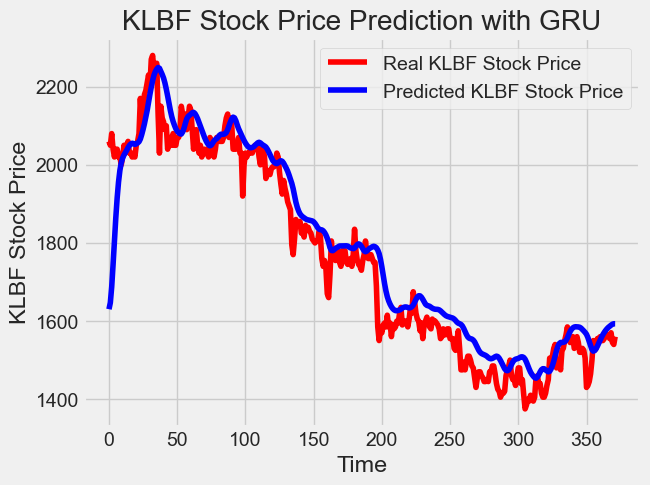

In [952]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"][:"2023"],KLBF["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('KLBF', KLBF_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\4045285853.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


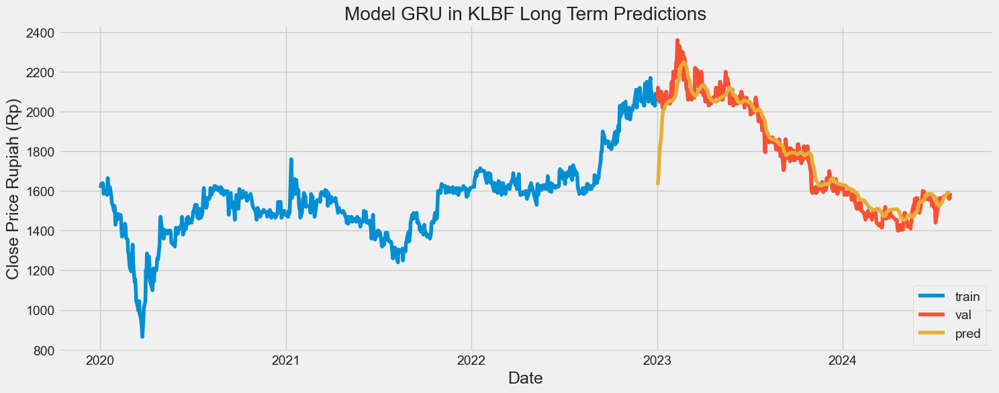

In [953]:
# Visualize the data
# Visualize the data
# Plot the data
train = KLBF[:"2023"]
valid = KLBF["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in KLBF Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [969]:
# Evaluating the sequence
rmse = return_rmse(KLBF_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 375.9342764405023.
The root mean squared error after normalization is 0.390325974388009.


#### RNN Predictions

In [954]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0020 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 50ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 48ms/step - loss: 0.0011 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 14ms/step


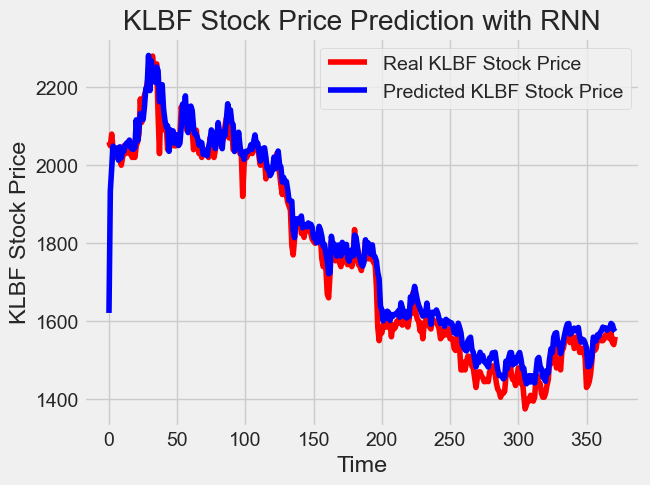

In [955]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"][:"2023"],KLBF["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('KLBF', KLBF_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\449212558.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


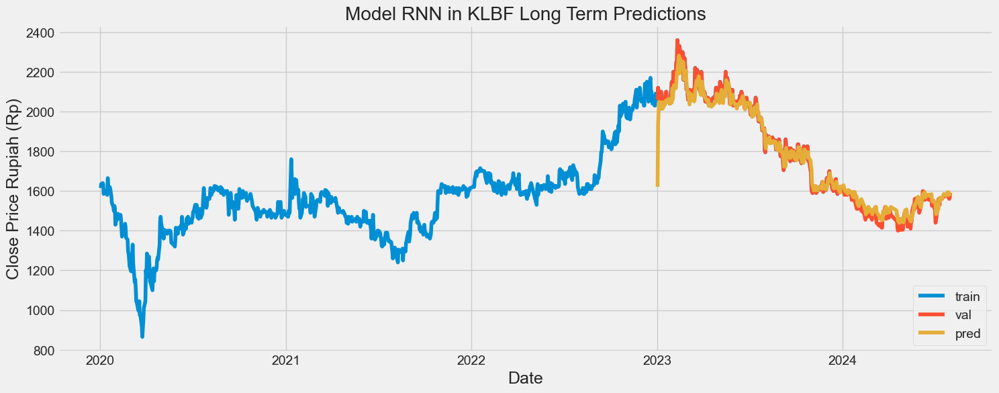

In [956]:
# Visualize the data
# Visualize the data
# Plot the data
train = KLBF[:"2023"]
valid = KLBF["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in KLBF Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [957]:
# Evaluating the sequence
rmse = return_rmse(KLBF_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 44.07246161987128.
The root mean squared error after normalization is 0.04861042782075422.


### MAPI

#### Data Split

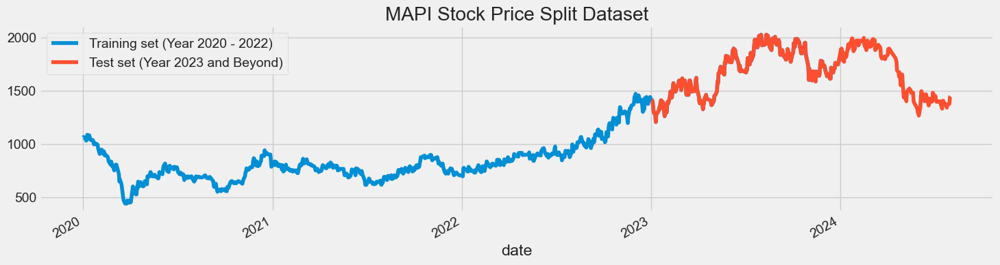

In [958]:
MAPI_long_train = MAPI[:"2023"].iloc[:,3:4].values
MAPI_long_test = MAPI["2023":].iloc[:,3:4].values
MAPI["close"][:"2023"].plot(figsize=(16,4), legend=True)
MAPI["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('MAPI Stock Price Split Dataset')
plt.show()

In [960]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(MAPI_long_train)
len_train = len(MAPI_long_train)
len_test = len(MAPI_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [961]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 94ms/step - loss: 0.0016
Epoch 2/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0016
Epoch 3/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0016
Epoch 4/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0016
Epoch 5/50
29/29 [==============================] - 3s 101ms/step - loss: 0.0014
Epoch 6/50
29/29 [==============================] - 3s 108ms/step - loss: 0.0015
Epoch 7/50
29/29 [==============================] - 3s 104ms/step - loss: 0.0014
Epoch 8/50
29/29 [==============================] - 3s 106ms/step - loss: 0.0016
Epoch 9/50
29/29 [==============================] - 3s 104ms/step - loss: 0.0015
Epoch 10/50
29/29 [==============================] - 3s 105ms/step - loss: 0.0014
Epoch 11/50
29/29 [==============================] - 3s 103ms/step - loss: 0.0014
Epoch 12/50
29/29 [==============================] - 3s 98ms/step - loss: 0.0014
Epoch 13/50
29/29 [=========

12/12 [==============================] - 1s 39ms/step


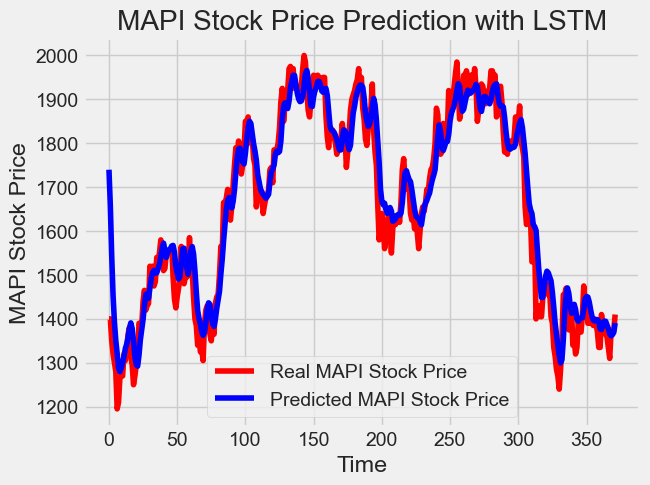

In [962]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"][:"2023"],MAPI["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('MAPI', MAPI_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\843151874.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


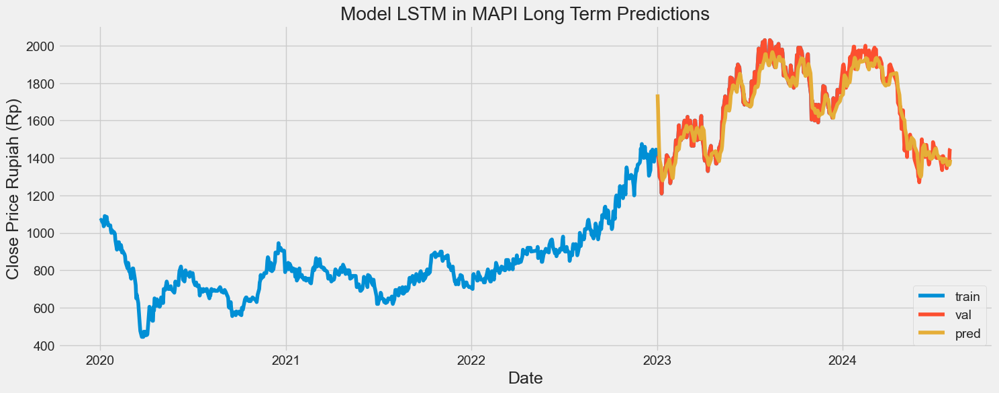

In [963]:
# Visualize the data
# Plot the data
train = MAPI[:"2023"]
valid = MAPI["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in MAPI Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [964]:
# Evaluating the sequence
rmse = return_rmse(MAPI_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 56.0755665018521.
The root mean squared error after normalization is 0.06965908882217653.


#### GRU Predictions

In [965]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 2s 343ms/step - loss: 0.0028
Epoch 2/50
7/7 [==============================] - 1s 201ms/step - loss: 0.0028
Epoch 3/50
7/7 [==============================] - 2s 225ms/step - loss: 0.0026
Epoch 4/50
7/7 [==============================] - 2s 214ms/step - loss: 0.0026
Epoch 5/50
7/7 [==============================] - 2s 220ms/step - loss: 0.0027
Epoch 6/50
7/7 [==============================] - 2s 249ms/step - loss: 0.0024
Epoch 7/50
7/7 [==============================] - 2s 230ms/step - loss: 0.0025
Epoch 8/50
7/7 [==============================] - 2s 242ms/step - loss: 0.0023
Epoch 9/50
7/7 [==============================] - 2s 229ms/step - loss: 0.0024
Epoch 10/50
7/7 [==============================] - 2s 235ms/step - loss: 0.0024
Epoch 11/50
7/7 [==============================] - 1s 200ms/step - loss: 0.0023
Epoch 12/50
7/7 [==============================] - 1s 183ms/step - loss: 0.0023
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 34ms/step


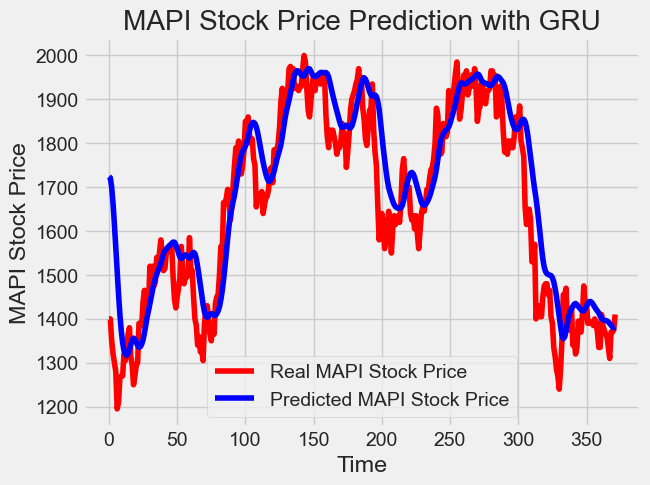

In [966]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"][:"2023"],MAPI["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('MAPI', MAPI_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3299424182.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


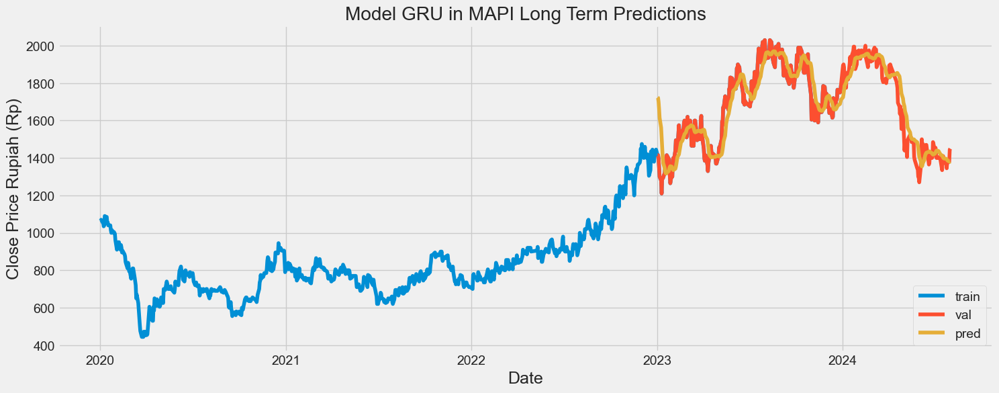

In [967]:
# Visualize the data
# Visualize the data
# Plot the data
train = MAPI[:"2023"]
valid = MAPI["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in MAPI Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [970]:
# Evaluating the sequence
rmse = return_rmse(MAPI_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 93.80769496962222.
The root mean squared error after normalization is 0.11653129809890958.


#### RNN Predictions

In [971]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 1s 40ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 1s 44ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 41ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 14ms/step


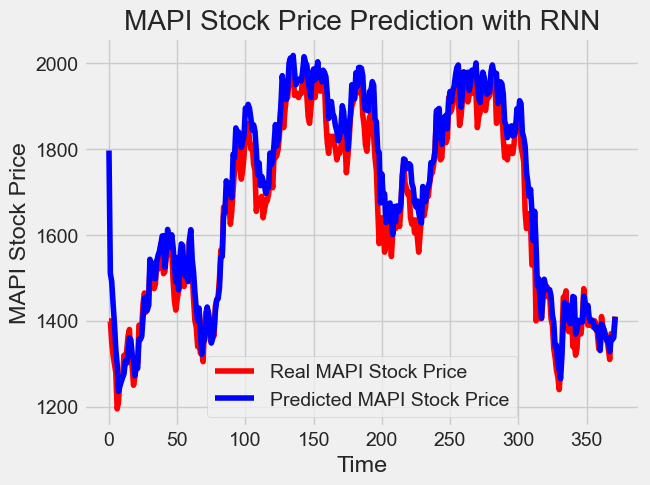

In [972]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"][:"2023"],MAPI["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('MAPI', MAPI_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3221763024.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


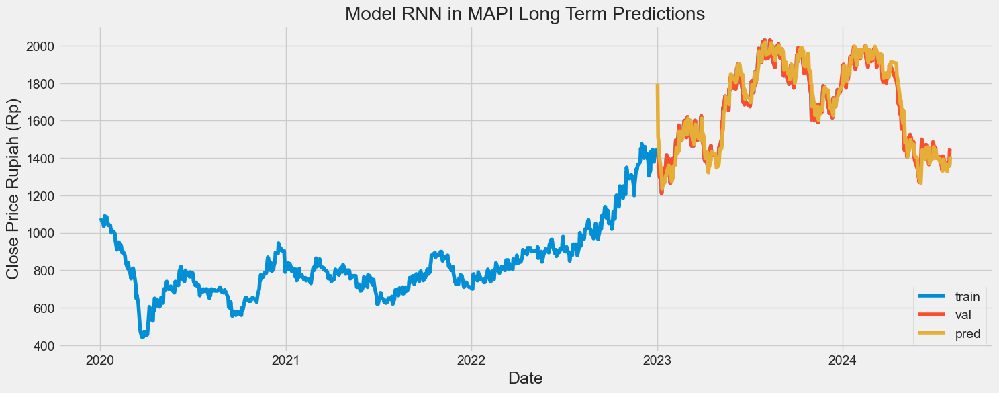

In [973]:
# Visualize the data
# Visualize the data
# Plot the data
train = MAPI[:"2023"]
valid = MAPI["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in MAPI Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [974]:
# Evaluating the sequence
rmse = return_rmse(MAPI_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 58.07344287582983.
The root mean squared error after normalization is 0.07055684538399389.


### TLKM

#### Data Split

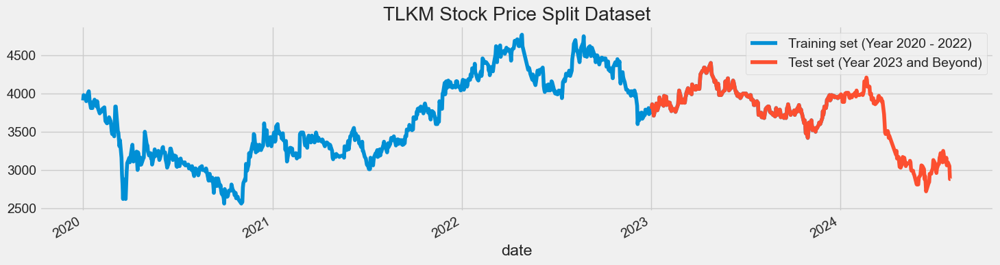

In [975]:
TLKM_long_train = TLKM[:"2023"].iloc[:,3:4].values
TLKM_long_test = TLKM["2023":].iloc[:,3:4].values
TLKM["close"][:"2023"].plot(figsize=(16,4), legend=True)
TLKM["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('TLKM Stock Price Split Dataset')
plt.show()

In [976]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(TLKM_long_train)
len_train = len(TLKM_long_train)
len_test = len(TLKM_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [977]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 88ms/step - loss: 0.0021
Epoch 2/50
29/29 [==============================] - 3s 95ms/step - loss: 0.0019
Epoch 3/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0017
Epoch 4/50
29/29 [==============================] - 3s 96ms/step - loss: 0.0019
Epoch 5/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0020
Epoch 6/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0017
Epoch 7/50
29/29 [==============================] - 3s 95ms/step - loss: 0.0019
Epoch 8/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0018
Epoch 9/50
29/29 [==============================] - 3s 99ms/step - loss: 0.0018
Epoch 10/50
29/29 [==============================] - 3s 102ms/step - loss: 0.0017
Epoch 11/50
29/29 [==============================] - 3s 101ms/step - loss: 0.0016
Epoch 12/50
29/29 [==============================] - 3s 106ms/step - loss: 0.0017
Epoch 13/50
29/29 [==============

12/12 [==============================] - 0s 30ms/step


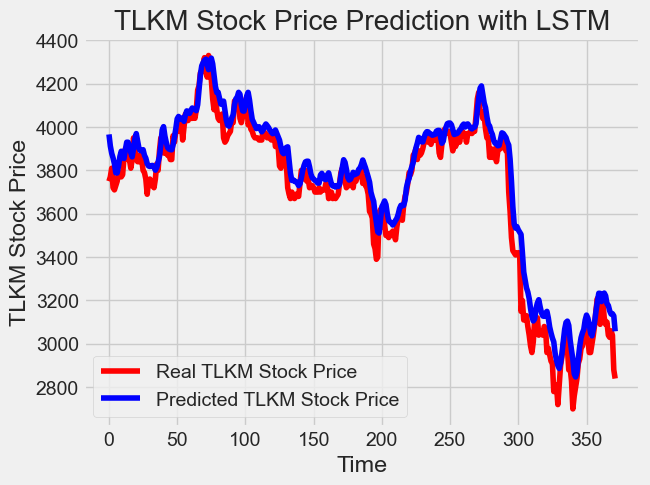

In [978]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"][:"2023"],TLKM["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('TLKM', TLKM_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\879148995.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


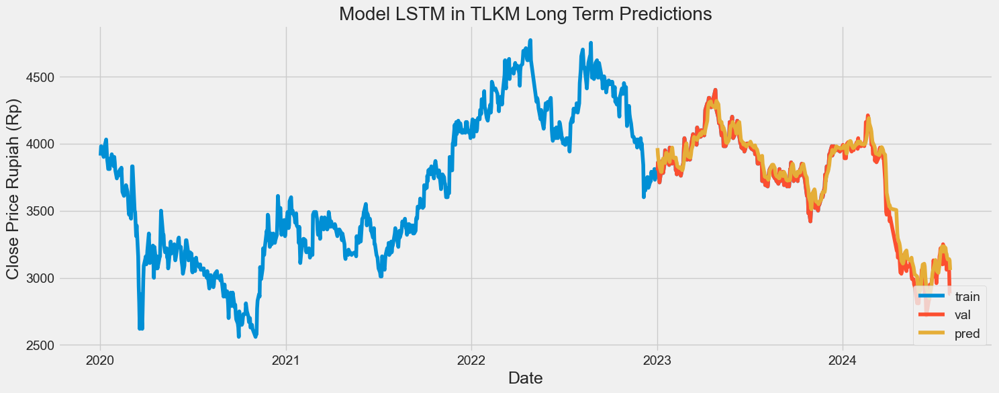

In [979]:
# Visualize the data
# Plot the data
train = TLKM[:"2023"]
valid = TLKM["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in TLKM Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [980]:
# Evaluating the sequence
rmse = return_rmse(TLKM_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 87.04791807622357.
The root mean squared error after normalization is 0.05340363072160954.


#### GRU Predictions

In [981]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 1s 186ms/step - loss: 0.0029
Epoch 2/50
7/7 [==============================] - 1s 180ms/step - loss: 0.0030
Epoch 3/50
7/7 [==============================] - 1s 177ms/step - loss: 0.0033
Epoch 4/50
7/7 [==============================] - 1s 179ms/step - loss: 0.0031
Epoch 5/50
7/7 [==============================] - 1s 176ms/step - loss: 0.0029
Epoch 6/50
7/7 [==============================] - 1s 185ms/step - loss: 0.0027
Epoch 7/50
7/7 [==============================] - 1s 181ms/step - loss: 0.0029
Epoch 8/50
7/7 [==============================] - 1s 183ms/step - loss: 0.0031
Epoch 9/50
7/7 [==============================] - 1s 180ms/step - loss: 0.0031
Epoch 10/50
7/7 [==============================] - 1s 199ms/step - loss: 0.0031
Epoch 11/50
7/7 [==============================] - 1s 197ms/step - loss: 0.0032
Epoch 12/50
7/7 [==============================] - 1s 181ms/step - loss: 0.0030
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 33ms/step


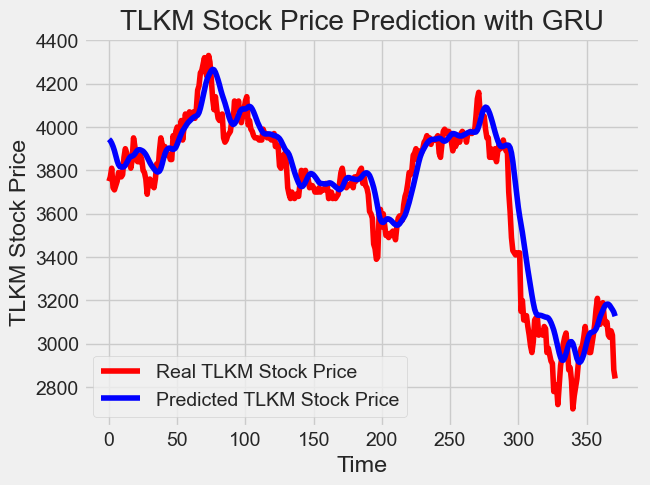

In [982]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"][:"2023"],TLKM["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('TLKM', TLKM_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1496867046.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


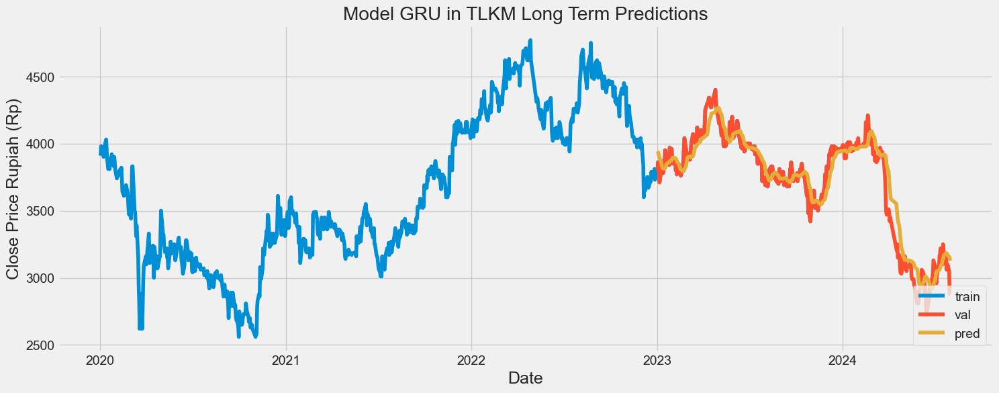

In [983]:
# Visualize the data
# Visualize the data
# Plot the data
train = TLKM[:"2023"]
valid = TLKM["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in TLKM Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [984]:
# Evaluating the sequence
rmse = return_rmse(TLKM_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 112.6294515499667.
The root mean squared error after normalization is 0.06909782303678938.


#### RNN Predictions

In [985]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 2s 57ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0016 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 52ms/step - loss: 0.0018 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 2s 59ms/step - loss: 0.0017 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 2s 59ms/step - loss: 0.0017 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 2s 75ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 2s 59ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 2s 55ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 49ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 48ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 23ms/step


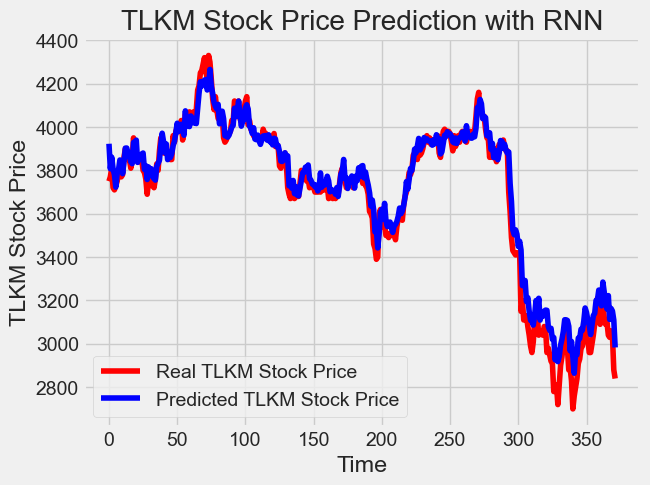

In [986]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"][:"2023"],TLKM["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('TLKM', TLKM_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1235161846.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


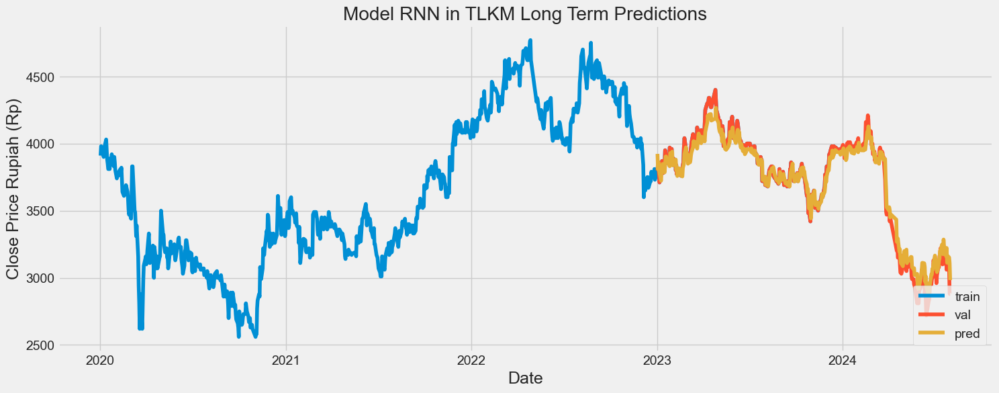

In [987]:
# Visualize the data
# Visualize the data
# Plot the data
train = TLKM[:"2023"]
valid = TLKM["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in TLKM Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [988]:
# Evaluating the sequence
rmse = return_rmse(TLKM_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 68.54494166751311.
The root mean squared error after normalization is 0.042052111452462036.


### BBCA

#### Data Preparation

In [989]:
BBCA["close"]

date
2020-01-02    33450
2020-01-03    34000
2020-01-06    33675
2020-01-07    33700
2020-01-08    33400
              ...  
2024-07-25    10300
2024-07-26    10325
2024-07-29    10250
2024-07-30    10175
2024-07-31    10275
Name: close, Length: 1107, dtype: int64

#### Data Split

#### LSTM Predictions

#### GRU Predictions

#### RNN Predictions